In [1]:
# Load packages
from datetime import datetime
import logging
import math
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import seaborn as sns
import scipy
import sys

In [2]:
# declare universal variables
CONDITION = 'ptd'
CONDITION_CLINICAL_DF = 'PTD'
SUFFIX = ' (protein)'

In [3]:
# Set up logger
os.remove('spearman.standardized.interomics.' + CONDITION + '.pairs.all.miniDP3.log')
logger = logging.getLogger('analytics')

# Set the logging level
logger.setLevel(logging.INFO)

# Define a log format
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')

# Create a console handler to output log messages to the console
console_handler = logging.StreamHandler()
console_handler.setFormatter(formatter)
logger.addHandler(console_handler)

# (Optional) Create a file handler to log messages to a file
file_handler = logging.FileHandler('spearman.standardized.interomics.' + CONDITION + '.pairs.all.miniDP3.log')
file_handler.setFormatter(formatter)
logger.addHandler(file_handler)

In [4]:
dfpb = pd.read_table('../data/proteins-final-adjusted.csv', sep=',', dtype={'Patient-ID':str})
dfmb = pd.read_table('../data/metabolites-final-adjusted.csv', sep=',', dtype={'Patient-ID':str})
dfmirna = pd.read_table('../data/mirna-final-adjusted.csv', sep=',', dtype={'Patient-ID':str})
dftb = pd.read_table('../data/transcripts-final-adjusted.csv', sep=',', dtype={'Patient-ID':str})
dfph = pd.read_table('../data/PlacentalHistopathologyReportsCleaned.csv', sep=',', dtype={'Patient-ID':str})
dfph2 = pd.read_table('../data/PlacentalHistopathologySlideFeaturesCleaned.csv', sep=',', dtype={'Patient-ID':str})

dfp_analyte = pd.read_table('../data/protein-meta-final.csv', sep=',')
dfm_analyte = pd.read_table('../data/metabolites-meta-final.csv', sep=',')
dfmirna_analyte = pd.read_table('../data/mirna-meta-final.csv', sep=',')
dft_analyte = pd.read_table('../data/transcripts-meta-final.csv', sep=',')

df_clinical = pd.read_table('../data/metadata-final.csv', sep=',', dtype={'Study_ID/ID':str})
df_clinical = df_clinical[df_clinical['Condition']==CONDITION_CLINICAL_DF]

In [5]:
dfpb.shape, dfmb.shape, dfmirna.shape, dftb.shape, dfph.shape, dfph2.shape, df_clinical.shape

((321, 352), (319, 866), (294, 450), (294, 9585), (275, 6), (348, 9), (72, 21))

# Set up annotations

In [6]:
metabolites = {}
for index, row in dfm_analyte.iterrows():
    metabolites[row['CHEMICAL_NAME']] = {'name': row['CHEMICAL_NAME'], 'sub_group': row['SUB_PATHWAY'], 'super_group': row['SUPER_PATHWAY']}
    
miRNAs = {}
for index, row in dfmirna_analyte.iterrows():
    miRNAs[row['Transcript']] = {'name': row['Transcript'], 'sub_group': None, 'super_group': None}
    
proteins = {}
for index, row in dfp_analyte.iterrows():
    proteins[row['Assay'] + SUFFIX] = {'name': row['Assay'], 'sub_group': None, 'super_group': row['Panel']}
    
transcripts = {}
for index, row in dft_analyte.iterrows():
    transcripts[row['Transcript']] = {'name': row['Transcript'], 'sub_group': None, 'super_group': None}
    
histopathology = {}
for item in dfph:
    if item != 'Patient-ID':
        histopathology[item] = {'name': item, 'sub_group': None, 'super_group': None}
for item in dfph2:
    if item != 'Patient-ID':
        histopathology[item] = {'name': item, 'sub_group': None, 'super_group': None}
        
# print the number of included analytes
print('Histopathology Features:', str(len(histopathology)))
print('Metabolites:', str(len(metabolites)))
print('miRNAs:', str(len(miRNAs)))
print('Proteins:', str(len(proteins)))
print('Transcripts:', str(len(transcripts)))
print('Total:', str(len(histopathology)+len(metabolites)+len(miRNAs)+len(proteins)+len(transcripts)))

Histopathology Features: 13
Metabolites: 1032
miRNAs: 2414
Proteins: 452
Transcripts: 51174
Total: 55085


# Merge against prot/met data

In [7]:
dfm_analyte = list(set(metabolites.keys()).intersection(dfmb.columns))
dfmirna_analyte = list(set(miRNAs.keys()).intersection(dfmirna.columns))
dfp_analyte = list(set(proteins.keys()).intersection(dfpb.columns))
dft_analyte = list(set(transcripts.keys()).intersection(dftb.columns))
dfph_measurement = ['MVM', 'FVM', 'AI', 'CI', 'Placental Abnormality']
dfph_measurement2 = ['DVH', 'AVM', 'Syncytial Knots', 'Segmental Avascular Villi', 'DVM', 'Villitis of Unknown Etiology', 'Diffuse Villous Edema', 'Chorangiosis']

# Get all analytes together
analytes = dfph_measurement + dfph_measurement2 + dfm_analyte + dfmirna_analyte + dfp_analyte + dft_analyte

# print the number of included analytes that pass missingness threshold
print('Histopathology Features:', str(len(dfph_measurement)+len(dfph_measurement2)))
print('Metabolites:', str(len(dfm_analyte)))
print('miRNAs:', str(len(dfmirna_analyte)))
print('Proteins:', str(len(dfp_analyte)))
print('Transcripts:', str(len(dft_analyte)))
print('Total:', str(len(analytes)))

Histopathology Features: 13
Metabolites: 865
miRNAs: 448
Proteins: 343
Transcripts: 9582
Total: 11251


In [8]:
df_clinical.head()

,Patient-ID,Condition,LaborInitiation,MaternalAge,isWhite,isBlack,isAsian,Ethnicity,WksGest,PregravidBMI,...,Para,LaborOnset,Smoker,IllicitDrugUser,DeliveryMethod,PregnancyRelatedHypertension,FetalGrowthRestriction,Preeclampsia,InfSex,Birthweight
0,KH-1100,PTD,1,42.0,1.0,0.0,0.0,0.0,35.000000,28.395062,...,1.0,0.0,0.0,0.0,1.0,0,0,0,0.0,2250.0
1,KH-1103,PTD,1,32.0,1.0,0.0,0.0,-1.0,36.428571,24.218750,...,1.0,0.0,0.0,0.0,0.0,0,0,0,1.0,3060.0
37,MJ-0404,PTD,1,29.0,1.0,0.0,0.0,0.0,34.285714,40.138408,...,2.0,0.0,0.0,0.0,1.0,0,0,0,0.0,2800.0
48,MJ-0515,PTD,1,NaN,-1.0,-1.0,-1.0,-1.0,NaN,NaN,...,-1.0,0.0,-1.0,0.0,-1.0,0,0,0,-1.0,NaN
50,MJ-0535,PTD,1,28.0,0.0,1.0,0.0,0.0,33.714286,42.008191,...,1.0,0.0,1.0,1.0,1.0,0,0,0,0.0,1909.0


In [9]:
df = df_clinical.merge(dfph[['Patient-ID'] + list(dfph_measurement)], on=['Patient-ID'], how='left')
print(df.shape)
df = df.merge(dfph2[['Patient-ID'] + list(dfph_measurement2)], on=['Patient-ID'], how='left')
print(df.shape)
df = df.merge(dfpb[['Patient-ID'] + list(dfp_analyte)], on=['Patient-ID'], how='inner')
print(df.shape)
df = df.merge(dfmb[['Patient-ID'] + list(dfm_analyte)], on=['Patient-ID'], how='left')
print(df.shape)
df = df.merge(dfmirna[['Patient-ID'] + list(dfmirna_analyte)], on=['Patient-ID'], how='left')
print(df.shape)
df = df.merge(dftb[['Patient-ID'] + list(dft_analyte)], on=['Patient-ID'], how='left')
print(df.shape)
df = df.fillna(-1)

(72, 26)
(72, 34)
(71, 377)
(71, 1242)
(71, 1690)
(71, 11272)


In [10]:
df.shape, dfpb.shape, dfmb.shape, dfmirna.shape, dftb.shape, dfph.shape, dfph2.shape, df_clinical.shape

((71, 11272),
 (321, 352),
 (319, 866),
 (294, 450),
 (294, 9585),
 (275, 6),
 (348, 9),
 (72, 21))

In [11]:
df['InfSex'].value_counts()

InfSex
1.0    45
0.0    26
Name: count, dtype: int64

In [12]:
df['isWhite'].value_counts()

isWhite
 1.0    50
 0.0    20
-1.0     1
Name: count, dtype: int64

In [13]:
df['isBlack'].value_counts()

isBlack
 0.0    57
 1.0    13
-1.0     1
Name: count, dtype: int64

In [14]:
df['isAsian'].value_counts()

isAsian
 0.0    66
 1.0     4
-1.0     1
Name: count, dtype: int64

In [15]:
df.head()

,Patient-ID,Condition,LaborInitiation,MaternalAge,isWhite,isBlack,isAsian,Ethnicity,WksGest,PregravidBMI,...,RPS8,FKRP,PPM1L,PLCB3,MED27,FZD1,AP1S2,ZDHHC5,NR2C2,MED12L
0,KH-1100,PTD,1,42.0,1.0,0.0,0.0,0.0,35.000000,28.395062,...,5455.0,499.0,254.0,886.0,420.0,365.0,252.0,2745.0,2011.0,3949.0
1,KH-1103,PTD,1,32.0,1.0,0.0,0.0,-1.0,36.428571,24.218750,...,24873.0,391.0,213.0,661.0,469.0,460.0,248.0,2095.0,1922.0,1918.0
2,MJ-0404,PTD,1,29.0,1.0,0.0,0.0,0.0,34.285714,40.138408,...,2949.0,755.0,723.0,1181.0,340.0,773.0,484.0,2495.0,2526.0,2633.0
3,MJ-0535,PTD,1,28.0,0.0,1.0,0.0,0.0,33.714286,42.008191,...,3329.0,813.0,635.0,1256.0,329.0,785.0,522.0,2847.0,2935.0,3425.0
4,MJ-0559,PTD,1,34.0,1.0,0.0,0.0,0.0,34.571429,22.892820,...,2134.0,845.0,702.0,1098.0,223.0,726.0,439.0,2378.0,2765.0,3402.0


# Correlation network

In [16]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.sandbox.stats.multicomp
from statsmodels.genmod.families import family, links
import itertools

In [17]:
drop_cols = ['Patient-ID', 'Grav', 'DeliveryMethod', 
             'Para', 'PrePregWt_Kg', 'Ethnicity', 'isAsian', 
             'isBlack', 'WksGest', 'Condition', 'isWhite', 
             'Race', 'MaternalAge', 'Smoke', 'PregravidBMI',
             'HeightMeters']

# Pairwise GLM

In [18]:
def count_pairs(dat, analytes, proteins, metabolites, mirnas, transcripts, histopathology):

    # Create all possible pairs of inputs
    pairs = list(itertools.combinations(analytes, 2))
    logger.info('Created {} pairs'.format(len(pairs)))
         
    count = 0 
    done = 0
    skipped = 0
    completed = 0

    results = []
    columns = list(dat.columns)

    start_time = datetime.now()
    for (col1, col2) in pairs:

        if (col1 == col2):
            continue
                    
        if (col1 in histopathology.keys()) and (col2 in histopathology.keys()):
            continue
        
        if (col1 in metabolites.keys()) and (col2 in metabolites.keys()):
            continue
            
        if (col1 in mirnas.keys()) and (col2 in mirnas.keys()):
            continue

        if (col1 in proteins.keys()) and (col2 in proteins.keys()):
            continue
        
        if (col1 in transcripts.keys()) and (col2 in transcripts.keys()):
            continue
            
        if (col1 in proteins.keys()):
            name1 = proteins[col1]['name']
            subgroup1 = proteins[col1]['sub_group'] 
            supergroup1 = proteins[col1]['super_group']
            type1 = 'protein'
        elif (col1 in metabolites.keys()):
            name1 = metabolites[col1]['name']
            subgroup1 = metabolites[col1]['sub_group'] 
            supergroup1 = metabolites[col1]['super_group']
            type1 = 'metabolite'
        elif (col1 in mirnas.keys()):
            name1 = mirnas[col1]['name']
            subgroup1 = mirnas[col1]['sub_group'] 
            supergroup1 = mirnas[col1]['super_group']
            type1 = 'miRNA'
        elif (col1 in transcripts.keys()):
            name1 = transcripts[col1]['name']
            subgroup1 = transcripts[col1]['sub_group'] 
            supergroup1 = transcripts[col1]['super_group']
            type1 = 'transcript'
        elif (col1 in histopathology.keys()):
            name1 = histopathology[col1]['name']
            subgroup1 = histopathology[col1]['sub_group'] 
            supergroup1 = histopathology[col1]['super_group']
            type1 = 'histopathology'

        else:
            logger.warning('Col1 {} not found in any annotation'.format(col1))
            name1 = None
            subgroup1 = None
            supergroup1 = None
            type1 = None
            
        if (col2 in proteins.keys()):
            name2 = proteins[col2]['name']
            subgroup2 = proteins[col2]['sub_group'] 
            supergroup2 = proteins[col2]['super_group']
            type2 = 'protein'
        elif (col2 in metabolites.keys()):
            name2 = metabolites[col2]['name']
            subgroup2 = metabolites[col2]['sub_group'] 
            supergroup2 = metabolites[col2]['super_group']
            type2 = 'metabolite'
        elif (col2 in mirnas.keys()):
            name2 = mirnas[col2]['name']
            subgroup2 = mirnas[col2]['sub_group'] 
            supergroup2 = mirnas[col2]['super_group']
            type2 = 'miRNA'
        elif (col2 in transcripts.keys()):
            name2 = transcripts[col2]['name']
            subgroup2 = transcripts[col2]['sub_group'] 
            supergroup2 = transcripts[col2]['super_group']
            type2 = 'transcript'
        elif (col2 in histopathology.keys()):
            name2 = histopathology[col2]['name']
            subgroup2 = histopathology[col2]['sub_group'] 
            supergroup2 = histopathology[col2]['super_group']
            type2 = 'histopathology'
    
        else:
            logger.warning('Col2 {} not found in any annotation'.format(col2))
            name2 = None
            subgroup2 = None
            supergroup2 = None
            type2 = None
            
        count += 1
        
    print('Running {} pairs'.format(count))

count_pairs(df, analytes, proteins, metabolites, miRNAs, transcripts, histopathology)

2024-02-04 20:55:52,788 - analytics - INFO - Created 63286875 pairs


Running 16851765 pairs


In [19]:
def evaluate_effect_size(df, logger):
    # evaluate effect size - cohen's d
    df_no_effect = df[abs(df['coef'])<0.01]
    df_very_small = df[abs(df['coef'])>=0.01]
    df_very_small = df_very_small[abs(df_very_small['coef'])<0.1]
    df_small = df[abs(df['coef'])>=0.1]
    df_small = df_small[abs(df_small['coef'])<0.2]
    df_medium = df[abs(df['coef'])>=0.2]
    df_medium  = df_medium[abs(df_medium['coef'])<0.3]
    df_medium_large = df[abs(df['coef'])>=0.3]
    df_medium_large = df_medium_large[abs(df_medium_large['coef'])<0.5]
    df_large = df[abs(df['coef'])>=0.5]
    df_large = df_large[abs(df_large['coef'])<0.7]
    df_very_large = df[abs(df['coef'])>=0.7]
    df_very_large = df_very_large[abs(df_very_large['coef'])<0.9]
    df_huge = df[abs(df['coef'])>=0.9]
    
    # print info on effect sizes
    logger.info('Number of Analyte Pairs with No Monotonic Relationship: {}'.format(str(df_no_effect.shape[0])))
    logger.info('Number of Analyte Pairs with Very Weak Monotonic Relationship: {}'.format(str(df_very_small.shape[0])))
    logger.info('Number of Analyte Pairs with Weak Monotonic Relationship: {}'.format(str(df_small.shape[0])))
    logger.info('Number of Analyte Pairs with Moderate Monotonic Relationship: {}'.format(str(df_medium.shape[0])))
    logger.info('Number of Analyte Pairs with Moderate Strong Monotonic Relationship: {}'.format(str(df_medium_large.shape[0])))
    logger.info('Number of Analyte Pairs with Strong Monotonic Relationship: {}'.format(str(df_large.shape[0])))
    logger.info('Number of Analyte Pairs with Very Strong Monotonic Relationship: {}'.format(str(df_very_large.shape[0])))
    logger.info('Number of Analyte Pairs with Near Perfect Monotonic Relationship: {}'.format(str(df_huge.shape[0])))
    logger.info('\n')
    

def run_spearman_pairwise(dat, condition, analytes, proteins, metabolites, mirnas, transcripts, histopathology, max_run=None):

    # Create all possible pairs of inputs
    pairs = list(itertools.combinations(analytes, 2))
    logger.info('Created {} pairs'.format(len(pairs)))
    
    f_failed = open('failed.spearman.standardized.interomics.' + condition + '.pairs.all.miniDP3.txt', mode='w')
    f_output = 'spearman.standardized.interomics.' + condition + '.all.miniDP3.txt'
    f_output_sig = 'spearman.standardized.interomics.' + condition + '.sig.miniDP3.txt'
         
    count = 0 
    done = 0
    skipped = 0
    completed = 0

    results = []
    columns = list(dat.columns)

    start_time = datetime.now()
    for (col1, col2) in pairs:

        if (col1 == col2):
            continue
                           
        if (col1 in histopathology.keys()) and (col2 in histopathology.keys()):
            continue
        
        if (col1 in metabolites.keys()) and (col2 in metabolites.keys()):
            continue
            
        if (col1 in mirnas.keys()) and (col2 in mirnas.keys()):
            continue

        if (col1 in proteins.keys()) and (col2 in proteins.keys()):
            continue
        
        if (col1 in transcripts.keys()) and (col2 in transcripts.keys()):
            continue

        if (col1 in proteins.keys()):
            name1 = proteins[col1]['name']
            subgroup1 = proteins[col1]['sub_group'] 
            supergroup1 = proteins[col1]['super_group']
            type1 = 'protein'
        elif (col1 in metabolites.keys()):
            name1 = metabolites[col1]['name']
            subgroup1 = metabolites[col1]['sub_group'] 
            supergroup1 = metabolites[col1]['super_group']
            type1 = 'metabolite'
        elif (col1 in mirnas.keys()):
            name1 = mirnas[col1]['name']
            subgroup1 = mirnas[col1]['sub_group'] 
            supergroup1 = mirnas[col1]['super_group']
            type1 = 'miRNA'
        elif (col1 in transcripts.keys()):
            name1 = transcripts[col1]['name']
            subgroup1 = transcripts[col1]['sub_group'] 
            supergroup1 = transcripts[col1]['super_group']
            type1 = 'transcript'
        elif (col1 in histopathology.keys()):
            name1 = histopathology[col1]['name']
            subgroup1 = histopathology[col1]['sub_group'] 
            supergroup1 = histopathology[col1]['super_group']
            type1 = 'histopathology'
        else:
            logger.warning('Col1 {} not found in any annotation'.format(col1))
            name1 = None
            subgroup1 = None
            supergroup1 = None
            type1 = None
            
        if (col2 in proteins.keys()):
            name2 = proteins[col2]['name']
            subgroup2 = proteins[col2]['sub_group'] 
            supergroup2 = proteins[col2]['super_group']
            type2 = 'protein'
        elif (col2 in metabolites.keys()):
            name2 = metabolites[col2]['name']
            subgroup2 = metabolites[col2]['sub_group'] 
            supergroup2 = metabolites[col2]['super_group']
            type2 = 'metabolite'
        elif (col2 in mirnas.keys()):
            name2 = mirnas[col2]['name']
            subgroup2 = mirnas[col2]['sub_group'] 
            supergroup2 = mirnas[col2]['super_group']
            type2 = 'miRNA'
        elif (col2 in transcripts.keys()):
            name2 = transcripts[col2]['name']
            subgroup2 = transcripts[col2]['sub_group'] 
            supergroup2 = transcripts[col2]['super_group']
            type2 = 'transcript'
        elif (col2 in histopathology.keys()):
            name2 = histopathology[col2]['name']
            subgroup2 = histopathology[col2]['sub_group'] 
            supergroup2 = histopathology[col2]['super_group']
            type2 = 'histopathology'
        else:
            logger.warning('Col2 {} not found in any annotation'.format(col2))
            name2 = None
            subgroup2 = None
            supergroup2 = None
            type2 = None

        sub = dat[['Patient-ID', col1, col2]].copy()
        sub.rename(columns={col1:'analyte1'}, inplace=True)
        sub.rename(columns={col2:'analyte2'}, inplace=True)


        if (sub['analyte1'].skew() > 1.5) | (sub['analyte1'].skew() < -1.5):

            #logger.info('Setting gamma family for skewed analyte %s'%(col))

            # Set any zero values to 1/2 the smallest value
            sub.loc[sub['analyte1']==0, 'analyte1'] = (sub.loc[sub['analyte1']>0, 'analyte1'].min() / 2.0)
            

        # z-score transform dependent variable data
        if col2 not in histopathology.keys():
            sub['analyte2'] = sub['analyte2'].astype(np.float64)
            sub['analyte2'] = (sub['analyte2'] - sub['analyte2'].mean() ) / sub['analyte2'].std()

            
        try:
            coef, p = scipy.stats.spearmanr(sub['analyte1'], sub['analyte2'])
            results.append((col1, name1, type1, supergroup1, subgroup1, col2, name2, type2, supergroup2, subgroup2, coef, p))
            completed += 1

        except Exception as e:
            logger.info('Failed analytes {} {} with error {}'.format(col1, col2, str(e)))
            f_failed.write(col1 + '\t' + col2 + '\n')
            
            
        count += 1
        if (max_run is not None) and (count >= max_run):
            break
        
        if (count % 1000) == 0:
            elapsed_time = datetime.now() - start_time    
            logger.info('Finished {} in {:.3f} seconds (skipped {})'.format(count, elapsed_time.total_seconds(), skipped))
            
    df = pd.DataFrame(results, columns=['col1', 'name1', 'type1', 'supergroup1', 'subgroup1', 'col2', 'name2', 'type2', 'supergroup2', 'subgroup2', 'coef', 'p-value'])
    df.sort_values(['p-value'], ascending=True, inplace=True)
    f_failed.close()

    np.seterr(all='warn')
    logger.info('\nFinished analyzing all {} pairs!'.format(str(count)))
    logger.info('Number of analyte pairs with converged formula: {}'.format(str(df.shape[0])))
    (adj_pval_index, adj_pval, _, _) = statsmodels.sandbox.stats.multicomp.multipletests(df.loc[~df['p-value'].isnull(), 'p-value'], alpha=0.05, method='fdr_bh')
    df.loc[~df['p-value'].isnull(), 'pval_adj'] = adj_pval
    df.sort_values(['pval_adj'], ascending=True, inplace=True)
    df.to_csv(f_output, index=False, sep='\t')
    
    # filter for significance
    df = df[df['pval_adj']<0.05]  #benjammini-hochman
    #bonferroni_correction = 0.05/count
    #df = df[df['p-value']<bonferroni_correction]  #bonferroni correction
    #logger.info('\nBonferroni Correction: p<{}'.format(str(bonferroni_correction)))
    logger.info('Number of analyte pairs whose levels are significantly associated: {}'.format(str(df.shape[0])))
    df.to_csv(f_output_sig, index=False, sep='\t')
    
    # evaluate effect size - cohen's d
    logger.info('Effect Sizes (Cohen\'s D ) For Significant Correlations:')
    evaluate_effect_size(df, logger)
    logger.info('\nFinished all correlation analyses!')
    
    return df

In [20]:
os.remove('failed.spearman.standardized.interomics.' + CONDITION + '.pairs.all.miniDP3.txt')
os.remove('spearman.standardized.interomics.' + CONDITION + '.all.miniDP3.txt')
os.remove('spearman.standardized.interomics.' + CONDITION + '.sig.miniDP3.txt')

In [21]:
spearman_pairwise = run_spearman_pairwise(df, CONDITION, analytes, proteins, metabolites, miRNAs, transcripts, histopathology)

2024-02-04 20:56:55,843 - analytics - INFO - Created 63286875 pairs
2024-02-04 20:56:58,035 - analytics - INFO - Finished 1000 in 2.189 seconds (skipped 0)
2024-02-04 20:57:00,227 - analytics - INFO - Finished 2000 in 4.380 seconds (skipped 0)
2024-02-04 20:57:02,366 - analytics - INFO - Finished 3000 in 6.520 seconds (skipped 0)
2024-02-04 20:57:04,566 - analytics - INFO - Finished 4000 in 8.720 seconds (skipped 0)
2024-02-04 20:57:06,853 - analytics - INFO - Finished 5000 in 11.007 seconds (skipped 0)
2024-02-04 20:57:09,060 - analytics - INFO - Finished 6000 in 13.214 seconds (skipped 0)
2024-02-04 20:57:11,311 - analytics - INFO - Finished 7000 in 15.465 seconds (skipped 0)
2024-02-04 20:57:13,661 - analytics - INFO - Finished 8000 in 17.815 seconds (skipped 0)
2024-02-04 20:57:15,985 - analytics - INFO - Finished 9000 in 20.139 seconds (skipped 0)
2024-02-04 20:57:18,336 - analytics - INFO - Finished 10000 in 22.490 seconds (skipped 0)
2024-02-04 20:57:20,760 - analytics - INFO - 

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
2024-02-04 21:01:37,653 - analytics - INFO - Finished 100000 in 281.807 seconds (skipped 0)
/usr/local/lib/python3.11/site-p

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
2024-02-04 21:01:47,234 - analytics - INFO - Finished 105000 in 291.388 seconds (skipped 0)
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-p

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/usr/local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the

2024-02-04 21:05:47,649 - analytics - INFO - Finished 199000 in 531.803 seconds (skipped 0)
2024-02-04 21:05:50,420 - analytics - INFO - Finished 200000 in 534.573 seconds (skipped 0)
2024-02-04 21:05:53,226 - analytics - INFO - Finished 201000 in 537.379 seconds (skipped 0)
2024-02-04 21:05:56,032 - analytics - INFO - Finished 202000 in 540.186 seconds (skipped 0)
2024-02-04 21:05:59,230 - analytics - INFO - Finished 203000 in 543.384 seconds (skipped 0)
2024-02-04 21:06:02,101 - analytics - INFO - Finished 204000 in 546.255 seconds (skipped 0)
2024-02-04 21:06:05,062 - analytics - INFO - Finished 205000 in 549.216 seconds (skipped 0)
2024-02-04 21:06:08,238 - analytics - INFO - Finished 206000 in 552.392 seconds (skipped 0)
2024-02-04 21:06:11,906 - analytics - INFO - Finished 207000 in 556.060 seconds (skipped 0)
2024-02-04 21:06:14,914 - analytics - INFO - Finished 208000 in 559.068 seconds (skipped 0)
2024-02-04 21:06:17,834 - analytics - INFO - Finished 209000 in 561.988 seconds 

2024-02-04 21:09:49,738 - analytics - INFO - Finished 289000 in 773.892 seconds (skipped 0)
2024-02-04 21:09:52,588 - analytics - INFO - Finished 290000 in 776.741 seconds (skipped 0)
2024-02-04 21:09:55,548 - analytics - INFO - Finished 291000 in 779.702 seconds (skipped 0)
2024-02-04 21:09:58,418 - analytics - INFO - Finished 292000 in 782.572 seconds (skipped 0)
2024-02-04 21:10:00,795 - analytics - INFO - Finished 293000 in 784.948 seconds (skipped 0)
2024-02-04 21:10:03,123 - analytics - INFO - Finished 294000 in 787.277 seconds (skipped 0)
2024-02-04 21:10:05,500 - analytics - INFO - Finished 295000 in 789.654 seconds (skipped 0)
2024-02-04 21:10:07,823 - analytics - INFO - Finished 296000 in 791.977 seconds (skipped 0)
2024-02-04 21:10:10,210 - analytics - INFO - Finished 297000 in 794.364 seconds (skipped 0)
2024-02-04 21:10:12,821 - analytics - INFO - Finished 298000 in 796.975 seconds (skipped 0)
2024-02-04 21:10:15,289 - analytics - INFO - Finished 299000 in 799.442 seconds 

2024-02-04 21:13:59,746 - analytics - INFO - Finished 378000 in 1023.900 seconds (skipped 0)
2024-02-04 21:14:02,375 - analytics - INFO - Finished 379000 in 1026.529 seconds (skipped 0)
2024-02-04 21:14:05,003 - analytics - INFO - Finished 380000 in 1029.157 seconds (skipped 0)
2024-02-04 21:14:07,520 - analytics - INFO - Finished 381000 in 1031.674 seconds (skipped 0)
2024-02-04 21:14:10,121 - analytics - INFO - Finished 382000 in 1034.275 seconds (skipped 0)
2024-02-04 21:14:12,989 - analytics - INFO - Finished 383000 in 1037.143 seconds (skipped 0)
2024-02-04 21:14:15,783 - analytics - INFO - Finished 384000 in 1039.937 seconds (skipped 0)
2024-02-04 21:14:18,384 - analytics - INFO - Finished 385000 in 1042.538 seconds (skipped 0)
2024-02-04 21:14:21,233 - analytics - INFO - Finished 386000 in 1045.387 seconds (skipped 0)
2024-02-04 21:14:23,738 - analytics - INFO - Finished 387000 in 1047.892 seconds (skipped 0)
2024-02-04 21:14:26,342 - analytics - INFO - Finished 388000 in 1050.4

2024-02-04 21:18:13,953 - analytics - INFO - Finished 467000 in 1278.106 seconds (skipped 0)
2024-02-04 21:18:16,683 - analytics - INFO - Finished 468000 in 1280.837 seconds (skipped 0)
2024-02-04 21:18:19,354 - analytics - INFO - Finished 469000 in 1283.508 seconds (skipped 0)
2024-02-04 21:18:21,904 - analytics - INFO - Finished 470000 in 1286.058 seconds (skipped 0)
2024-02-04 21:18:24,470 - analytics - INFO - Finished 471000 in 1288.624 seconds (skipped 0)
2024-02-04 21:18:27,055 - analytics - INFO - Finished 472000 in 1291.208 seconds (skipped 0)
2024-02-04 21:18:29,675 - analytics - INFO - Finished 473000 in 1293.829 seconds (skipped 0)
2024-02-04 21:18:32,277 - analytics - INFO - Finished 474000 in 1296.431 seconds (skipped 0)
2024-02-04 21:18:34,870 - analytics - INFO - Finished 475000 in 1299.024 seconds (skipped 0)
2024-02-04 21:18:37,441 - analytics - INFO - Finished 476000 in 1301.595 seconds (skipped 0)
2024-02-04 21:18:40,030 - analytics - INFO - Finished 477000 in 1304.1

2024-02-04 21:22:37,923 - analytics - INFO - Finished 556000 in 1542.077 seconds (skipped 0)
2024-02-04 21:22:41,450 - analytics - INFO - Finished 557000 in 1545.603 seconds (skipped 0)
2024-02-04 21:22:44,911 - analytics - INFO - Finished 558000 in 1549.065 seconds (skipped 0)
2024-02-04 21:22:48,985 - analytics - INFO - Finished 559000 in 1553.139 seconds (skipped 0)
2024-02-04 21:22:52,059 - analytics - INFO - Finished 560000 in 1556.213 seconds (skipped 0)
2024-02-04 21:22:55,001 - analytics - INFO - Finished 561000 in 1559.154 seconds (skipped 0)
2024-02-04 21:22:57,929 - analytics - INFO - Finished 562000 in 1562.083 seconds (skipped 0)
2024-02-04 21:23:00,750 - analytics - INFO - Finished 563000 in 1564.904 seconds (skipped 0)
2024-02-04 21:23:03,684 - analytics - INFO - Finished 564000 in 1567.838 seconds (skipped 0)
2024-02-04 21:23:06,531 - analytics - INFO - Finished 565000 in 1570.685 seconds (skipped 0)
2024-02-04 21:23:09,527 - analytics - INFO - Finished 566000 in 1573.6

2024-02-04 21:26:49,009 - analytics - INFO - Finished 645000 in 1793.162 seconds (skipped 0)
2024-02-04 21:26:51,853 - analytics - INFO - Finished 646000 in 1796.007 seconds (skipped 0)
2024-02-04 21:26:54,711 - analytics - INFO - Finished 647000 in 1798.865 seconds (skipped 0)
2024-02-04 21:26:57,562 - analytics - INFO - Finished 648000 in 1801.716 seconds (skipped 0)
2024-02-04 21:27:00,423 - analytics - INFO - Finished 649000 in 1804.577 seconds (skipped 0)
2024-02-04 21:27:03,343 - analytics - INFO - Finished 650000 in 1807.497 seconds (skipped 0)
2024-02-04 21:27:06,219 - analytics - INFO - Finished 651000 in 1810.373 seconds (skipped 0)
2024-02-04 21:27:09,074 - analytics - INFO - Finished 652000 in 1813.228 seconds (skipped 0)
2024-02-04 21:27:12,064 - analytics - INFO - Finished 653000 in 1816.218 seconds (skipped 0)
2024-02-04 21:27:15,034 - analytics - INFO - Finished 654000 in 1819.188 seconds (skipped 0)
2024-02-04 21:27:17,895 - analytics - INFO - Finished 655000 in 1822.0

2024-02-04 21:30:45,445 - analytics - INFO - Finished 734000 in 2029.599 seconds (skipped 0)
2024-02-04 21:30:48,407 - analytics - INFO - Finished 735000 in 2032.561 seconds (skipped 0)
2024-02-04 21:30:51,264 - analytics - INFO - Finished 736000 in 2035.417 seconds (skipped 0)
2024-02-04 21:30:54,205 - analytics - INFO - Finished 737000 in 2038.359 seconds (skipped 0)
2024-02-04 21:30:56,712 - analytics - INFO - Finished 738000 in 2040.866 seconds (skipped 0)
2024-02-04 21:30:59,024 - analytics - INFO - Finished 739000 in 2043.178 seconds (skipped 0)
2024-02-04 21:31:01,370 - analytics - INFO - Finished 740000 in 2045.524 seconds (skipped 0)
2024-02-04 21:31:03,748 - analytics - INFO - Finished 741000 in 2047.902 seconds (skipped 0)
2024-02-04 21:31:06,110 - analytics - INFO - Finished 742000 in 2050.264 seconds (skipped 0)
2024-02-04 21:31:08,489 - analytics - INFO - Finished 743000 in 2052.643 seconds (skipped 0)
2024-02-04 21:31:10,823 - analytics - INFO - Finished 744000 in 2054.9

2024-02-04 21:34:39,015 - analytics - INFO - Finished 823000 in 2263.169 seconds (skipped 0)
2024-02-04 21:34:41,848 - analytics - INFO - Finished 824000 in 2266.002 seconds (skipped 0)
2024-02-04 21:34:44,674 - analytics - INFO - Finished 825000 in 2268.828 seconds (skipped 0)
2024-02-04 21:34:47,595 - analytics - INFO - Finished 826000 in 2271.749 seconds (skipped 0)
2024-02-04 21:34:50,435 - analytics - INFO - Finished 827000 in 2274.589 seconds (skipped 0)
2024-02-04 21:34:53,311 - analytics - INFO - Finished 828000 in 2277.464 seconds (skipped 0)
2024-02-04 21:34:56,152 - analytics - INFO - Finished 829000 in 2280.305 seconds (skipped 0)
2024-02-04 21:34:59,004 - analytics - INFO - Finished 830000 in 2283.158 seconds (skipped 0)
2024-02-04 21:35:01,795 - analytics - INFO - Finished 831000 in 2285.949 seconds (skipped 0)
2024-02-04 21:35:04,160 - analytics - INFO - Finished 832000 in 2288.314 seconds (skipped 0)
2024-02-04 21:35:06,572 - analytics - INFO - Finished 833000 in 2290.7

2024-02-04 21:38:31,388 - analytics - INFO - Finished 912000 in 2495.542 seconds (skipped 0)
2024-02-04 21:38:33,724 - analytics - INFO - Finished 913000 in 2497.878 seconds (skipped 0)
2024-02-04 21:38:36,168 - analytics - INFO - Finished 914000 in 2500.322 seconds (skipped 0)
2024-02-04 21:38:38,946 - analytics - INFO - Finished 915000 in 2503.100 seconds (skipped 0)
2024-02-04 21:38:41,815 - analytics - INFO - Finished 916000 in 2505.969 seconds (skipped 0)
2024-02-04 21:38:44,823 - analytics - INFO - Finished 917000 in 2508.977 seconds (skipped 0)
2024-02-04 21:38:48,079 - analytics - INFO - Finished 918000 in 2512.233 seconds (skipped 0)
2024-02-04 21:38:51,165 - analytics - INFO - Finished 919000 in 2515.319 seconds (skipped 0)
2024-02-04 21:38:54,220 - analytics - INFO - Finished 920000 in 2518.374 seconds (skipped 0)
2024-02-04 21:38:57,598 - analytics - INFO - Finished 921000 in 2521.751 seconds (skipped 0)
2024-02-04 21:39:00,964 - analytics - INFO - Finished 922000 in 2525.1

2024-02-04 21:42:30,375 - analytics - INFO - Finished 1001000 in 2734.529 seconds (skipped 0)
2024-02-04 21:42:33,214 - analytics - INFO - Finished 1002000 in 2737.368 seconds (skipped 0)
2024-02-04 21:42:36,151 - analytics - INFO - Finished 1003000 in 2740.305 seconds (skipped 0)
2024-02-04 21:42:39,021 - analytics - INFO - Finished 1004000 in 2743.175 seconds (skipped 0)
2024-02-04 21:42:41,918 - analytics - INFO - Finished 1005000 in 2746.072 seconds (skipped 0)
2024-02-04 21:42:44,787 - analytics - INFO - Finished 1006000 in 2748.941 seconds (skipped 0)
2024-02-04 21:42:47,698 - analytics - INFO - Finished 1007000 in 2751.852 seconds (skipped 0)
2024-02-04 21:42:50,107 - analytics - INFO - Finished 1008000 in 2754.261 seconds (skipped 0)
2024-02-04 21:42:52,420 - analytics - INFO - Finished 1009000 in 2756.574 seconds (skipped 0)
2024-02-04 21:42:54,785 - analytics - INFO - Finished 1010000 in 2758.939 seconds (skipped 0)
2024-02-04 21:42:57,163 - analytics - INFO - Finished 101100

2024-02-04 21:46:13,269 - analytics - INFO - Finished 1089000 in 2957.423 seconds (skipped 0)
2024-02-04 21:46:16,271 - analytics - INFO - Finished 1090000 in 2960.424 seconds (skipped 0)
2024-02-04 21:46:19,117 - analytics - INFO - Finished 1091000 in 2963.271 seconds (skipped 0)
2024-02-04 21:46:21,917 - analytics - INFO - Finished 1092000 in 2966.071 seconds (skipped 0)
2024-02-04 21:46:24,705 - analytics - INFO - Finished 1093000 in 2968.859 seconds (skipped 0)
2024-02-04 21:46:27,501 - analytics - INFO - Finished 1094000 in 2971.655 seconds (skipped 0)
2024-02-04 21:46:30,324 - analytics - INFO - Finished 1095000 in 2974.478 seconds (skipped 0)
2024-02-04 21:46:33,159 - analytics - INFO - Finished 1096000 in 2977.313 seconds (skipped 0)
2024-02-04 21:46:35,905 - analytics - INFO - Finished 1097000 in 2980.059 seconds (skipped 0)
2024-02-04 21:46:38,676 - analytics - INFO - Finished 1098000 in 2982.830 seconds (skipped 0)
2024-02-04 21:46:41,580 - analytics - INFO - Finished 109900

2024-02-04 21:49:53,299 - analytics - INFO - Finished 1177000 in 3177.453 seconds (skipped 0)
2024-02-04 21:49:55,611 - analytics - INFO - Finished 1178000 in 3179.765 seconds (skipped 0)
2024-02-04 21:49:57,945 - analytics - INFO - Finished 1179000 in 3182.099 seconds (skipped 0)
2024-02-04 21:50:00,204 - analytics - INFO - Finished 1180000 in 3184.358 seconds (skipped 0)
2024-02-04 21:50:02,686 - analytics - INFO - Finished 1181000 in 3186.840 seconds (skipped 0)
2024-02-04 21:50:05,006 - analytics - INFO - Finished 1182000 in 3189.160 seconds (skipped 0)
2024-02-04 21:50:07,305 - analytics - INFO - Finished 1183000 in 3191.459 seconds (skipped 0)
2024-02-04 21:50:09,897 - analytics - INFO - Finished 1184000 in 3194.051 seconds (skipped 0)
2024-02-04 21:50:12,976 - analytics - INFO - Finished 1185000 in 3197.130 seconds (skipped 0)
2024-02-04 21:50:16,080 - analytics - INFO - Finished 1186000 in 3200.234 seconds (skipped 0)
2024-02-04 21:50:18,915 - analytics - INFO - Finished 118700

2024-02-04 21:53:48,603 - analytics - INFO - Finished 1265000 in 3412.757 seconds (skipped 0)
2024-02-04 21:53:51,377 - analytics - INFO - Finished 1266000 in 3415.531 seconds (skipped 0)
2024-02-04 21:53:53,827 - analytics - INFO - Finished 1267000 in 3417.981 seconds (skipped 0)
2024-02-04 21:53:56,116 - analytics - INFO - Finished 1268000 in 3420.270 seconds (skipped 0)
2024-02-04 21:53:58,418 - analytics - INFO - Finished 1269000 in 3422.571 seconds (skipped 0)
2024-02-04 21:54:00,657 - analytics - INFO - Finished 1270000 in 3424.811 seconds (skipped 0)
2024-02-04 21:54:02,929 - analytics - INFO - Finished 1271000 in 3427.083 seconds (skipped 0)
2024-02-04 21:54:05,225 - analytics - INFO - Finished 1272000 in 3429.379 seconds (skipped 0)
2024-02-04 21:54:07,469 - analytics - INFO - Finished 1273000 in 3431.622 seconds (skipped 0)
2024-02-04 21:54:09,750 - analytics - INFO - Finished 1274000 in 3433.903 seconds (skipped 0)
2024-02-04 21:54:12,303 - analytics - INFO - Finished 127500

2024-02-04 21:57:28,721 - analytics - INFO - Finished 1353000 in 3632.875 seconds (skipped 0)
2024-02-04 21:57:31,125 - analytics - INFO - Finished 1354000 in 3635.279 seconds (skipped 0)
2024-02-04 21:57:33,495 - analytics - INFO - Finished 1355000 in 3637.649 seconds (skipped 0)
2024-02-04 21:57:35,783 - analytics - INFO - Finished 1356000 in 3639.937 seconds (skipped 0)
2024-02-04 21:57:38,026 - analytics - INFO - Finished 1357000 in 3642.180 seconds (skipped 0)
2024-02-04 21:57:40,302 - analytics - INFO - Finished 1358000 in 3644.456 seconds (skipped 0)
2024-02-04 21:57:42,628 - analytics - INFO - Finished 1359000 in 3646.782 seconds (skipped 0)
2024-02-04 21:57:44,957 - analytics - INFO - Finished 1360000 in 3649.111 seconds (skipped 0)
2024-02-04 21:57:47,210 - analytics - INFO - Finished 1361000 in 3651.364 seconds (skipped 0)
2024-02-04 21:57:49,498 - analytics - INFO - Finished 1362000 in 3653.651 seconds (skipped 0)
2024-02-04 21:57:51,826 - analytics - INFO - Finished 136300

2024-02-04 22:00:57,826 - analytics - INFO - Finished 1441000 in 3841.980 seconds (skipped 0)
2024-02-04 22:01:00,115 - analytics - INFO - Finished 1442000 in 3844.268 seconds (skipped 0)
2024-02-04 22:01:02,390 - analytics - INFO - Finished 1443000 in 3846.544 seconds (skipped 0)
2024-02-04 22:01:04,702 - analytics - INFO - Finished 1444000 in 3848.856 seconds (skipped 0)
2024-02-04 22:01:06,990 - analytics - INFO - Finished 1445000 in 3851.144 seconds (skipped 0)
2024-02-04 22:01:09,275 - analytics - INFO - Finished 1446000 in 3853.428 seconds (skipped 0)
2024-02-04 22:01:11,816 - analytics - INFO - Finished 1447000 in 3855.970 seconds (skipped 0)
2024-02-04 22:01:14,185 - analytics - INFO - Finished 1448000 in 3858.339 seconds (skipped 0)
2024-02-04 22:01:16,489 - analytics - INFO - Finished 1449000 in 3860.642 seconds (skipped 0)
2024-02-04 22:01:18,794 - analytics - INFO - Finished 1450000 in 3862.948 seconds (skipped 0)
2024-02-04 22:01:21,077 - analytics - INFO - Finished 145100

2024-02-04 22:04:42,216 - analytics - INFO - Finished 1529000 in 4066.370 seconds (skipped 0)
2024-02-04 22:04:44,515 - analytics - INFO - Finished 1530000 in 4068.669 seconds (skipped 0)
2024-02-04 22:04:46,770 - analytics - INFO - Finished 1531000 in 4070.923 seconds (skipped 0)
2024-02-04 22:04:49,122 - analytics - INFO - Finished 1532000 in 4073.276 seconds (skipped 0)
2024-02-04 22:04:51,405 - analytics - INFO - Finished 1533000 in 4075.559 seconds (skipped 0)
2024-02-04 22:04:53,716 - analytics - INFO - Finished 1534000 in 4077.870 seconds (skipped 0)
2024-02-04 22:04:56,023 - analytics - INFO - Finished 1535000 in 4080.177 seconds (skipped 0)
2024-02-04 22:04:58,324 - analytics - INFO - Finished 1536000 in 4082.478 seconds (skipped 0)
2024-02-04 22:05:01,143 - analytics - INFO - Finished 1537000 in 4085.297 seconds (skipped 0)
2024-02-04 22:05:03,931 - analytics - INFO - Finished 1538000 in 4088.085 seconds (skipped 0)
2024-02-04 22:05:06,800 - analytics - INFO - Finished 153900

2024-02-04 22:08:30,296 - analytics - INFO - Finished 1617000 in 4294.450 seconds (skipped 0)
2024-02-04 22:08:33,206 - analytics - INFO - Finished 1618000 in 4297.360 seconds (skipped 0)
2024-02-04 22:08:36,108 - analytics - INFO - Finished 1619000 in 4300.261 seconds (skipped 0)
2024-02-04 22:08:38,501 - analytics - INFO - Finished 1620000 in 4302.655 seconds (skipped 0)
2024-02-04 22:08:40,873 - analytics - INFO - Finished 1621000 in 4305.027 seconds (skipped 0)
2024-02-04 22:08:43,244 - analytics - INFO - Finished 1622000 in 4307.398 seconds (skipped 0)
2024-02-04 22:08:45,613 - analytics - INFO - Finished 1623000 in 4309.767 seconds (skipped 0)
2024-02-04 22:08:48,002 - analytics - INFO - Finished 1624000 in 4312.155 seconds (skipped 0)
2024-02-04 22:08:50,384 - analytics - INFO - Finished 1625000 in 4314.538 seconds (skipped 0)
2024-02-04 22:08:52,823 - analytics - INFO - Finished 1626000 in 4316.977 seconds (skipped 0)
2024-02-04 22:08:55,166 - analytics - INFO - Finished 162700

2024-02-04 22:12:18,082 - analytics - INFO - Finished 1705000 in 4522.236 seconds (skipped 0)
2024-02-04 22:12:20,385 - analytics - INFO - Finished 1706000 in 4524.539 seconds (skipped 0)
2024-02-04 22:12:22,668 - analytics - INFO - Finished 1707000 in 4526.822 seconds (skipped 0)
2024-02-04 22:12:25,021 - analytics - INFO - Finished 1708000 in 4529.175 seconds (skipped 0)
2024-02-04 22:12:27,315 - analytics - INFO - Finished 1709000 in 4531.469 seconds (skipped 0)
2024-02-04 22:12:29,599 - analytics - INFO - Finished 1710000 in 4533.753 seconds (skipped 0)
2024-02-04 22:12:31,863 - analytics - INFO - Finished 1711000 in 4536.016 seconds (skipped 0)
2024-02-04 22:12:34,135 - analytics - INFO - Finished 1712000 in 4538.289 seconds (skipped 0)
2024-02-04 22:12:36,398 - analytics - INFO - Finished 1713000 in 4540.551 seconds (skipped 0)
2024-02-04 22:12:38,686 - analytics - INFO - Finished 1714000 in 4542.839 seconds (skipped 0)
2024-02-04 22:12:40,958 - analytics - INFO - Finished 171500

2024-02-04 22:15:56,037 - analytics - INFO - Finished 1793000 in 4740.190 seconds (skipped 0)
2024-02-04 22:15:58,828 - analytics - INFO - Finished 1794000 in 4742.982 seconds (skipped 0)
2024-02-04 22:16:01,565 - analytics - INFO - Finished 1795000 in 4745.719 seconds (skipped 0)
2024-02-04 22:16:04,004 - analytics - INFO - Finished 1796000 in 4748.158 seconds (skipped 0)
2024-02-04 22:16:06,295 - analytics - INFO - Finished 1797000 in 4750.449 seconds (skipped 0)
2024-02-04 22:16:08,665 - analytics - INFO - Finished 1798000 in 4752.819 seconds (skipped 0)
2024-02-04 22:16:10,971 - analytics - INFO - Finished 1799000 in 4755.125 seconds (skipped 0)
2024-02-04 22:16:13,522 - analytics - INFO - Finished 1800000 in 4757.676 seconds (skipped 0)
2024-02-04 22:16:15,943 - analytics - INFO - Finished 1801000 in 4760.097 seconds (skipped 0)
2024-02-04 22:16:18,301 - analytics - INFO - Finished 1802000 in 4762.455 seconds (skipped 0)
2024-02-04 22:16:20,551 - analytics - INFO - Finished 180300

2024-02-04 22:19:48,638 - analytics - INFO - Finished 1881000 in 4972.792 seconds (skipped 0)
2024-02-04 22:19:51,361 - analytics - INFO - Finished 1882000 in 4975.515 seconds (skipped 0)
2024-02-04 22:19:54,190 - analytics - INFO - Finished 1883000 in 4978.344 seconds (skipped 0)
2024-02-04 22:19:57,008 - analytics - INFO - Finished 1884000 in 4981.162 seconds (skipped 0)
2024-02-04 22:19:59,752 - analytics - INFO - Finished 1885000 in 4983.906 seconds (skipped 0)
2024-02-04 22:20:02,847 - analytics - INFO - Finished 1886000 in 4987.000 seconds (skipped 0)
2024-02-04 22:20:05,619 - analytics - INFO - Finished 1887000 in 4989.773 seconds (skipped 0)
2024-02-04 22:20:08,379 - analytics - INFO - Finished 1888000 in 4992.533 seconds (skipped 0)
2024-02-04 22:20:11,121 - analytics - INFO - Finished 1889000 in 4995.275 seconds (skipped 0)
2024-02-04 22:20:14,201 - analytics - INFO - Finished 1890000 in 4998.355 seconds (skipped 0)
2024-02-04 22:20:17,142 - analytics - INFO - Finished 189100

2024-02-04 22:23:36,167 - analytics - INFO - Finished 1969000 in 5200.321 seconds (skipped 0)
2024-02-04 22:23:38,978 - analytics - INFO - Finished 1970000 in 5203.132 seconds (skipped 0)
2024-02-04 22:23:41,731 - analytics - INFO - Finished 1971000 in 5205.885 seconds (skipped 0)
2024-02-04 22:23:44,373 - analytics - INFO - Finished 1972000 in 5208.527 seconds (skipped 0)
2024-02-04 22:23:46,659 - analytics - INFO - Finished 1973000 in 5210.813 seconds (skipped 0)
2024-02-04 22:23:48,953 - analytics - INFO - Finished 1974000 in 5213.107 seconds (skipped 0)
2024-02-04 22:23:51,257 - analytics - INFO - Finished 1975000 in 5215.410 seconds (skipped 0)
2024-02-04 22:23:53,544 - analytics - INFO - Finished 1976000 in 5217.698 seconds (skipped 0)
2024-02-04 22:23:55,835 - analytics - INFO - Finished 1977000 in 5219.989 seconds (skipped 0)
2024-02-04 22:23:58,132 - analytics - INFO - Finished 1978000 in 5222.286 seconds (skipped 0)
2024-02-04 22:24:00,430 - analytics - INFO - Finished 197900

2024-02-04 22:27:00,968 - analytics - INFO - Finished 2057000 in 5405.122 seconds (skipped 0)
2024-02-04 22:27:03,225 - analytics - INFO - Finished 2058000 in 5407.379 seconds (skipped 0)
2024-02-04 22:27:05,451 - analytics - INFO - Finished 2059000 in 5409.605 seconds (skipped 0)
2024-02-04 22:27:07,757 - analytics - INFO - Finished 2060000 in 5411.911 seconds (skipped 0)
2024-02-04 22:27:10,051 - analytics - INFO - Finished 2061000 in 5414.205 seconds (skipped 0)
2024-02-04 22:27:12,537 - analytics - INFO - Finished 2062000 in 5416.691 seconds (skipped 0)
2024-02-04 22:27:14,936 - analytics - INFO - Finished 2063000 in 5419.090 seconds (skipped 0)
2024-02-04 22:27:17,209 - analytics - INFO - Finished 2064000 in 5421.363 seconds (skipped 0)
2024-02-04 22:27:19,503 - analytics - INFO - Finished 2065000 in 5423.657 seconds (skipped 0)
2024-02-04 22:27:22,273 - analytics - INFO - Finished 2066000 in 5426.427 seconds (skipped 0)
2024-02-04 22:27:25,202 - analytics - INFO - Finished 206700

2024-02-04 22:30:44,266 - analytics - INFO - Finished 2145000 in 5628.420 seconds (skipped 0)
2024-02-04 22:30:46,988 - analytics - INFO - Finished 2146000 in 5631.141 seconds (skipped 0)
2024-02-04 22:30:49,729 - analytics - INFO - Finished 2147000 in 5633.883 seconds (skipped 0)
2024-02-04 22:30:52,522 - analytics - INFO - Finished 2148000 in 5636.675 seconds (skipped 0)
2024-02-04 22:30:54,812 - analytics - INFO - Finished 2149000 in 5638.966 seconds (skipped 0)
2024-02-04 22:30:57,110 - analytics - INFO - Finished 2150000 in 5641.264 seconds (skipped 0)
2024-02-04 22:30:59,382 - analytics - INFO - Finished 2151000 in 5643.536 seconds (skipped 0)
2024-02-04 22:31:01,663 - analytics - INFO - Finished 2152000 in 5645.817 seconds (skipped 0)
2024-02-04 22:31:03,943 - analytics - INFO - Finished 2153000 in 5648.097 seconds (skipped 0)
2024-02-04 22:31:06,306 - analytics - INFO - Finished 2154000 in 5650.459 seconds (skipped 0)
2024-02-04 22:31:08,590 - analytics - INFO - Finished 215500

2024-02-04 22:34:14,663 - analytics - INFO - Finished 2233000 in 5838.817 seconds (skipped 0)
2024-02-04 22:34:17,092 - analytics - INFO - Finished 2234000 in 5841.246 seconds (skipped 0)
2024-02-04 22:34:19,403 - analytics - INFO - Finished 2235000 in 5843.557 seconds (skipped 0)
2024-02-04 22:34:21,637 - analytics - INFO - Finished 2236000 in 5845.791 seconds (skipped 0)
2024-02-04 22:34:23,971 - analytics - INFO - Finished 2237000 in 5848.125 seconds (skipped 0)
2024-02-04 22:34:26,305 - analytics - INFO - Finished 2238000 in 5850.459 seconds (skipped 0)
2024-02-04 22:34:28,640 - analytics - INFO - Finished 2239000 in 5852.794 seconds (skipped 0)
2024-02-04 22:34:30,967 - analytics - INFO - Finished 2240000 in 5855.121 seconds (skipped 0)
2024-02-04 22:34:33,252 - analytics - INFO - Finished 2241000 in 5857.406 seconds (skipped 0)
2024-02-04 22:34:35,514 - analytics - INFO - Finished 2242000 in 5859.668 seconds (skipped 0)
2024-02-04 22:34:37,800 - analytics - INFO - Finished 224300

2024-02-04 22:37:57,384 - analytics - INFO - Finished 2321000 in 6061.537 seconds (skipped 0)
2024-02-04 22:38:00,114 - analytics - INFO - Finished 2322000 in 6064.267 seconds (skipped 0)
2024-02-04 22:38:02,909 - analytics - INFO - Finished 2323000 in 6067.063 seconds (skipped 0)
2024-02-04 22:38:05,725 - analytics - INFO - Finished 2324000 in 6069.879 seconds (skipped 0)
2024-02-04 22:38:08,630 - analytics - INFO - Finished 2325000 in 6072.783 seconds (skipped 0)
2024-02-04 22:38:11,641 - analytics - INFO - Finished 2326000 in 6075.795 seconds (skipped 0)
2024-02-04 22:38:14,583 - analytics - INFO - Finished 2327000 in 6078.737 seconds (skipped 0)
2024-02-04 22:38:17,462 - analytics - INFO - Finished 2328000 in 6081.616 seconds (skipped 0)
2024-02-04 22:38:20,194 - analytics - INFO - Finished 2329000 in 6084.348 seconds (skipped 0)
2024-02-04 22:38:22,975 - analytics - INFO - Finished 2330000 in 6087.129 seconds (skipped 0)
2024-02-04 22:38:25,806 - analytics - INFO - Finished 233100

2024-02-04 22:41:34,536 - analytics - INFO - Finished 2409000 in 6278.689 seconds (skipped 0)
2024-02-04 22:41:37,257 - analytics - INFO - Finished 2410000 in 6281.411 seconds (skipped 0)
2024-02-04 22:41:40,050 - analytics - INFO - Finished 2411000 in 6284.204 seconds (skipped 0)
2024-02-04 22:41:42,837 - analytics - INFO - Finished 2412000 in 6286.990 seconds (skipped 0)
2024-02-04 22:41:45,592 - analytics - INFO - Finished 2413000 in 6289.746 seconds (skipped 0)
2024-02-04 22:41:48,352 - analytics - INFO - Finished 2414000 in 6292.506 seconds (skipped 0)
2024-02-04 22:41:51,068 - analytics - INFO - Finished 2415000 in 6295.222 seconds (skipped 0)
2024-02-04 22:41:53,863 - analytics - INFO - Finished 2416000 in 6298.017 seconds (skipped 0)
2024-02-04 22:41:56,702 - analytics - INFO - Finished 2417000 in 6300.856 seconds (skipped 0)
2024-02-04 22:41:59,408 - analytics - INFO - Finished 2418000 in 6303.561 seconds (skipped 0)
2024-02-04 22:42:01,732 - analytics - INFO - Finished 241900

2024-02-04 22:45:12,591 - analytics - INFO - Finished 2497000 in 6496.745 seconds (skipped 0)
2024-02-04 22:45:15,018 - analytics - INFO - Finished 2498000 in 6499.172 seconds (skipped 0)
2024-02-04 22:45:17,290 - analytics - INFO - Finished 2499000 in 6501.444 seconds (skipped 0)
2024-02-04 22:45:19,540 - analytics - INFO - Finished 2500000 in 6503.694 seconds (skipped 0)
2024-02-04 22:45:21,860 - analytics - INFO - Finished 2501000 in 6506.013 seconds (skipped 0)
2024-02-04 22:45:24,162 - analytics - INFO - Finished 2502000 in 6508.316 seconds (skipped 0)
2024-02-04 22:45:26,461 - analytics - INFO - Finished 2503000 in 6510.615 seconds (skipped 0)
2024-02-04 22:45:28,722 - analytics - INFO - Finished 2504000 in 6512.876 seconds (skipped 0)
2024-02-04 22:45:31,036 - analytics - INFO - Finished 2505000 in 6515.190 seconds (skipped 0)
2024-02-04 22:45:33,346 - analytics - INFO - Finished 2506000 in 6517.500 seconds (skipped 0)
2024-02-04 22:45:35,610 - analytics - INFO - Finished 250700

2024-02-04 22:48:42,089 - analytics - INFO - Finished 2585000 in 6706.243 seconds (skipped 0)
2024-02-04 22:48:44,425 - analytics - INFO - Finished 2586000 in 6708.579 seconds (skipped 0)
2024-02-04 22:48:46,708 - analytics - INFO - Finished 2587000 in 6710.862 seconds (skipped 0)
2024-02-04 22:48:48,951 - analytics - INFO - Finished 2588000 in 6713.105 seconds (skipped 0)
2024-02-04 22:48:51,268 - analytics - INFO - Finished 2589000 in 6715.422 seconds (skipped 0)
2024-02-04 22:48:53,581 - analytics - INFO - Finished 2590000 in 6717.735 seconds (skipped 0)
2024-02-04 22:48:55,888 - analytics - INFO - Finished 2591000 in 6720.042 seconds (skipped 0)
2024-02-04 22:48:58,202 - analytics - INFO - Finished 2592000 in 6722.356 seconds (skipped 0)
2024-02-04 22:49:00,499 - analytics - INFO - Finished 2593000 in 6724.653 seconds (skipped 0)
2024-02-04 22:49:02,831 - analytics - INFO - Finished 2594000 in 6726.985 seconds (skipped 0)
2024-02-04 22:49:05,154 - analytics - INFO - Finished 259500

2024-02-04 22:52:48,932 - analytics - INFO - Finished 2673000 in 6953.086 seconds (skipped 0)
2024-02-04 22:52:52,143 - analytics - INFO - Finished 2674000 in 6956.297 seconds (skipped 0)
2024-02-04 22:52:55,136 - analytics - INFO - Finished 2675000 in 6959.290 seconds (skipped 0)
2024-02-04 22:52:57,769 - analytics - INFO - Finished 2676000 in 6961.923 seconds (skipped 0)
2024-02-04 22:53:01,102 - analytics - INFO - Finished 2677000 in 6965.256 seconds (skipped 0)
2024-02-04 22:53:04,078 - analytics - INFO - Finished 2678000 in 6968.231 seconds (skipped 0)
2024-02-04 22:53:06,905 - analytics - INFO - Finished 2679000 in 6971.059 seconds (skipped 0)
2024-02-04 22:53:09,721 - analytics - INFO - Finished 2680000 in 6973.875 seconds (skipped 0)
2024-02-04 22:53:12,782 - analytics - INFO - Finished 2681000 in 6976.935 seconds (skipped 0)
2024-02-04 22:53:16,600 - analytics - INFO - Finished 2682000 in 6980.754 seconds (skipped 0)
2024-02-04 22:53:19,220 - analytics - INFO - Finished 268300

2024-02-04 22:57:29,563 - analytics - INFO - Finished 2761000 in 7233.716 seconds (skipped 0)
2024-02-04 22:57:33,275 - analytics - INFO - Finished 2762000 in 7237.429 seconds (skipped 0)
2024-02-04 22:57:37,968 - analytics - INFO - Finished 2763000 in 7242.122 seconds (skipped 0)
2024-02-04 22:57:41,249 - analytics - INFO - Finished 2764000 in 7245.403 seconds (skipped 0)
2024-02-04 22:57:45,053 - analytics - INFO - Finished 2765000 in 7249.207 seconds (skipped 0)
2024-02-04 22:57:48,186 - analytics - INFO - Finished 2766000 in 7252.340 seconds (skipped 0)
2024-02-04 22:57:51,157 - analytics - INFO - Finished 2767000 in 7255.311 seconds (skipped 0)
2024-02-04 22:57:54,144 - analytics - INFO - Finished 2768000 in 7258.298 seconds (skipped 0)
2024-02-04 22:57:57,133 - analytics - INFO - Finished 2769000 in 7261.287 seconds (skipped 0)
2024-02-04 22:58:00,058 - analytics - INFO - Finished 2770000 in 7264.211 seconds (skipped 0)
2024-02-04 22:58:02,760 - analytics - INFO - Finished 277100

2024-02-04 23:01:40,326 - analytics - INFO - Finished 2849000 in 7484.480 seconds (skipped 0)
2024-02-04 23:01:43,257 - analytics - INFO - Finished 2850000 in 7487.411 seconds (skipped 0)
2024-02-04 23:01:46,097 - analytics - INFO - Finished 2851000 in 7490.251 seconds (skipped 0)
2024-02-04 23:01:49,015 - analytics - INFO - Finished 2852000 in 7493.169 seconds (skipped 0)
2024-02-04 23:01:51,970 - analytics - INFO - Finished 2853000 in 7496.124 seconds (skipped 0)
2024-02-04 23:01:54,542 - analytics - INFO - Finished 2854000 in 7498.696 seconds (skipped 0)
2024-02-04 23:01:56,915 - analytics - INFO - Finished 2855000 in 7501.069 seconds (skipped 0)
2024-02-04 23:01:59,272 - analytics - INFO - Finished 2856000 in 7503.425 seconds (skipped 0)
2024-02-04 23:02:01,639 - analytics - INFO - Finished 2857000 in 7505.793 seconds (skipped 0)
2024-02-04 23:02:04,030 - analytics - INFO - Finished 2858000 in 7508.184 seconds (skipped 0)
2024-02-04 23:02:06,419 - analytics - INFO - Finished 285900

2024-02-04 23:05:16,996 - analytics - INFO - Finished 2937000 in 7701.150 seconds (skipped 0)
2024-02-04 23:05:19,288 - analytics - INFO - Finished 2938000 in 7703.442 seconds (skipped 0)
2024-02-04 23:05:21,613 - analytics - INFO - Finished 2939000 in 7705.767 seconds (skipped 0)
2024-02-04 23:05:23,940 - analytics - INFO - Finished 2940000 in 7708.094 seconds (skipped 0)
2024-02-04 23:05:26,288 - analytics - INFO - Finished 2941000 in 7710.442 seconds (skipped 0)
2024-02-04 23:05:28,638 - analytics - INFO - Finished 2942000 in 7712.791 seconds (skipped 0)
2024-02-04 23:05:30,986 - analytics - INFO - Finished 2943000 in 7715.140 seconds (skipped 0)
2024-02-04 23:05:33,311 - analytics - INFO - Finished 2944000 in 7717.465 seconds (skipped 0)
2024-02-04 23:05:35,635 - analytics - INFO - Finished 2945000 in 7719.789 seconds (skipped 0)
2024-02-04 23:05:38,004 - analytics - INFO - Finished 2946000 in 7722.158 seconds (skipped 0)
2024-02-04 23:05:40,340 - analytics - INFO - Finished 294700

2024-02-04 23:09:01,482 - analytics - INFO - Finished 3025000 in 7925.636 seconds (skipped 0)
2024-02-04 23:09:03,821 - analytics - INFO - Finished 3026000 in 7927.975 seconds (skipped 0)
2024-02-04 23:09:06,159 - analytics - INFO - Finished 3027000 in 7930.313 seconds (skipped 0)
2024-02-04 23:09:08,465 - analytics - INFO - Finished 3028000 in 7932.619 seconds (skipped 0)
2024-02-04 23:09:10,831 - analytics - INFO - Finished 3029000 in 7934.985 seconds (skipped 0)
2024-02-04 23:09:13,518 - analytics - INFO - Finished 3030000 in 7937.672 seconds (skipped 0)
2024-02-04 23:09:16,368 - analytics - INFO - Finished 3031000 in 7940.522 seconds (skipped 0)
2024-02-04 23:09:19,208 - analytics - INFO - Finished 3032000 in 7943.362 seconds (skipped 0)
2024-02-04 23:09:22,021 - analytics - INFO - Finished 3033000 in 7946.175 seconds (skipped 0)
2024-02-04 23:09:24,845 - analytics - INFO - Finished 3034000 in 7948.999 seconds (skipped 0)
2024-02-04 23:09:27,706 - analytics - INFO - Finished 303500

2024-02-04 23:12:45,869 - analytics - INFO - Finished 3113000 in 8150.023 seconds (skipped 0)
2024-02-04 23:12:48,191 - analytics - INFO - Finished 3114000 in 8152.345 seconds (skipped 0)
2024-02-04 23:12:50,491 - analytics - INFO - Finished 3115000 in 8154.645 seconds (skipped 0)
2024-02-04 23:12:52,824 - analytics - INFO - Finished 3116000 in 8156.978 seconds (skipped 0)
2024-02-04 23:12:55,211 - analytics - INFO - Finished 3117000 in 8159.365 seconds (skipped 0)
2024-02-04 23:12:57,565 - analytics - INFO - Finished 3118000 in 8161.719 seconds (skipped 0)
2024-02-04 23:12:59,864 - analytics - INFO - Finished 3119000 in 8164.018 seconds (skipped 0)
2024-02-04 23:13:02,434 - analytics - INFO - Finished 3120000 in 8166.588 seconds (skipped 0)
2024-02-04 23:13:04,768 - analytics - INFO - Finished 3121000 in 8168.922 seconds (skipped 0)
2024-02-04 23:13:07,153 - analytics - INFO - Finished 3122000 in 8171.306 seconds (skipped 0)
2024-02-04 23:13:09,438 - analytics - INFO - Finished 312300

2024-02-04 23:16:32,109 - analytics - INFO - Finished 3201000 in 8376.263 seconds (skipped 0)
2024-02-04 23:16:34,422 - analytics - INFO - Finished 3202000 in 8378.576 seconds (skipped 0)
2024-02-04 23:16:36,939 - analytics - INFO - Finished 3203000 in 8381.093 seconds (skipped 0)
2024-02-04 23:16:39,321 - analytics - INFO - Finished 3204000 in 8383.475 seconds (skipped 0)
2024-02-04 23:16:41,746 - analytics - INFO - Finished 3205000 in 8385.899 seconds (skipped 0)
2024-02-04 23:16:44,139 - analytics - INFO - Finished 3206000 in 8388.293 seconds (skipped 0)
2024-02-04 23:16:46,466 - analytics - INFO - Finished 3207000 in 8390.620 seconds (skipped 0)
2024-02-04 23:16:48,771 - analytics - INFO - Finished 3208000 in 8392.925 seconds (skipped 0)
2024-02-04 23:16:51,054 - analytics - INFO - Finished 3209000 in 8395.208 seconds (skipped 0)
2024-02-04 23:16:53,353 - analytics - INFO - Finished 3210000 in 8397.507 seconds (skipped 0)
2024-02-04 23:16:55,651 - analytics - INFO - Finished 321100

2024-02-04 23:20:14,279 - analytics - INFO - Finished 3289000 in 8598.433 seconds (skipped 0)
2024-02-04 23:20:16,711 - analytics - INFO - Finished 3290000 in 8600.864 seconds (skipped 0)
2024-02-04 23:20:18,952 - analytics - INFO - Finished 3291000 in 8603.105 seconds (skipped 0)
2024-02-04 23:20:21,251 - analytics - INFO - Finished 3292000 in 8605.404 seconds (skipped 0)
2024-02-04 23:20:23,515 - analytics - INFO - Finished 3293000 in 8607.668 seconds (skipped 0)
2024-02-04 23:20:25,764 - analytics - INFO - Finished 3294000 in 8609.918 seconds (skipped 0)
2024-02-04 23:20:28,064 - analytics - INFO - Finished 3295000 in 8612.218 seconds (skipped 0)
2024-02-04 23:20:30,397 - analytics - INFO - Finished 3296000 in 8614.551 seconds (skipped 0)
2024-02-04 23:20:32,689 - analytics - INFO - Finished 3297000 in 8616.843 seconds (skipped 0)
2024-02-04 23:20:34,964 - analytics - INFO - Finished 3298000 in 8619.118 seconds (skipped 0)
2024-02-04 23:20:37,304 - analytics - INFO - Finished 329900

2024-02-04 23:23:46,102 - analytics - INFO - Finished 3377000 in 8810.256 seconds (skipped 0)
2024-02-04 23:23:48,956 - analytics - INFO - Finished 3378000 in 8813.110 seconds (skipped 0)
2024-02-04 23:23:51,749 - analytics - INFO - Finished 3379000 in 8815.903 seconds (skipped 0)
2024-02-04 23:23:54,544 - analytics - INFO - Finished 3380000 in 8818.697 seconds (skipped 0)
2024-02-04 23:23:57,496 - analytics - INFO - Finished 3381000 in 8821.650 seconds (skipped 0)
2024-02-04 23:24:00,406 - analytics - INFO - Finished 3382000 in 8824.560 seconds (skipped 0)
2024-02-04 23:24:02,924 - analytics - INFO - Finished 3383000 in 8827.078 seconds (skipped 0)
2024-02-04 23:24:05,232 - analytics - INFO - Finished 3384000 in 8829.386 seconds (skipped 0)
2024-02-04 23:24:07,535 - analytics - INFO - Finished 3385000 in 8831.689 seconds (skipped 0)
2024-02-04 23:24:09,846 - analytics - INFO - Finished 3386000 in 8834.000 seconds (skipped 0)
2024-02-04 23:24:12,487 - analytics - INFO - Finished 338700

2024-02-04 23:27:24,613 - analytics - INFO - Finished 3465000 in 9028.767 seconds (skipped 0)
2024-02-04 23:27:27,221 - analytics - INFO - Finished 3466000 in 9031.375 seconds (skipped 0)
2024-02-04 23:27:30,019 - analytics - INFO - Finished 3467000 in 9034.173 seconds (skipped 0)
2024-02-04 23:27:33,029 - analytics - INFO - Finished 3468000 in 9037.183 seconds (skipped 0)
2024-02-04 23:27:35,836 - analytics - INFO - Finished 3469000 in 9039.990 seconds (skipped 0)
2024-02-04 23:27:38,624 - analytics - INFO - Finished 3470000 in 9042.777 seconds (skipped 0)
2024-02-04 23:27:41,409 - analytics - INFO - Finished 3471000 in 9045.563 seconds (skipped 0)
2024-02-04 23:27:44,154 - analytics - INFO - Finished 3472000 in 9048.308 seconds (skipped 0)
2024-02-04 23:27:46,968 - analytics - INFO - Finished 3473000 in 9051.122 seconds (skipped 0)
2024-02-04 23:27:49,750 - analytics - INFO - Finished 3474000 in 9053.903 seconds (skipped 0)
2024-02-04 23:27:52,554 - analytics - INFO - Finished 347500

2024-02-04 23:31:12,563 - analytics - INFO - Finished 3553000 in 9256.717 seconds (skipped 0)
2024-02-04 23:31:15,444 - analytics - INFO - Finished 3554000 in 9259.598 seconds (skipped 0)
2024-02-04 23:31:18,205 - analytics - INFO - Finished 3555000 in 9262.359 seconds (skipped 0)
2024-02-04 23:31:20,966 - analytics - INFO - Finished 3556000 in 9265.119 seconds (skipped 0)
2024-02-04 23:31:23,779 - analytics - INFO - Finished 3557000 in 9267.933 seconds (skipped 0)
2024-02-04 23:31:26,548 - analytics - INFO - Finished 3558000 in 9270.702 seconds (skipped 0)
2024-02-04 23:31:29,249 - analytics - INFO - Finished 3559000 in 9273.403 seconds (skipped 0)
2024-02-04 23:31:31,533 - analytics - INFO - Finished 3560000 in 9275.687 seconds (skipped 0)
2024-02-04 23:31:33,879 - analytics - INFO - Finished 3561000 in 9278.033 seconds (skipped 0)
2024-02-04 23:31:36,237 - analytics - INFO - Finished 3562000 in 9280.391 seconds (skipped 0)
2024-02-04 23:31:38,551 - analytics - INFO - Finished 356300

2024-02-04 23:35:01,027 - analytics - INFO - Finished 3641000 in 9485.181 seconds (skipped 0)
2024-02-04 23:35:03,726 - analytics - INFO - Finished 3642000 in 9487.880 seconds (skipped 0)
2024-02-04 23:35:06,020 - analytics - INFO - Finished 3643000 in 9490.173 seconds (skipped 0)
2024-02-04 23:35:08,328 - analytics - INFO - Finished 3644000 in 9492.481 seconds (skipped 0)
2024-02-04 23:35:10,607 - analytics - INFO - Finished 3645000 in 9494.761 seconds (skipped 0)
2024-02-04 23:35:13,053 - analytics - INFO - Finished 3646000 in 9497.207 seconds (skipped 0)
2024-02-04 23:35:15,424 - analytics - INFO - Finished 3647000 in 9499.578 seconds (skipped 0)
2024-02-04 23:35:17,737 - analytics - INFO - Finished 3648000 in 9501.891 seconds (skipped 0)
2024-02-04 23:35:20,052 - analytics - INFO - Finished 3649000 in 9504.206 seconds (skipped 0)
2024-02-04 23:35:22,435 - analytics - INFO - Finished 3650000 in 9506.589 seconds (skipped 0)
2024-02-04 23:35:24,815 - analytics - INFO - Finished 365100

2024-02-04 23:38:49,096 - analytics - INFO - Finished 3729000 in 9713.249 seconds (skipped 0)
2024-02-04 23:38:51,937 - analytics - INFO - Finished 3730000 in 9716.091 seconds (skipped 0)
2024-02-04 23:38:54,720 - analytics - INFO - Finished 3731000 in 9718.873 seconds (skipped 0)
2024-02-04 23:38:57,520 - analytics - INFO - Finished 3732000 in 9721.674 seconds (skipped 0)
2024-02-04 23:39:00,298 - analytics - INFO - Finished 3733000 in 9724.452 seconds (skipped 0)
2024-02-04 23:39:03,099 - analytics - INFO - Finished 3734000 in 9727.252 seconds (skipped 0)
2024-02-04 23:39:05,854 - analytics - INFO - Finished 3735000 in 9730.008 seconds (skipped 0)
2024-02-04 23:39:08,259 - analytics - INFO - Finished 3736000 in 9732.413 seconds (skipped 0)
2024-02-04 23:39:10,636 - analytics - INFO - Finished 3737000 in 9734.790 seconds (skipped 0)
2024-02-04 23:39:13,178 - analytics - INFO - Finished 3738000 in 9737.331 seconds (skipped 0)
2024-02-04 23:39:15,520 - analytics - INFO - Finished 373900

2024-02-04 23:42:21,305 - analytics - INFO - Finished 3817000 in 9925.459 seconds (skipped 0)
2024-02-04 23:42:23,631 - analytics - INFO - Finished 3818000 in 9927.785 seconds (skipped 0)
2024-02-04 23:42:26,386 - analytics - INFO - Finished 3819000 in 9930.540 seconds (skipped 0)
2024-02-04 23:42:29,184 - analytics - INFO - Finished 3820000 in 9933.337 seconds (skipped 0)
2024-02-04 23:42:32,001 - analytics - INFO - Finished 3821000 in 9936.155 seconds (skipped 0)
2024-02-04 23:42:34,828 - analytics - INFO - Finished 3822000 in 9938.982 seconds (skipped 0)
2024-02-04 23:42:37,601 - analytics - INFO - Finished 3823000 in 9941.755 seconds (skipped 0)
2024-02-04 23:42:40,377 - analytics - INFO - Finished 3824000 in 9944.531 seconds (skipped 0)
2024-02-04 23:42:43,151 - analytics - INFO - Finished 3825000 in 9947.305 seconds (skipped 0)
2024-02-04 23:42:45,958 - analytics - INFO - Finished 3826000 in 9950.112 seconds (skipped 0)
2024-02-04 23:42:48,758 - analytics - INFO - Finished 382700

2024-02-04 23:45:47,959 - analytics - INFO - Finished 3904000 in 10132.112 seconds (skipped 0)
2024-02-04 23:45:50,333 - analytics - INFO - Finished 3905000 in 10134.487 seconds (skipped 0)
2024-02-04 23:45:52,664 - analytics - INFO - Finished 3906000 in 10136.818 seconds (skipped 0)
2024-02-04 23:45:54,950 - analytics - INFO - Finished 3907000 in 10139.104 seconds (skipped 0)
2024-02-04 23:45:57,300 - analytics - INFO - Finished 3908000 in 10141.454 seconds (skipped 0)
2024-02-04 23:45:59,592 - analytics - INFO - Finished 3909000 in 10143.746 seconds (skipped 0)
2024-02-04 23:46:01,852 - analytics - INFO - Finished 3910000 in 10146.006 seconds (skipped 0)
2024-02-04 23:46:04,154 - analytics - INFO - Finished 3911000 in 10148.308 seconds (skipped 0)
2024-02-04 23:46:06,706 - analytics - INFO - Finished 3912000 in 10150.860 seconds (skipped 0)
2024-02-04 23:46:09,439 - analytics - INFO - Finished 3913000 in 10153.593 seconds (skipped 0)
2024-02-04 23:46:12,536 - analytics - INFO - Finis

2024-02-04 23:49:44,885 - analytics - INFO - Finished 3991000 in 10369.038 seconds (skipped 0)
2024-02-04 23:49:47,694 - analytics - INFO - Finished 3992000 in 10371.848 seconds (skipped 0)
2024-02-04 23:49:50,489 - analytics - INFO - Finished 3993000 in 10374.643 seconds (skipped 0)
2024-02-04 23:49:53,298 - analytics - INFO - Finished 3994000 in 10377.452 seconds (skipped 0)
2024-02-04 23:49:56,056 - analytics - INFO - Finished 3995000 in 10380.210 seconds (skipped 0)
2024-02-04 23:49:58,908 - analytics - INFO - Finished 3996000 in 10383.062 seconds (skipped 0)
2024-02-04 23:50:01,811 - analytics - INFO - Finished 3997000 in 10385.965 seconds (skipped 0)
2024-02-04 23:50:04,604 - analytics - INFO - Finished 3998000 in 10388.758 seconds (skipped 0)
2024-02-04 23:50:07,399 - analytics - INFO - Finished 3999000 in 10391.552 seconds (skipped 0)
2024-02-04 23:50:10,170 - analytics - INFO - Finished 4000000 in 10394.324 seconds (skipped 0)
2024-02-04 23:50:13,197 - analytics - INFO - Finis

2024-02-04 23:53:25,107 - analytics - INFO - Finished 4078000 in 10589.260 seconds (skipped 0)
2024-02-04 23:53:27,930 - analytics - INFO - Finished 4079000 in 10592.084 seconds (skipped 0)
2024-02-04 23:53:30,755 - analytics - INFO - Finished 4080000 in 10594.909 seconds (skipped 0)
2024-02-04 23:53:33,565 - analytics - INFO - Finished 4081000 in 10597.719 seconds (skipped 0)
2024-02-04 23:53:36,393 - analytics - INFO - Finished 4082000 in 10600.546 seconds (skipped 0)
2024-02-04 23:53:39,198 - analytics - INFO - Finished 4083000 in 10603.352 seconds (skipped 0)
2024-02-04 23:53:42,070 - analytics - INFO - Finished 4084000 in 10606.224 seconds (skipped 0)
2024-02-04 23:53:44,912 - analytics - INFO - Finished 4085000 in 10609.066 seconds (skipped 0)
2024-02-04 23:53:47,745 - analytics - INFO - Finished 4086000 in 10611.898 seconds (skipped 0)
2024-02-04 23:53:50,528 - analytics - INFO - Finished 4087000 in 10614.682 seconds (skipped 0)
2024-02-04 23:53:53,355 - analytics - INFO - Finis

2024-02-04 23:57:07,678 - analytics - INFO - Finished 4165000 in 10811.832 seconds (skipped 0)
2024-02-04 23:57:10,002 - analytics - INFO - Finished 4166000 in 10814.156 seconds (skipped 0)
2024-02-04 23:57:12,515 - analytics - INFO - Finished 4167000 in 10816.669 seconds (skipped 0)
2024-02-04 23:57:14,927 - analytics - INFO - Finished 4168000 in 10819.081 seconds (skipped 0)
2024-02-04 23:57:17,271 - analytics - INFO - Finished 4169000 in 10821.425 seconds (skipped 0)
2024-02-04 23:57:19,506 - analytics - INFO - Finished 4170000 in 10823.660 seconds (skipped 0)
2024-02-04 23:57:21,873 - analytics - INFO - Finished 4171000 in 10826.027 seconds (skipped 0)
2024-02-04 23:57:24,155 - analytics - INFO - Finished 4172000 in 10828.309 seconds (skipped 0)
2024-02-04 23:57:26,464 - analytics - INFO - Finished 4173000 in 10830.618 seconds (skipped 0)
2024-02-04 23:57:28,793 - analytics - INFO - Finished 4174000 in 10832.947 seconds (skipped 0)
2024-02-04 23:57:31,040 - analytics - INFO - Finis

2024-02-05 00:00:39,910 - analytics - INFO - Finished 4252000 in 11024.064 seconds (skipped 0)
2024-02-05 00:00:42,725 - analytics - INFO - Finished 4253000 in 11026.879 seconds (skipped 0)
2024-02-05 00:00:45,531 - analytics - INFO - Finished 4254000 in 11029.684 seconds (skipped 0)
2024-02-05 00:00:48,409 - analytics - INFO - Finished 4255000 in 11032.563 seconds (skipped 0)
2024-02-05 00:00:51,180 - analytics - INFO - Finished 4256000 in 11035.334 seconds (skipped 0)
2024-02-05 00:00:54,012 - analytics - INFO - Finished 4257000 in 11038.165 seconds (skipped 0)
2024-02-05 00:00:56,804 - analytics - INFO - Finished 4258000 in 11040.958 seconds (skipped 0)
2024-02-05 00:00:59,576 - analytics - INFO - Finished 4259000 in 11043.730 seconds (skipped 0)
2024-02-05 00:01:02,367 - analytics - INFO - Finished 4260000 in 11046.521 seconds (skipped 0)
2024-02-05 00:01:05,201 - analytics - INFO - Finished 4261000 in 11049.355 seconds (skipped 0)
2024-02-05 00:01:07,980 - analytics - INFO - Finis

2024-02-05 00:04:12,700 - analytics - INFO - Finished 4339000 in 11236.854 seconds (skipped 0)
2024-02-05 00:04:15,147 - analytics - INFO - Finished 4340000 in 11239.300 seconds (skipped 0)
2024-02-05 00:04:17,495 - analytics - INFO - Finished 4341000 in 11241.648 seconds (skipped 0)
2024-02-05 00:04:19,759 - analytics - INFO - Finished 4342000 in 11243.913 seconds (skipped 0)
2024-02-05 00:04:22,042 - analytics - INFO - Finished 4343000 in 11246.196 seconds (skipped 0)
2024-02-05 00:04:24,406 - analytics - INFO - Finished 4344000 in 11248.559 seconds (skipped 0)
2024-02-05 00:04:26,781 - analytics - INFO - Finished 4345000 in 11250.935 seconds (skipped 0)
2024-02-05 00:04:29,082 - analytics - INFO - Finished 4346000 in 11253.236 seconds (skipped 0)
2024-02-05 00:04:31,413 - analytics - INFO - Finished 4347000 in 11255.566 seconds (skipped 0)
2024-02-05 00:04:33,730 - analytics - INFO - Finished 4348000 in 11257.884 seconds (skipped 0)
2024-02-05 00:04:36,005 - analytics - INFO - Finis

2024-02-05 00:07:42,791 - analytics - INFO - Finished 4426000 in 11446.944 seconds (skipped 0)
2024-02-05 00:07:45,656 - analytics - INFO - Finished 4427000 in 11449.810 seconds (skipped 0)
2024-02-05 00:07:48,446 - analytics - INFO - Finished 4428000 in 11452.600 seconds (skipped 0)
2024-02-05 00:07:51,245 - analytics - INFO - Finished 4429000 in 11455.399 seconds (skipped 0)
2024-02-05 00:07:54,075 - analytics - INFO - Finished 4430000 in 11458.228 seconds (skipped 0)
2024-02-05 00:07:56,461 - analytics - INFO - Finished 4431000 in 11460.615 seconds (skipped 0)
2024-02-05 00:07:58,735 - analytics - INFO - Finished 4432000 in 11462.889 seconds (skipped 0)
2024-02-05 00:08:01,050 - analytics - INFO - Finished 4433000 in 11465.204 seconds (skipped 0)
2024-02-05 00:08:03,416 - analytics - INFO - Finished 4434000 in 11467.569 seconds (skipped 0)
2024-02-05 00:08:05,743 - analytics - INFO - Finished 4435000 in 11469.897 seconds (skipped 0)
2024-02-05 00:08:08,050 - analytics - INFO - Finis

2024-02-05 00:11:27,749 - analytics - INFO - Finished 4513000 in 11671.903 seconds (skipped 0)
2024-02-05 00:11:30,145 - analytics - INFO - Finished 4514000 in 11674.299 seconds (skipped 0)
2024-02-05 00:11:32,497 - analytics - INFO - Finished 4515000 in 11676.651 seconds (skipped 0)
2024-02-05 00:11:34,794 - analytics - INFO - Finished 4516000 in 11678.948 seconds (skipped 0)
2024-02-05 00:11:37,095 - analytics - INFO - Finished 4517000 in 11681.249 seconds (skipped 0)
2024-02-05 00:11:39,349 - analytics - INFO - Finished 4518000 in 11683.502 seconds (skipped 0)
2024-02-05 00:11:41,647 - analytics - INFO - Finished 4519000 in 11685.801 seconds (skipped 0)
2024-02-05 00:11:43,971 - analytics - INFO - Finished 4520000 in 11688.125 seconds (skipped 0)
2024-02-05 00:11:46,403 - analytics - INFO - Finished 4521000 in 11690.557 seconds (skipped 0)
2024-02-05 00:11:48,687 - analytics - INFO - Finished 4522000 in 11692.840 seconds (skipped 0)
2024-02-05 00:11:51,010 - analytics - INFO - Finis

2024-02-05 00:15:02,904 - analytics - INFO - Finished 4600000 in 11887.058 seconds (skipped 0)
2024-02-05 00:15:05,735 - analytics - INFO - Finished 4601000 in 11889.889 seconds (skipped 0)
2024-02-05 00:15:08,634 - analytics - INFO - Finished 4602000 in 11892.788 seconds (skipped 0)
2024-02-05 00:15:11,600 - analytics - INFO - Finished 4603000 in 11895.754 seconds (skipped 0)
2024-02-05 00:15:14,470 - analytics - INFO - Finished 4604000 in 11898.624 seconds (skipped 0)
2024-02-05 00:15:17,323 - analytics - INFO - Finished 4605000 in 11901.477 seconds (skipped 0)
2024-02-05 00:15:20,170 - analytics - INFO - Finished 4606000 in 11904.324 seconds (skipped 0)
2024-02-05 00:15:22,678 - analytics - INFO - Finished 4607000 in 11906.832 seconds (skipped 0)
2024-02-05 00:15:25,021 - analytics - INFO - Finished 4608000 in 11909.175 seconds (skipped 0)
2024-02-05 00:15:27,317 - analytics - INFO - Finished 4609000 in 11911.471 seconds (skipped 0)
2024-02-05 00:15:29,682 - analytics - INFO - Finis

2024-02-05 00:18:39,476 - analytics - INFO - Finished 4687000 in 12103.630 seconds (skipped 0)
2024-02-05 00:18:41,760 - analytics - INFO - Finished 4688000 in 12105.914 seconds (skipped 0)
2024-02-05 00:18:44,035 - analytics - INFO - Finished 4689000 in 12108.189 seconds (skipped 0)
2024-02-05 00:18:46,650 - analytics - INFO - Finished 4690000 in 12110.804 seconds (skipped 0)
2024-02-05 00:18:49,461 - analytics - INFO - Finished 4691000 in 12113.615 seconds (skipped 0)
2024-02-05 00:18:52,302 - analytics - INFO - Finished 4692000 in 12116.456 seconds (skipped 0)
2024-02-05 00:18:55,080 - analytics - INFO - Finished 4693000 in 12119.234 seconds (skipped 0)
2024-02-05 00:18:57,892 - analytics - INFO - Finished 4694000 in 12122.045 seconds (skipped 0)
2024-02-05 00:19:00,670 - analytics - INFO - Finished 4695000 in 12124.824 seconds (skipped 0)
2024-02-05 00:19:03,407 - analytics - INFO - Finished 4696000 in 12127.561 seconds (skipped 0)
2024-02-05 00:19:06,297 - analytics - INFO - Finis

2024-02-05 00:22:33,825 - analytics - INFO - Finished 4774000 in 12337.979 seconds (skipped 0)
2024-02-05 00:22:36,598 - analytics - INFO - Finished 4775000 in 12340.752 seconds (skipped 0)
2024-02-05 00:22:39,409 - analytics - INFO - Finished 4776000 in 12343.563 seconds (skipped 0)
2024-02-05 00:22:42,143 - analytics - INFO - Finished 4777000 in 12346.297 seconds (skipped 0)
2024-02-05 00:22:44,933 - analytics - INFO - Finished 4778000 in 12349.087 seconds (skipped 0)
2024-02-05 00:22:47,716 - analytics - INFO - Finished 4779000 in 12351.870 seconds (skipped 0)
2024-02-05 00:22:50,500 - analytics - INFO - Finished 4780000 in 12354.654 seconds (skipped 0)
2024-02-05 00:22:53,280 - analytics - INFO - Finished 4781000 in 12357.434 seconds (skipped 0)
2024-02-05 00:22:56,180 - analytics - INFO - Finished 4782000 in 12360.334 seconds (skipped 0)
2024-02-05 00:22:58,907 - analytics - INFO - Finished 4783000 in 12363.061 seconds (skipped 0)
2024-02-05 00:23:01,215 - analytics - INFO - Finis

2024-02-05 00:26:14,740 - analytics - INFO - Finished 4861000 in 12558.894 seconds (skipped 0)
2024-02-05 00:26:17,753 - analytics - INFO - Finished 4862000 in 12561.907 seconds (skipped 0)
2024-02-05 00:26:20,611 - analytics - INFO - Finished 4863000 in 12564.764 seconds (skipped 0)
2024-02-05 00:26:23,498 - analytics - INFO - Finished 4864000 in 12567.651 seconds (skipped 0)
2024-02-05 00:26:26,418 - analytics - INFO - Finished 4865000 in 12570.572 seconds (skipped 0)
2024-02-05 00:26:29,317 - analytics - INFO - Finished 4866000 in 12573.471 seconds (skipped 0)
2024-02-05 00:26:32,237 - analytics - INFO - Finished 4867000 in 12576.391 seconds (skipped 0)
2024-02-05 00:26:35,131 - analytics - INFO - Finished 4868000 in 12579.285 seconds (skipped 0)
2024-02-05 00:26:38,027 - analytics - INFO - Finished 4869000 in 12582.181 seconds (skipped 0)
2024-02-05 00:26:41,119 - analytics - INFO - Finished 4870000 in 12585.272 seconds (skipped 0)
2024-02-05 00:26:44,206 - analytics - INFO - Finis

2024-02-05 00:29:51,462 - analytics - INFO - Finished 4948000 in 12775.616 seconds (skipped 0)
2024-02-05 00:29:53,797 - analytics - INFO - Finished 4949000 in 12777.951 seconds (skipped 0)
2024-02-05 00:29:56,541 - analytics - INFO - Finished 4950000 in 12780.695 seconds (skipped 0)
2024-02-05 00:29:59,277 - analytics - INFO - Finished 4951000 in 12783.431 seconds (skipped 0)
2024-02-05 00:30:02,117 - analytics - INFO - Finished 4952000 in 12786.271 seconds (skipped 0)
2024-02-05 00:30:04,935 - analytics - INFO - Finished 4953000 in 12789.089 seconds (skipped 0)
2024-02-05 00:30:07,980 - analytics - INFO - Finished 4954000 in 12792.134 seconds (skipped 0)
2024-02-05 00:30:10,869 - analytics - INFO - Finished 4955000 in 12795.023 seconds (skipped 0)
2024-02-05 00:30:13,999 - analytics - INFO - Finished 4956000 in 12798.152 seconds (skipped 0)
2024-02-05 00:30:17,322 - analytics - INFO - Finished 4957000 in 12801.476 seconds (skipped 0)
2024-02-05 00:30:20,246 - analytics - INFO - Finis

2024-02-05 00:33:41,086 - analytics - INFO - Finished 5035000 in 13005.240 seconds (skipped 0)
2024-02-05 00:33:43,827 - analytics - INFO - Finished 5036000 in 13007.981 seconds (skipped 0)
2024-02-05 00:33:46,610 - analytics - INFO - Finished 5037000 in 13010.764 seconds (skipped 0)
2024-02-05 00:33:49,388 - analytics - INFO - Finished 5038000 in 13013.542 seconds (skipped 0)
2024-02-05 00:33:52,227 - analytics - INFO - Finished 5039000 in 13016.380 seconds (skipped 0)
2024-02-05 00:33:55,090 - analytics - INFO - Finished 5040000 in 13019.244 seconds (skipped 0)
2024-02-05 00:33:57,884 - analytics - INFO - Finished 5041000 in 13022.038 seconds (skipped 0)
2024-02-05 00:34:00,636 - analytics - INFO - Finished 5042000 in 13024.790 seconds (skipped 0)
2024-02-05 00:34:03,043 - analytics - INFO - Finished 5043000 in 13027.197 seconds (skipped 0)
2024-02-05 00:34:05,331 - analytics - INFO - Finished 5044000 in 13029.485 seconds (skipped 0)
2024-02-05 00:34:07,642 - analytics - INFO - Finis

2024-02-05 00:37:35,974 - analytics - INFO - Finished 5122000 in 13240.128 seconds (skipped 0)
2024-02-05 00:37:38,744 - analytics - INFO - Finished 5123000 in 13242.898 seconds (skipped 0)
2024-02-05 00:37:41,577 - analytics - INFO - Finished 5124000 in 13245.731 seconds (skipped 0)
2024-02-05 00:37:44,312 - analytics - INFO - Finished 5125000 in 13248.466 seconds (skipped 0)
2024-02-05 00:37:46,675 - analytics - INFO - Finished 5126000 in 13250.829 seconds (skipped 0)
2024-02-05 00:37:48,992 - analytics - INFO - Finished 5127000 in 13253.145 seconds (skipped 0)
2024-02-05 00:37:51,293 - analytics - INFO - Finished 5128000 in 13255.447 seconds (skipped 0)
2024-02-05 00:37:53,549 - analytics - INFO - Finished 5129000 in 13257.703 seconds (skipped 0)
2024-02-05 00:37:55,853 - analytics - INFO - Finished 5130000 in 13260.007 seconds (skipped 0)
2024-02-05 00:37:58,065 - analytics - INFO - Finished 5131000 in 13262.219 seconds (skipped 0)
2024-02-05 00:38:00,343 - analytics - INFO - Finis

2024-02-05 00:41:15,720 - analytics - INFO - Finished 5209000 in 13459.874 seconds (skipped 0)
2024-02-05 00:41:18,535 - analytics - INFO - Finished 5210000 in 13462.689 seconds (skipped 0)
2024-02-05 00:41:21,332 - analytics - INFO - Finished 5211000 in 13465.486 seconds (skipped 0)
2024-02-05 00:41:24,100 - analytics - INFO - Finished 5212000 in 13468.254 seconds (skipped 0)
2024-02-05 00:41:26,850 - analytics - INFO - Finished 5213000 in 13471.004 seconds (skipped 0)
2024-02-05 00:41:29,592 - analytics - INFO - Finished 5214000 in 13473.746 seconds (skipped 0)
2024-02-05 00:41:32,415 - analytics - INFO - Finished 5215000 in 13476.569 seconds (skipped 0)
2024-02-05 00:41:35,233 - analytics - INFO - Finished 5216000 in 13479.387 seconds (skipped 0)
2024-02-05 00:41:37,999 - analytics - INFO - Finished 5217000 in 13482.152 seconds (skipped 0)
2024-02-05 00:41:40,799 - analytics - INFO - Finished 5218000 in 13484.953 seconds (skipped 0)
2024-02-05 00:41:43,590 - analytics - INFO - Finis

2024-02-05 00:45:03,314 - analytics - INFO - Finished 5296000 in 13687.468 seconds (skipped 0)
2024-02-05 00:45:05,624 - analytics - INFO - Finished 5297000 in 13689.778 seconds (skipped 0)
2024-02-05 00:45:07,889 - analytics - INFO - Finished 5298000 in 13692.043 seconds (skipped 0)
2024-02-05 00:45:10,233 - analytics - INFO - Finished 5299000 in 13694.387 seconds (skipped 0)
2024-02-05 00:45:12,783 - analytics - INFO - Finished 5300000 in 13696.936 seconds (skipped 0)
2024-02-05 00:45:15,094 - analytics - INFO - Finished 5301000 in 13699.248 seconds (skipped 0)
2024-02-05 00:45:17,651 - analytics - INFO - Finished 5302000 in 13701.805 seconds (skipped 0)
2024-02-05 00:45:20,429 - analytics - INFO - Finished 5303000 in 13704.583 seconds (skipped 0)
2024-02-05 00:45:23,250 - analytics - INFO - Finished 5304000 in 13707.404 seconds (skipped 0)
2024-02-05 00:45:26,056 - analytics - INFO - Finished 5305000 in 13710.210 seconds (skipped 0)
2024-02-05 00:45:28,839 - analytics - INFO - Finis

2024-02-05 00:48:46,104 - analytics - INFO - Finished 5383000 in 13910.258 seconds (skipped 0)
2024-02-05 00:48:48,389 - analytics - INFO - Finished 5384000 in 13912.543 seconds (skipped 0)
2024-02-05 00:48:50,706 - analytics - INFO - Finished 5385000 in 13914.860 seconds (skipped 0)
2024-02-05 00:48:52,999 - analytics - INFO - Finished 5386000 in 13917.153 seconds (skipped 0)
2024-02-05 00:48:55,254 - analytics - INFO - Finished 5387000 in 13919.408 seconds (skipped 0)
2024-02-05 00:48:57,526 - analytics - INFO - Finished 5388000 in 13921.680 seconds (skipped 0)
2024-02-05 00:48:59,887 - analytics - INFO - Finished 5389000 in 13924.041 seconds (skipped 0)
2024-02-05 00:49:02,148 - analytics - INFO - Finished 5390000 in 13926.302 seconds (skipped 0)
2024-02-05 00:49:04,431 - analytics - INFO - Finished 5391000 in 13928.585 seconds (skipped 0)
2024-02-05 00:49:06,734 - analytics - INFO - Finished 5392000 in 13930.888 seconds (skipped 0)
2024-02-05 00:49:09,001 - analytics - INFO - Finis

2024-02-05 00:52:30,629 - analytics - INFO - Finished 5470000 in 14134.782 seconds (skipped 0)
2024-02-05 00:52:33,403 - analytics - INFO - Finished 5471000 in 14137.557 seconds (skipped 0)
2024-02-05 00:52:36,187 - analytics - INFO - Finished 5472000 in 14140.341 seconds (skipped 0)
2024-02-05 00:52:38,992 - analytics - INFO - Finished 5473000 in 14143.146 seconds (skipped 0)
2024-02-05 00:52:41,802 - analytics - INFO - Finished 5474000 in 14145.956 seconds (skipped 0)
2024-02-05 00:52:44,582 - analytics - INFO - Finished 5475000 in 14148.736 seconds (skipped 0)
2024-02-05 00:52:47,382 - analytics - INFO - Finished 5476000 in 14151.536 seconds (skipped 0)
2024-02-05 00:52:50,184 - analytics - INFO - Finished 5477000 in 14154.338 seconds (skipped 0)
2024-02-05 00:52:52,912 - analytics - INFO - Finished 5478000 in 14157.066 seconds (skipped 0)
2024-02-05 00:52:55,176 - analytics - INFO - Finished 5479000 in 14159.330 seconds (skipped 0)
2024-02-05 00:52:57,448 - analytics - INFO - Finis

2024-02-05 00:56:06,061 - analytics - INFO - Finished 5557000 in 14350.215 seconds (skipped 0)
2024-02-05 00:56:08,337 - analytics - INFO - Finished 5558000 in 14352.491 seconds (skipped 0)
2024-02-05 00:56:10,667 - analytics - INFO - Finished 5559000 in 14354.821 seconds (skipped 0)
2024-02-05 00:56:13,330 - analytics - INFO - Finished 5560000 in 14357.483 seconds (skipped 0)
2024-02-05 00:56:15,959 - analytics - INFO - Finished 5561000 in 14360.113 seconds (skipped 0)
2024-02-05 00:56:18,827 - analytics - INFO - Finished 5562000 in 14362.981 seconds (skipped 0)
2024-02-05 00:56:21,610 - analytics - INFO - Finished 5563000 in 14365.764 seconds (skipped 0)
2024-02-05 00:56:24,463 - analytics - INFO - Finished 5564000 in 14368.616 seconds (skipped 0)
2024-02-05 00:56:27,222 - analytics - INFO - Finished 5565000 in 14371.376 seconds (skipped 0)
2024-02-05 00:56:30,049 - analytics - INFO - Finished 5566000 in 14374.203 seconds (skipped 0)
2024-02-05 00:56:32,875 - analytics - INFO - Finis

2024-02-05 00:59:54,044 - analytics - INFO - Finished 5644000 in 14578.198 seconds (skipped 0)
2024-02-05 00:59:56,432 - analytics - INFO - Finished 5645000 in 14580.585 seconds (skipped 0)
2024-02-05 00:59:58,761 - analytics - INFO - Finished 5646000 in 14582.914 seconds (skipped 0)
2024-02-05 01:00:01,130 - analytics - INFO - Finished 5647000 in 14585.284 seconds (skipped 0)
2024-02-05 01:00:03,392 - analytics - INFO - Finished 5648000 in 14587.546 seconds (skipped 0)
2024-02-05 01:00:05,700 - analytics - INFO - Finished 5649000 in 14589.854 seconds (skipped 0)
2024-02-05 01:00:07,997 - analytics - INFO - Finished 5650000 in 14592.151 seconds (skipped 0)
2024-02-05 01:00:10,256 - analytics - INFO - Finished 5651000 in 14594.410 seconds (skipped 0)
2024-02-05 01:00:12,810 - analytics - INFO - Finished 5652000 in 14596.964 seconds (skipped 0)
2024-02-05 01:00:15,234 - analytics - INFO - Finished 5653000 in 14599.388 seconds (skipped 0)
2024-02-05 01:00:17,574 - analytics - INFO - Finis

2024-02-05 01:03:28,285 - analytics - INFO - Finished 5731000 in 14792.439 seconds (skipped 0)
2024-02-05 01:03:31,035 - analytics - INFO - Finished 5732000 in 14795.189 seconds (skipped 0)
2024-02-05 01:03:33,850 - analytics - INFO - Finished 5733000 in 14798.004 seconds (skipped 0)
2024-02-05 01:03:36,591 - analytics - INFO - Finished 5734000 in 14800.744 seconds (skipped 0)
2024-02-05 01:03:39,364 - analytics - INFO - Finished 5735000 in 14803.518 seconds (skipped 0)
2024-02-05 01:03:42,230 - analytics - INFO - Finished 5736000 in 14806.384 seconds (skipped 0)
2024-02-05 01:03:45,073 - analytics - INFO - Finished 5737000 in 14809.226 seconds (skipped 0)
2024-02-05 01:03:47,466 - analytics - INFO - Finished 5738000 in 14811.620 seconds (skipped 0)
2024-02-05 01:03:49,759 - analytics - INFO - Finished 5739000 in 14813.913 seconds (skipped 0)
2024-02-05 01:03:52,065 - analytics - INFO - Finished 5740000 in 14816.218 seconds (skipped 0)
2024-02-05 01:03:54,348 - analytics - INFO - Finis

2024-02-05 01:07:02,361 - analytics - INFO - Finished 5818000 in 15006.515 seconds (skipped 0)
2024-02-05 01:07:05,157 - analytics - INFO - Finished 5819000 in 15009.311 seconds (skipped 0)
2024-02-05 01:07:07,945 - analytics - INFO - Finished 5820000 in 15012.099 seconds (skipped 0)
2024-02-05 01:07:10,714 - analytics - INFO - Finished 5821000 in 15014.868 seconds (skipped 0)
2024-02-05 01:07:13,729 - analytics - INFO - Finished 5822000 in 15017.883 seconds (skipped 0)
2024-02-05 01:07:16,591 - analytics - INFO - Finished 5823000 in 15020.745 seconds (skipped 0)
2024-02-05 01:07:19,375 - analytics - INFO - Finished 5824000 in 15023.529 seconds (skipped 0)
2024-02-05 01:07:22,164 - analytics - INFO - Finished 5825000 in 15026.317 seconds (skipped 0)
2024-02-05 01:07:25,010 - analytics - INFO - Finished 5826000 in 15029.164 seconds (skipped 0)
2024-02-05 01:07:27,807 - analytics - INFO - Finished 5827000 in 15031.961 seconds (skipped 0)
2024-02-05 01:07:30,674 - analytics - INFO - Finis

2024-02-05 01:10:56,203 - analytics - INFO - Finished 5905000 in 15240.357 seconds (skipped 0)
2024-02-05 01:10:58,531 - analytics - INFO - Finished 5906000 in 15242.685 seconds (skipped 0)
2024-02-05 01:11:00,849 - analytics - INFO - Finished 5907000 in 15245.003 seconds (skipped 0)
2024-02-05 01:11:03,168 - analytics - INFO - Finished 5908000 in 15247.322 seconds (skipped 0)
2024-02-05 01:11:05,465 - analytics - INFO - Finished 5909000 in 15249.619 seconds (skipped 0)
2024-02-05 01:11:07,797 - analytics - INFO - Finished 5910000 in 15251.951 seconds (skipped 0)
2024-02-05 01:11:10,104 - analytics - INFO - Finished 5911000 in 15254.257 seconds (skipped 0)
2024-02-05 01:11:12,558 - analytics - INFO - Finished 5912000 in 15256.712 seconds (skipped 0)
2024-02-05 01:11:14,952 - analytics - INFO - Finished 5913000 in 15259.105 seconds (skipped 0)
2024-02-05 01:11:17,295 - analytics - INFO - Finished 5914000 in 15261.449 seconds (skipped 0)
2024-02-05 01:11:19,628 - analytics - INFO - Finis

2024-02-05 01:14:34,221 - analytics - INFO - Finished 5992000 in 15458.374 seconds (skipped 0)
2024-02-05 01:14:36,572 - analytics - INFO - Finished 5993000 in 15460.725 seconds (skipped 0)
2024-02-05 01:14:38,883 - analytics - INFO - Finished 5994000 in 15463.036 seconds (skipped 0)
2024-02-05 01:14:41,214 - analytics - INFO - Finished 5995000 in 15465.368 seconds (skipped 0)
2024-02-05 01:14:43,502 - analytics - INFO - Finished 5996000 in 15467.656 seconds (skipped 0)
2024-02-05 01:14:45,846 - analytics - INFO - Finished 5997000 in 15470.000 seconds (skipped 0)
2024-02-05 01:14:48,142 - analytics - INFO - Finished 5998000 in 15472.296 seconds (skipped 0)
2024-02-05 01:14:50,422 - analytics - INFO - Finished 5999000 in 15474.576 seconds (skipped 0)
2024-02-05 01:14:52,714 - analytics - INFO - Finished 6000000 in 15476.868 seconds (skipped 0)
2024-02-05 01:14:55,027 - analytics - INFO - Finished 6001000 in 15479.181 seconds (skipped 0)
2024-02-05 01:14:57,321 - analytics - INFO - Finis

2024-02-05 01:18:11,060 - analytics - INFO - Finished 6079000 in 15675.214 seconds (skipped 0)
2024-02-05 01:18:14,243 - analytics - INFO - Finished 6080000 in 15678.397 seconds (skipped 0)
2024-02-05 01:18:17,181 - analytics - INFO - Finished 6081000 in 15681.334 seconds (skipped 0)
2024-02-05 01:18:19,967 - analytics - INFO - Finished 6082000 in 15684.120 seconds (skipped 0)
2024-02-05 01:18:22,749 - analytics - INFO - Finished 6083000 in 15686.903 seconds (skipped 0)
2024-02-05 01:18:25,553 - analytics - INFO - Finished 6084000 in 15689.707 seconds (skipped 0)
2024-02-05 01:18:28,373 - analytics - INFO - Finished 6085000 in 15692.527 seconds (skipped 0)
2024-02-05 01:18:31,140 - analytics - INFO - Finished 6086000 in 15695.294 seconds (skipped 0)
2024-02-05 01:18:33,985 - analytics - INFO - Finished 6087000 in 15698.139 seconds (skipped 0)
2024-02-05 01:18:36,796 - analytics - INFO - Finished 6088000 in 15700.950 seconds (skipped 0)
2024-02-05 01:18:39,599 - analytics - INFO - Finis

2024-02-05 01:21:46,150 - analytics - INFO - Finished 6166000 in 15890.303 seconds (skipped 0)
2024-02-05 01:21:49,037 - analytics - INFO - Finished 6167000 in 15893.191 seconds (skipped 0)
2024-02-05 01:21:51,778 - analytics - INFO - Finished 6168000 in 15895.932 seconds (skipped 0)
2024-02-05 01:21:54,584 - analytics - INFO - Finished 6169000 in 15898.738 seconds (skipped 0)
2024-02-05 01:21:57,290 - analytics - INFO - Finished 6170000 in 15901.444 seconds (skipped 0)
2024-02-05 01:22:00,003 - analytics - INFO - Finished 6171000 in 15904.157 seconds (skipped 0)
2024-02-05 01:22:02,838 - analytics - INFO - Finished 6172000 in 15906.992 seconds (skipped 0)
2024-02-05 01:22:05,524 - analytics - INFO - Finished 6173000 in 15909.677 seconds (skipped 0)
2024-02-05 01:22:07,860 - analytics - INFO - Finished 6174000 in 15912.014 seconds (skipped 0)
2024-02-05 01:22:10,206 - analytics - INFO - Finished 6175000 in 15914.360 seconds (skipped 0)
2024-02-05 01:22:12,788 - analytics - INFO - Finis

2024-02-05 01:25:25,944 - analytics - INFO - Finished 6253000 in 16110.098 seconds (skipped 0)
2024-02-05 01:25:28,755 - analytics - INFO - Finished 6254000 in 16112.909 seconds (skipped 0)
2024-02-05 01:25:31,601 - analytics - INFO - Finished 6255000 in 16115.755 seconds (skipped 0)
2024-02-05 01:25:34,355 - analytics - INFO - Finished 6256000 in 16118.509 seconds (skipped 0)
2024-02-05 01:25:36,684 - analytics - INFO - Finished 6257000 in 16120.838 seconds (skipped 0)
2024-02-05 01:25:39,008 - analytics - INFO - Finished 6258000 in 16123.162 seconds (skipped 0)
2024-02-05 01:25:41,324 - analytics - INFO - Finished 6259000 in 16125.478 seconds (skipped 0)
2024-02-05 01:25:43,647 - analytics - INFO - Finished 6260000 in 16127.801 seconds (skipped 0)
2024-02-05 01:25:45,970 - analytics - INFO - Finished 6261000 in 16130.124 seconds (skipped 0)
2024-02-05 01:25:48,249 - analytics - INFO - Finished 6262000 in 16132.403 seconds (skipped 0)
2024-02-05 01:25:50,499 - analytics - INFO - Finis

2024-02-05 01:29:10,274 - analytics - INFO - Finished 6340000 in 16334.428 seconds (skipped 0)
2024-02-05 01:29:12,696 - analytics - INFO - Finished 6341000 in 16336.850 seconds (skipped 0)
2024-02-05 01:29:15,076 - analytics - INFO - Finished 6342000 in 16339.230 seconds (skipped 0)
2024-02-05 01:29:17,400 - analytics - INFO - Finished 6343000 in 16341.554 seconds (skipped 0)
2024-02-05 01:29:19,734 - analytics - INFO - Finished 6344000 in 16343.888 seconds (skipped 0)
2024-02-05 01:29:22,142 - analytics - INFO - Finished 6345000 in 16346.295 seconds (skipped 0)
2024-02-05 01:29:24,520 - analytics - INFO - Finished 6346000 in 16348.674 seconds (skipped 0)
2024-02-05 01:29:26,810 - analytics - INFO - Finished 6347000 in 16350.964 seconds (skipped 0)
2024-02-05 01:29:29,124 - analytics - INFO - Finished 6348000 in 16353.277 seconds (skipped 0)
2024-02-05 01:29:31,395 - analytics - INFO - Finished 6349000 in 16355.549 seconds (skipped 0)
2024-02-05 01:29:34,126 - analytics - INFO - Finis

2024-02-05 01:32:57,932 - analytics - INFO - Finished 6427000 in 16562.086 seconds (skipped 0)
2024-02-05 01:33:00,222 - analytics - INFO - Finished 6428000 in 16564.376 seconds (skipped 0)
2024-02-05 01:33:02,494 - analytics - INFO - Finished 6429000 in 16566.648 seconds (skipped 0)
2024-02-05 01:33:04,726 - analytics - INFO - Finished 6430000 in 16568.880 seconds (skipped 0)
2024-02-05 01:33:06,980 - analytics - INFO - Finished 6431000 in 16571.134 seconds (skipped 0)
2024-02-05 01:33:09,339 - analytics - INFO - Finished 6432000 in 16573.493 seconds (skipped 0)
2024-02-05 01:33:12,299 - analytics - INFO - Finished 6433000 in 16576.453 seconds (skipped 0)
2024-02-05 01:33:15,175 - analytics - INFO - Finished 6434000 in 16579.329 seconds (skipped 0)
2024-02-05 01:33:17,999 - analytics - INFO - Finished 6435000 in 16582.153 seconds (skipped 0)
2024-02-05 01:33:20,813 - analytics - INFO - Finished 6436000 in 16584.967 seconds (skipped 0)
2024-02-05 01:33:23,628 - analytics - INFO - Finis

2024-02-05 01:36:25,666 - analytics - INFO - Finished 6514000 in 16769.820 seconds (skipped 0)
2024-02-05 01:36:27,947 - analytics - INFO - Finished 6515000 in 16772.101 seconds (skipped 0)
2024-02-05 01:36:30,716 - analytics - INFO - Finished 6516000 in 16774.870 seconds (skipped 0)
2024-02-05 01:36:33,514 - analytics - INFO - Finished 6517000 in 16777.668 seconds (skipped 0)
2024-02-05 01:36:36,374 - analytics - INFO - Finished 6518000 in 16780.528 seconds (skipped 0)
2024-02-05 01:36:39,158 - analytics - INFO - Finished 6519000 in 16783.312 seconds (skipped 0)
2024-02-05 01:36:41,923 - analytics - INFO - Finished 6520000 in 16786.077 seconds (skipped 0)
2024-02-05 01:36:44,737 - analytics - INFO - Finished 6521000 in 16788.891 seconds (skipped 0)
2024-02-05 01:36:47,550 - analytics - INFO - Finished 6522000 in 16791.704 seconds (skipped 0)
2024-02-05 01:36:50,363 - analytics - INFO - Finished 6523000 in 16794.517 seconds (skipped 0)
2024-02-05 01:36:53,139 - analytics - INFO - Finis

2024-02-05 01:40:13,523 - analytics - INFO - Finished 6601000 in 16997.677 seconds (skipped 0)
2024-02-05 01:40:16,061 - analytics - INFO - Finished 6602000 in 17000.215 seconds (skipped 0)
2024-02-05 01:40:18,402 - analytics - INFO - Finished 6603000 in 17002.556 seconds (skipped 0)
2024-02-05 01:40:20,694 - analytics - INFO - Finished 6604000 in 17004.848 seconds (skipped 0)
2024-02-05 01:40:22,964 - analytics - INFO - Finished 6605000 in 17007.118 seconds (skipped 0)
2024-02-05 01:40:25,212 - analytics - INFO - Finished 6606000 in 17009.366 seconds (skipped 0)
2024-02-05 01:40:27,474 - analytics - INFO - Finished 6607000 in 17011.628 seconds (skipped 0)
2024-02-05 01:40:29,829 - analytics - INFO - Finished 6608000 in 17013.983 seconds (skipped 0)
2024-02-05 01:40:32,389 - analytics - INFO - Finished 6609000 in 17016.543 seconds (skipped 0)
2024-02-05 01:40:35,133 - analytics - INFO - Finished 6610000 in 17019.287 seconds (skipped 0)
2024-02-05 01:40:37,939 - analytics - INFO - Finis

2024-02-05 01:44:04,102 - analytics - INFO - Finished 6688000 in 17228.256 seconds (skipped 0)
2024-02-05 01:44:06,943 - analytics - INFO - Finished 6689000 in 17231.097 seconds (skipped 0)
2024-02-05 01:44:09,690 - analytics - INFO - Finished 6690000 in 17233.844 seconds (skipped 0)
2024-02-05 01:44:12,755 - analytics - INFO - Finished 6691000 in 17236.908 seconds (skipped 0)
2024-02-05 01:44:15,462 - analytics - INFO - Finished 6692000 in 17239.616 seconds (skipped 0)
2024-02-05 01:44:17,806 - analytics - INFO - Finished 6693000 in 17241.960 seconds (skipped 0)
2024-02-05 01:44:20,144 - analytics - INFO - Finished 6694000 in 17244.298 seconds (skipped 0)
2024-02-05 01:44:22,442 - analytics - INFO - Finished 6695000 in 17246.596 seconds (skipped 0)
2024-02-05 01:44:24,729 - analytics - INFO - Finished 6696000 in 17248.883 seconds (skipped 0)
2024-02-05 01:44:27,032 - analytics - INFO - Finished 6697000 in 17251.186 seconds (skipped 0)
2024-02-05 01:44:29,351 - analytics - INFO - Finis

2024-02-05 01:47:43,757 - analytics - INFO - Finished 6775000 in 17447.911 seconds (skipped 0)
2024-02-05 01:47:46,077 - analytics - INFO - Finished 6776000 in 17450.231 seconds (skipped 0)
2024-02-05 01:47:48,358 - analytics - INFO - Finished 6777000 in 17452.512 seconds (skipped 0)
2024-02-05 01:47:50,636 - analytics - INFO - Finished 6778000 in 17454.790 seconds (skipped 0)
2024-02-05 01:47:52,938 - analytics - INFO - Finished 6779000 in 17457.091 seconds (skipped 0)
2024-02-05 01:47:55,214 - analytics - INFO - Finished 6780000 in 17459.368 seconds (skipped 0)
2024-02-05 01:47:57,492 - analytics - INFO - Finished 6781000 in 17461.646 seconds (skipped 0)
2024-02-05 01:47:59,744 - analytics - INFO - Finished 6782000 in 17463.898 seconds (skipped 0)
2024-02-05 01:48:02,048 - analytics - INFO - Finished 6783000 in 17466.202 seconds (skipped 0)
2024-02-05 01:48:04,329 - analytics - INFO - Finished 6784000 in 17468.482 seconds (skipped 0)
2024-02-05 01:48:06,615 - analytics - INFO - Finis

2024-02-05 01:51:15,941 - analytics - INFO - Finished 6862000 in 17660.095 seconds (skipped 0)
2024-02-05 01:51:18,280 - analytics - INFO - Finished 6863000 in 17662.434 seconds (skipped 0)
2024-02-05 01:51:20,590 - analytics - INFO - Finished 6864000 in 17664.743 seconds (skipped 0)
2024-02-05 01:51:22,866 - analytics - INFO - Finished 6865000 in 17667.019 seconds (skipped 0)
2024-02-05 01:51:25,116 - analytics - INFO - Finished 6866000 in 17669.270 seconds (skipped 0)
2024-02-05 01:51:27,401 - analytics - INFO - Finished 6867000 in 17671.555 seconds (skipped 0)
2024-02-05 01:51:29,717 - analytics - INFO - Finished 6868000 in 17673.871 seconds (skipped 0)
2024-02-05 01:51:31,969 - analytics - INFO - Finished 6869000 in 17676.123 seconds (skipped 0)
2024-02-05 01:51:34,279 - analytics - INFO - Finished 6870000 in 17678.433 seconds (skipped 0)
2024-02-05 01:51:36,571 - analytics - INFO - Finished 6871000 in 17680.725 seconds (skipped 0)
2024-02-05 01:51:38,868 - analytics - INFO - Finis

2024-02-05 01:54:47,832 - analytics - INFO - Finished 6949000 in 17871.986 seconds (skipped 0)
2024-02-05 01:54:50,144 - analytics - INFO - Finished 6950000 in 17874.298 seconds (skipped 0)
2024-02-05 01:54:52,753 - analytics - INFO - Finished 6951000 in 17876.906 seconds (skipped 0)
2024-02-05 01:54:55,474 - analytics - INFO - Finished 6952000 in 17879.628 seconds (skipped 0)
2024-02-05 01:54:58,276 - analytics - INFO - Finished 6953000 in 17882.430 seconds (skipped 0)
2024-02-05 01:55:01,021 - analytics - INFO - Finished 6954000 in 17885.175 seconds (skipped 0)
2024-02-05 01:55:03,901 - analytics - INFO - Finished 6955000 in 17888.055 seconds (skipped 0)
2024-02-05 01:55:06,777 - analytics - INFO - Finished 6956000 in 17890.931 seconds (skipped 0)
2024-02-05 01:55:09,575 - analytics - INFO - Finished 6957000 in 17893.729 seconds (skipped 0)
2024-02-05 01:55:12,568 - analytics - INFO - Finished 6958000 in 17896.722 seconds (skipped 0)
2024-02-05 01:55:15,407 - analytics - INFO - Finis

2024-02-05 01:58:30,266 - analytics - INFO - Finished 7036000 in 18094.420 seconds (skipped 0)
2024-02-05 01:58:32,583 - analytics - INFO - Finished 7037000 in 18096.737 seconds (skipped 0)
2024-02-05 01:58:34,876 - analytics - INFO - Finished 7038000 in 18099.030 seconds (skipped 0)
2024-02-05 01:58:37,134 - analytics - INFO - Finished 7039000 in 18101.288 seconds (skipped 0)
2024-02-05 01:58:39,464 - analytics - INFO - Finished 7040000 in 18103.618 seconds (skipped 0)
2024-02-05 01:58:41,764 - analytics - INFO - Finished 7041000 in 18105.918 seconds (skipped 0)
2024-02-05 01:58:44,048 - analytics - INFO - Finished 7042000 in 18108.202 seconds (skipped 0)
2024-02-05 01:58:46,310 - analytics - INFO - Finished 7043000 in 18110.463 seconds (skipped 0)
2024-02-05 01:58:48,658 - analytics - INFO - Finished 7044000 in 18112.811 seconds (skipped 0)
2024-02-05 01:58:50,987 - analytics - INFO - Finished 7045000 in 18115.141 seconds (skipped 0)
2024-02-05 01:58:53,364 - analytics - INFO - Finis

2024-02-05 02:02:07,383 - analytics - INFO - Finished 7123000 in 18311.537 seconds (skipped 0)
2024-02-05 02:02:09,685 - analytics - INFO - Finished 7124000 in 18313.839 seconds (skipped 0)
2024-02-05 02:02:12,249 - analytics - INFO - Finished 7125000 in 18316.403 seconds (skipped 0)
2024-02-05 02:02:14,685 - analytics - INFO - Finished 7126000 in 18318.839 seconds (skipped 0)
2024-02-05 02:02:17,059 - analytics - INFO - Finished 7127000 in 18321.213 seconds (skipped 0)
2024-02-05 02:02:19,414 - analytics - INFO - Finished 7128000 in 18323.568 seconds (skipped 0)
2024-02-05 02:02:21,722 - analytics - INFO - Finished 7129000 in 18325.876 seconds (skipped 0)
2024-02-05 02:02:24,040 - analytics - INFO - Finished 7130000 in 18328.193 seconds (skipped 0)
2024-02-05 02:02:26,399 - analytics - INFO - Finished 7131000 in 18330.553 seconds (skipped 0)
2024-02-05 02:02:28,666 - analytics - INFO - Finished 7132000 in 18332.820 seconds (skipped 0)
2024-02-05 02:02:30,942 - analytics - INFO - Finis

2024-02-05 02:05:34,829 - analytics - INFO - Finished 7210000 in 18518.983 seconds (skipped 0)
2024-02-05 02:05:37,157 - analytics - INFO - Finished 7211000 in 18521.311 seconds (skipped 0)
2024-02-05 02:05:39,434 - analytics - INFO - Finished 7212000 in 18523.588 seconds (skipped 0)
2024-02-05 02:05:41,717 - analytics - INFO - Finished 7213000 in 18525.871 seconds (skipped 0)
2024-02-05 02:05:43,998 - analytics - INFO - Finished 7214000 in 18528.151 seconds (skipped 0)
2024-02-05 02:05:46,298 - analytics - INFO - Finished 7215000 in 18530.452 seconds (skipped 0)
2024-02-05 02:05:48,657 - analytics - INFO - Finished 7216000 in 18532.811 seconds (skipped 0)
2024-02-05 02:05:50,943 - analytics - INFO - Finished 7217000 in 18535.097 seconds (skipped 0)
2024-02-05 02:05:53,253 - analytics - INFO - Finished 7218000 in 18537.407 seconds (skipped 0)
2024-02-05 02:05:55,484 - analytics - INFO - Finished 7219000 in 18539.638 seconds (skipped 0)
2024-02-05 02:05:57,785 - analytics - INFO - Finis

2024-02-05 02:09:07,093 - analytics - INFO - Finished 7297000 in 18731.247 seconds (skipped 0)
2024-02-05 02:09:09,409 - analytics - INFO - Finished 7298000 in 18733.563 seconds (skipped 0)
2024-02-05 02:09:11,867 - analytics - INFO - Finished 7299000 in 18736.021 seconds (skipped 0)
2024-02-05 02:09:14,223 - analytics - INFO - Finished 7300000 in 18738.377 seconds (skipped 0)
2024-02-05 02:09:16,535 - analytics - INFO - Finished 7301000 in 18740.689 seconds (skipped 0)
2024-02-05 02:09:18,840 - analytics - INFO - Finished 7302000 in 18742.994 seconds (skipped 0)
2024-02-05 02:09:21,177 - analytics - INFO - Finished 7303000 in 18745.331 seconds (skipped 0)
2024-02-05 02:09:23,524 - analytics - INFO - Finished 7304000 in 18747.678 seconds (skipped 0)
2024-02-05 02:09:25,915 - analytics - INFO - Finished 7305000 in 18750.069 seconds (skipped 0)
2024-02-05 02:09:28,140 - analytics - INFO - Finished 7306000 in 18752.293 seconds (skipped 0)
2024-02-05 02:09:30,390 - analytics - INFO - Finis

2024-02-05 02:12:54,904 - analytics - INFO - Finished 7384000 in 18959.058 seconds (skipped 0)
2024-02-05 02:12:57,183 - analytics - INFO - Finished 7385000 in 18961.337 seconds (skipped 0)
2024-02-05 02:12:59,427 - analytics - INFO - Finished 7386000 in 18963.580 seconds (skipped 0)
2024-02-05 02:13:01,999 - analytics - INFO - Finished 7387000 in 18966.153 seconds (skipped 0)
2024-02-05 02:13:04,801 - analytics - INFO - Finished 7388000 in 18968.955 seconds (skipped 0)
2024-02-05 02:13:07,594 - analytics - INFO - Finished 7389000 in 18971.747 seconds (skipped 0)
2024-02-05 02:13:10,392 - analytics - INFO - Finished 7390000 in 18974.546 seconds (skipped 0)
2024-02-05 02:13:13,411 - analytics - INFO - Finished 7391000 in 18977.565 seconds (skipped 0)
2024-02-05 02:13:16,304 - analytics - INFO - Finished 7392000 in 18980.457 seconds (skipped 0)
2024-02-05 02:13:19,075 - analytics - INFO - Finished 7393000 in 18983.229 seconds (skipped 0)
2024-02-05 02:13:21,914 - analytics - INFO - Finis

2024-02-05 02:16:43,532 - analytics - INFO - Finished 7471000 in 19187.685 seconds (skipped 0)
2024-02-05 02:16:46,296 - analytics - INFO - Finished 7472000 in 19190.450 seconds (skipped 0)
2024-02-05 02:16:49,100 - analytics - INFO - Finished 7473000 in 19193.254 seconds (skipped 0)
2024-02-05 02:16:51,880 - analytics - INFO - Finished 7474000 in 19196.034 seconds (skipped 0)
2024-02-05 02:16:54,688 - analytics - INFO - Finished 7475000 in 19198.842 seconds (skipped 0)
2024-02-05 02:16:57,496 - analytics - INFO - Finished 7476000 in 19201.649 seconds (skipped 0)
2024-02-05 02:17:00,378 - analytics - INFO - Finished 7477000 in 19204.532 seconds (skipped 0)
2024-02-05 02:17:03,217 - analytics - INFO - Finished 7478000 in 19207.371 seconds (skipped 0)
2024-02-05 02:17:06,019 - analytics - INFO - Finished 7479000 in 19210.173 seconds (skipped 0)
2024-02-05 02:17:08,779 - analytics - INFO - Finished 7480000 in 19212.933 seconds (skipped 0)
2024-02-05 02:17:11,084 - analytics - INFO - Finis

2024-02-05 02:20:19,336 - analytics - INFO - Finished 7558000 in 19403.489 seconds (skipped 0)
2024-02-05 02:20:21,767 - analytics - INFO - Finished 7559000 in 19405.921 seconds (skipped 0)
2024-02-05 02:20:24,083 - analytics - INFO - Finished 7560000 in 19408.236 seconds (skipped 0)
2024-02-05 02:20:26,399 - analytics - INFO - Finished 7561000 in 19410.553 seconds (skipped 0)
2024-02-05 02:20:28,648 - analytics - INFO - Finished 7562000 in 19412.802 seconds (skipped 0)
2024-02-05 02:20:30,949 - analytics - INFO - Finished 7563000 in 19415.103 seconds (skipped 0)
2024-02-05 02:20:33,228 - analytics - INFO - Finished 7564000 in 19417.382 seconds (skipped 0)
2024-02-05 02:20:35,517 - analytics - INFO - Finished 7565000 in 19419.671 seconds (skipped 0)
2024-02-05 02:20:37,841 - analytics - INFO - Finished 7566000 in 19421.995 seconds (skipped 0)
2024-02-05 02:20:40,163 - analytics - INFO - Finished 7567000 in 19424.317 seconds (skipped 0)
2024-02-05 02:20:42,435 - analytics - INFO - Finis

2024-02-05 02:23:46,281 - analytics - INFO - Finished 7645000 in 19610.435 seconds (skipped 0)
2024-02-05 02:23:48,587 - analytics - INFO - Finished 7646000 in 19612.741 seconds (skipped 0)
2024-02-05 02:23:50,925 - analytics - INFO - Finished 7647000 in 19615.079 seconds (skipped 0)
2024-02-05 02:23:53,259 - analytics - INFO - Finished 7648000 in 19617.413 seconds (skipped 0)
2024-02-05 02:23:55,539 - analytics - INFO - Finished 7649000 in 19619.693 seconds (skipped 0)
2024-02-05 02:23:57,847 - analytics - INFO - Finished 7650000 in 19622.001 seconds (skipped 0)
2024-02-05 02:24:00,138 - analytics - INFO - Finished 7651000 in 19624.292 seconds (skipped 0)
2024-02-05 02:24:02,415 - analytics - INFO - Finished 7652000 in 19626.569 seconds (skipped 0)
2024-02-05 02:24:04,684 - analytics - INFO - Finished 7653000 in 19628.838 seconds (skipped 0)
2024-02-05 02:24:06,979 - analytics - INFO - Finished 7654000 in 19631.133 seconds (skipped 0)
2024-02-05 02:24:09,246 - analytics - INFO - Finis

2024-02-05 02:27:18,362 - analytics - INFO - Finished 7732000 in 19822.515 seconds (skipped 0)
2024-02-05 02:27:20,615 - analytics - INFO - Finished 7733000 in 19824.769 seconds (skipped 0)
2024-02-05 02:27:22,945 - analytics - INFO - Finished 7734000 in 19827.099 seconds (skipped 0)
2024-02-05 02:27:25,317 - analytics - INFO - Finished 7735000 in 19829.471 seconds (skipped 0)
2024-02-05 02:27:27,669 - analytics - INFO - Finished 7736000 in 19831.823 seconds (skipped 0)
2024-02-05 02:27:30,031 - analytics - INFO - Finished 7737000 in 19834.185 seconds (skipped 0)
2024-02-05 02:27:32,325 - analytics - INFO - Finished 7738000 in 19836.479 seconds (skipped 0)
2024-02-05 02:27:34,620 - analytics - INFO - Finished 7739000 in 19838.774 seconds (skipped 0)
2024-02-05 02:27:36,858 - analytics - INFO - Finished 7740000 in 19841.012 seconds (skipped 0)
2024-02-05 02:27:39,095 - analytics - INFO - Finished 7741000 in 19843.249 seconds (skipped 0)
2024-02-05 02:27:41,429 - analytics - INFO - Finis

2024-02-05 02:30:55,495 - analytics - INFO - Finished 7819000 in 20039.649 seconds (skipped 0)
2024-02-05 02:30:57,779 - analytics - INFO - Finished 7820000 in 20041.933 seconds (skipped 0)
2024-02-05 02:31:00,295 - analytics - INFO - Finished 7821000 in 20044.448 seconds (skipped 0)
2024-02-05 02:31:02,662 - analytics - INFO - Finished 7822000 in 20046.816 seconds (skipped 0)
2024-02-05 02:31:05,401 - analytics - INFO - Finished 7823000 in 20049.555 seconds (skipped 0)
2024-02-05 02:31:08,189 - analytics - INFO - Finished 7824000 in 20052.343 seconds (skipped 0)
2024-02-05 02:31:10,979 - analytics - INFO - Finished 7825000 in 20055.133 seconds (skipped 0)
2024-02-05 02:31:14,039 - analytics - INFO - Finished 7826000 in 20058.192 seconds (skipped 0)
2024-02-05 02:31:16,976 - analytics - INFO - Finished 7827000 in 20061.130 seconds (skipped 0)
2024-02-05 02:31:19,755 - analytics - INFO - Finished 7828000 in 20063.909 seconds (skipped 0)
2024-02-05 02:31:22,564 - analytics - INFO - Finis

2024-02-05 02:34:28,008 - analytics - INFO - Finished 7906000 in 20252.161 seconds (skipped 0)
2024-02-05 02:34:30,277 - analytics - INFO - Finished 7907000 in 20254.431 seconds (skipped 0)
2024-02-05 02:34:32,592 - analytics - INFO - Finished 7908000 in 20256.746 seconds (skipped 0)
2024-02-05 02:34:34,841 - analytics - INFO - Finished 7909000 in 20258.995 seconds (skipped 0)
2024-02-05 02:34:37,102 - analytics - INFO - Finished 7910000 in 20261.256 seconds (skipped 0)
2024-02-05 02:34:39,390 - analytics - INFO - Finished 7911000 in 20263.544 seconds (skipped 0)
2024-02-05 02:34:41,676 - analytics - INFO - Finished 7912000 in 20265.830 seconds (skipped 0)
2024-02-05 02:34:43,995 - analytics - INFO - Finished 7913000 in 20268.149 seconds (skipped 0)
2024-02-05 02:34:46,307 - analytics - INFO - Finished 7914000 in 20270.461 seconds (skipped 0)
2024-02-05 02:34:48,644 - analytics - INFO - Finished 7915000 in 20272.797 seconds (skipped 0)
2024-02-05 02:34:50,973 - analytics - INFO - Finis

2024-02-05 02:38:01,878 - analytics - INFO - Finished 7993000 in 20466.032 seconds (skipped 0)
2024-02-05 02:38:04,698 - analytics - INFO - Finished 7994000 in 20468.851 seconds (skipped 0)
2024-02-05 02:38:07,522 - analytics - INFO - Finished 7995000 in 20471.676 seconds (skipped 0)
2024-02-05 02:38:10,360 - analytics - INFO - Finished 7996000 in 20474.514 seconds (skipped 0)
2024-02-05 02:38:13,431 - analytics - INFO - Finished 7997000 in 20477.585 seconds (skipped 0)
2024-02-05 02:38:16,432 - analytics - INFO - Finished 7998000 in 20480.585 seconds (skipped 0)
2024-02-05 02:38:18,964 - analytics - INFO - Finished 7999000 in 20483.118 seconds (skipped 0)
2024-02-05 02:38:21,270 - analytics - INFO - Finished 8000000 in 20485.424 seconds (skipped 0)
2024-02-05 02:38:23,592 - analytics - INFO - Finished 8001000 in 20487.746 seconds (skipped 0)
2024-02-05 02:38:25,853 - analytics - INFO - Finished 8002000 in 20490.007 seconds (skipped 0)
2024-02-05 02:38:28,353 - analytics - INFO - Finis

2024-02-05 02:41:43,773 - analytics - INFO - Finished 8080000 in 20687.927 seconds (skipped 0)
2024-02-05 02:41:46,620 - analytics - INFO - Finished 8081000 in 20690.774 seconds (skipped 0)
2024-02-05 02:41:49,367 - analytics - INFO - Finished 8082000 in 20693.521 seconds (skipped 0)
2024-02-05 02:41:52,102 - analytics - INFO - Finished 8083000 in 20696.256 seconds (skipped 0)
2024-02-05 02:41:54,873 - analytics - INFO - Finished 8084000 in 20699.026 seconds (skipped 0)
2024-02-05 02:41:57,656 - analytics - INFO - Finished 8085000 in 20701.810 seconds (skipped 0)
2024-02-05 02:42:00,508 - analytics - INFO - Finished 8086000 in 20704.661 seconds (skipped 0)
2024-02-05 02:42:03,292 - analytics - INFO - Finished 8087000 in 20707.446 seconds (skipped 0)
2024-02-05 02:42:06,067 - analytics - INFO - Finished 8088000 in 20710.221 seconds (skipped 0)
2024-02-05 02:42:08,859 - analytics - INFO - Finished 8089000 in 20713.013 seconds (skipped 0)
2024-02-05 02:42:11,856 - analytics - INFO - Finis

2024-02-05 02:45:32,439 - analytics - INFO - Finished 8167000 in 20916.593 seconds (skipped 0)
2024-02-05 02:45:34,798 - analytics - INFO - Finished 8168000 in 20918.951 seconds (skipped 0)
2024-02-05 02:45:37,198 - analytics - INFO - Finished 8169000 in 20921.351 seconds (skipped 0)
2024-02-05 02:45:39,924 - analytics - INFO - Finished 8170000 in 20924.078 seconds (skipped 0)
2024-02-05 02:45:42,394 - analytics - INFO - Finished 8171000 in 20926.548 seconds (skipped 0)
2024-02-05 02:45:44,775 - analytics - INFO - Finished 8172000 in 20928.929 seconds (skipped 0)
2024-02-05 02:45:47,119 - analytics - INFO - Finished 8173000 in 20931.273 seconds (skipped 0)
2024-02-05 02:45:49,524 - analytics - INFO - Finished 8174000 in 20933.678 seconds (skipped 0)
2024-02-05 02:45:51,899 - analytics - INFO - Finished 8175000 in 20936.053 seconds (skipped 0)
2024-02-05 02:45:54,396 - analytics - INFO - Finished 8176000 in 20938.550 seconds (skipped 0)
2024-02-05 02:45:56,751 - analytics - INFO - Finis

2024-02-05 02:49:09,203 - analytics - INFO - Finished 8254000 in 21133.356 seconds (skipped 0)
2024-02-05 02:49:11,720 - analytics - INFO - Finished 8255000 in 21135.874 seconds (skipped 0)
2024-02-05 02:49:14,117 - analytics - INFO - Finished 8256000 in 21138.271 seconds (skipped 0)
2024-02-05 02:49:16,434 - analytics - INFO - Finished 8257000 in 21140.588 seconds (skipped 0)
2024-02-05 02:49:18,936 - analytics - INFO - Finished 8258000 in 21143.090 seconds (skipped 0)
2024-02-05 02:49:21,856 - analytics - INFO - Finished 8259000 in 21146.010 seconds (skipped 0)
2024-02-05 02:49:24,661 - analytics - INFO - Finished 8260000 in 21148.815 seconds (skipped 0)
2024-02-05 02:49:27,369 - analytics - INFO - Finished 8261000 in 21151.523 seconds (skipped 0)
2024-02-05 02:49:30,184 - analytics - INFO - Finished 8262000 in 21154.337 seconds (skipped 0)
2024-02-05 02:49:32,966 - analytics - INFO - Finished 8263000 in 21157.120 seconds (skipped 0)
2024-02-05 02:49:35,783 - analytics - INFO - Finis

2024-02-05 02:52:52,385 - analytics - INFO - Finished 8341000 in 21356.538 seconds (skipped 0)
2024-02-05 02:52:54,648 - analytics - INFO - Finished 8342000 in 21358.802 seconds (skipped 0)
2024-02-05 02:52:56,937 - analytics - INFO - Finished 8343000 in 21361.091 seconds (skipped 0)
2024-02-05 02:52:59,282 - analytics - INFO - Finished 8344000 in 21363.436 seconds (skipped 0)
2024-02-05 02:53:01,531 - analytics - INFO - Finished 8345000 in 21365.684 seconds (skipped 0)
2024-02-05 02:53:03,875 - analytics - INFO - Finished 8346000 in 21368.029 seconds (skipped 0)
2024-02-05 02:53:06,277 - analytics - INFO - Finished 8347000 in 21370.431 seconds (skipped 0)
2024-02-05 02:53:08,550 - analytics - INFO - Finished 8348000 in 21372.704 seconds (skipped 0)
2024-02-05 02:53:10,816 - analytics - INFO - Finished 8349000 in 21374.970 seconds (skipped 0)
2024-02-05 02:53:13,288 - analytics - INFO - Finished 8350000 in 21377.442 seconds (skipped 0)
2024-02-05 02:53:15,670 - analytics - INFO - Finis

2024-02-05 02:56:26,327 - analytics - INFO - Finished 8428000 in 21570.481 seconds (skipped 0)
2024-02-05 02:56:29,058 - analytics - INFO - Finished 8429000 in 21573.212 seconds (skipped 0)
2024-02-05 02:56:31,887 - analytics - INFO - Finished 8430000 in 21576.041 seconds (skipped 0)
2024-02-05 02:56:34,696 - analytics - INFO - Finished 8431000 in 21578.850 seconds (skipped 0)
2024-02-05 02:56:37,501 - analytics - INFO - Finished 8432000 in 21581.655 seconds (skipped 0)
2024-02-05 02:56:40,210 - analytics - INFO - Finished 8433000 in 21584.364 seconds (skipped 0)
2024-02-05 02:56:43,064 - analytics - INFO - Finished 8434000 in 21587.218 seconds (skipped 0)
2024-02-05 02:56:45,477 - analytics - INFO - Finished 8435000 in 21589.631 seconds (skipped 0)
2024-02-05 02:56:47,758 - analytics - INFO - Finished 8436000 in 21591.911 seconds (skipped 0)
2024-02-05 02:56:50,033 - analytics - INFO - Finished 8437000 in 21594.187 seconds (skipped 0)
2024-02-05 02:56:52,342 - analytics - INFO - Finis

2024-02-05 03:00:01,474 - analytics - INFO - Finished 8515000 in 21785.628 seconds (skipped 0)
2024-02-05 03:00:03,741 - analytics - INFO - Finished 8516000 in 21787.894 seconds (skipped 0)
2024-02-05 03:00:06,043 - analytics - INFO - Finished 8517000 in 21790.197 seconds (skipped 0)
2024-02-05 03:00:08,355 - analytics - INFO - Finished 8518000 in 21792.509 seconds (skipped 0)
2024-02-05 03:00:10,649 - analytics - INFO - Finished 8519000 in 21794.803 seconds (skipped 0)
2024-02-05 03:00:13,254 - analytics - INFO - Finished 8520000 in 21797.408 seconds (skipped 0)
2024-02-05 03:00:15,740 - analytics - INFO - Finished 8521000 in 21799.894 seconds (skipped 0)
2024-02-05 03:00:18,047 - analytics - INFO - Finished 8522000 in 21802.201 seconds (skipped 0)
2024-02-05 03:00:20,310 - analytics - INFO - Finished 8523000 in 21804.464 seconds (skipped 0)
2024-02-05 03:00:22,677 - analytics - INFO - Finished 8524000 in 21806.831 seconds (skipped 0)
2024-02-05 03:00:24,991 - analytics - INFO - Finis

2024-02-05 03:03:34,156 - analytics - INFO - Finished 8602000 in 21998.310 seconds (skipped 0)
2024-02-05 03:03:36,512 - analytics - INFO - Finished 8603000 in 22000.666 seconds (skipped 0)
2024-02-05 03:03:38,779 - analytics - INFO - Finished 8604000 in 22002.933 seconds (skipped 0)
2024-02-05 03:03:40,975 - analytics - INFO - Finished 8605000 in 22005.129 seconds (skipped 0)
2024-02-05 03:03:43,292 - analytics - INFO - Finished 8606000 in 22007.446 seconds (skipped 0)
2024-02-05 03:03:45,619 - analytics - INFO - Finished 8607000 in 22009.773 seconds (skipped 0)
2024-02-05 03:03:47,864 - analytics - INFO - Finished 8608000 in 22012.018 seconds (skipped 0)
2024-02-05 03:03:50,127 - analytics - INFO - Finished 8609000 in 22014.281 seconds (skipped 0)
2024-02-05 03:03:52,436 - analytics - INFO - Finished 8610000 in 22016.590 seconds (skipped 0)
2024-02-05 03:03:54,747 - analytics - INFO - Finished 8611000 in 22018.901 seconds (skipped 0)
2024-02-05 03:03:57,082 - analytics - INFO - Finis

2024-02-05 03:07:04,812 - analytics - INFO - Finished 8689000 in 22208.965 seconds (skipped 0)
2024-02-05 03:07:07,096 - analytics - INFO - Finished 8690000 in 22211.249 seconds (skipped 0)
2024-02-05 03:07:09,358 - analytics - INFO - Finished 8691000 in 22213.512 seconds (skipped 0)
2024-02-05 03:07:11,839 - analytics - INFO - Finished 8692000 in 22215.992 seconds (skipped 0)
2024-02-05 03:07:14,236 - analytics - INFO - Finished 8693000 in 22218.390 seconds (skipped 0)
2024-02-05 03:07:16,534 - analytics - INFO - Finished 8694000 in 22220.688 seconds (skipped 0)
2024-02-05 03:07:18,819 - analytics - INFO - Finished 8695000 in 22222.972 seconds (skipped 0)
2024-02-05 03:07:21,206 - analytics - INFO - Finished 8696000 in 22225.360 seconds (skipped 0)
2024-02-05 03:07:23,544 - analytics - INFO - Finished 8697000 in 22227.698 seconds (skipped 0)
2024-02-05 03:07:25,931 - analytics - INFO - Finished 8698000 in 22230.084 seconds (skipped 0)
2024-02-05 03:07:28,170 - analytics - INFO - Finis

2024-02-05 03:10:42,406 - analytics - INFO - Finished 8776000 in 22426.560 seconds (skipped 0)
2024-02-05 03:10:44,681 - analytics - INFO - Finished 8777000 in 22428.835 seconds (skipped 0)
2024-02-05 03:10:46,970 - analytics - INFO - Finished 8778000 in 22431.123 seconds (skipped 0)
2024-02-05 03:10:49,237 - analytics - INFO - Finished 8779000 in 22433.391 seconds (skipped 0)
2024-02-05 03:10:51,575 - analytics - INFO - Finished 8780000 in 22435.728 seconds (skipped 0)
2024-02-05 03:10:53,889 - analytics - INFO - Finished 8781000 in 22438.043 seconds (skipped 0)
2024-02-05 03:10:56,219 - analytics - INFO - Finished 8782000 in 22440.372 seconds (skipped 0)
2024-02-05 03:10:58,491 - analytics - INFO - Finished 8783000 in 22442.644 seconds (skipped 0)
2024-02-05 03:11:00,775 - analytics - INFO - Finished 8784000 in 22444.929 seconds (skipped 0)
2024-02-05 03:11:03,153 - analytics - INFO - Finished 8785000 in 22447.306 seconds (skipped 0)
2024-02-05 03:11:05,476 - analytics - INFO - Finis

2024-02-05 03:14:16,832 - analytics - INFO - Finished 8863000 in 22640.986 seconds (skipped 0)
2024-02-05 03:14:19,640 - analytics - INFO - Finished 8864000 in 22643.794 seconds (skipped 0)
2024-02-05 03:14:22,693 - analytics - INFO - Finished 8865000 in 22646.846 seconds (skipped 0)
2024-02-05 03:14:25,516 - analytics - INFO - Finished 8866000 in 22649.670 seconds (skipped 0)
2024-02-05 03:14:28,312 - analytics - INFO - Finished 8867000 in 22652.466 seconds (skipped 0)
2024-02-05 03:14:31,166 - analytics - INFO - Finished 8868000 in 22655.319 seconds (skipped 0)
2024-02-05 03:14:33,945 - analytics - INFO - Finished 8869000 in 22658.099 seconds (skipped 0)
2024-02-05 03:14:36,681 - analytics - INFO - Finished 8870000 in 22660.835 seconds (skipped 0)
2024-02-05 03:14:38,945 - analytics - INFO - Finished 8871000 in 22663.099 seconds (skipped 0)
2024-02-05 03:14:41,270 - analytics - INFO - Finished 8872000 in 22665.424 seconds (skipped 0)
2024-02-05 03:14:43,530 - analytics - INFO - Finis

2024-02-05 03:17:47,527 - analytics - INFO - Finished 8950000 in 22851.681 seconds (skipped 0)
2024-02-05 03:17:49,921 - analytics - INFO - Finished 8951000 in 22854.074 seconds (skipped 0)
2024-02-05 03:17:52,251 - analytics - INFO - Finished 8952000 in 22856.404 seconds (skipped 0)
2024-02-05 03:17:54,635 - analytics - INFO - Finished 8953000 in 22858.789 seconds (skipped 0)
2024-02-05 03:17:57,394 - analytics - INFO - Finished 8954000 in 22861.547 seconds (skipped 0)
2024-02-05 03:18:00,140 - analytics - INFO - Finished 8955000 in 22864.294 seconds (skipped 0)
2024-02-05 03:18:02,955 - analytics - INFO - Finished 8956000 in 22867.109 seconds (skipped 0)
2024-02-05 03:18:05,711 - analytics - INFO - Finished 8957000 in 22869.865 seconds (skipped 0)
2024-02-05 03:18:08,434 - analytics - INFO - Finished 8958000 in 22872.587 seconds (skipped 0)
2024-02-05 03:18:11,382 - analytics - INFO - Finished 8959000 in 22875.536 seconds (skipped 0)
2024-02-05 03:18:14,484 - analytics - INFO - Finis

2024-02-05 03:21:30,260 - analytics - INFO - Finished 9037000 in 23074.414 seconds (skipped 0)
2024-02-05 03:21:32,567 - analytics - INFO - Finished 9038000 in 23076.720 seconds (skipped 0)
2024-02-05 03:21:34,849 - analytics - INFO - Finished 9039000 in 23079.003 seconds (skipped 0)
2024-02-05 03:21:37,155 - analytics - INFO - Finished 9040000 in 23081.309 seconds (skipped 0)
2024-02-05 03:21:39,447 - analytics - INFO - Finished 9041000 in 23083.601 seconds (skipped 0)
2024-02-05 03:21:41,750 - analytics - INFO - Finished 9042000 in 23085.903 seconds (skipped 0)
2024-02-05 03:21:44,013 - analytics - INFO - Finished 9043000 in 23088.167 seconds (skipped 0)
2024-02-05 03:21:46,334 - analytics - INFO - Finished 9044000 in 23090.488 seconds (skipped 0)
2024-02-05 03:21:48,655 - analytics - INFO - Finished 9045000 in 23092.809 seconds (skipped 0)
2024-02-05 03:21:51,012 - analytics - INFO - Finished 9046000 in 23095.166 seconds (skipped 0)
2024-02-05 03:21:53,315 - analytics - INFO - Finis

2024-02-05 03:25:07,917 - analytics - INFO - Finished 9124000 in 23292.070 seconds (skipped 0)
2024-02-05 03:25:10,204 - analytics - INFO - Finished 9125000 in 23294.357 seconds (skipped 0)
2024-02-05 03:25:12,656 - analytics - INFO - Finished 9126000 in 23296.810 seconds (skipped 0)
2024-02-05 03:25:15,093 - analytics - INFO - Finished 9127000 in 23299.247 seconds (skipped 0)
2024-02-05 03:25:17,354 - analytics - INFO - Finished 9128000 in 23301.507 seconds (skipped 0)
2024-02-05 03:25:19,640 - analytics - INFO - Finished 9129000 in 23303.794 seconds (skipped 0)
2024-02-05 03:25:21,846 - analytics - INFO - Finished 9130000 in 23306.000 seconds (skipped 0)
2024-02-05 03:25:24,208 - analytics - INFO - Finished 9131000 in 23308.361 seconds (skipped 0)
2024-02-05 03:25:26,582 - analytics - INFO - Finished 9132000 in 23310.736 seconds (skipped 0)
2024-02-05 03:25:28,888 - analytics - INFO - Finished 9133000 in 23313.042 seconds (skipped 0)
2024-02-05 03:25:31,145 - analytics - INFO - Finis

2024-02-05 03:28:30,099 - analytics - INFO - Finished 9211000 in 23494.253 seconds (skipped 0)
2024-02-05 03:28:32,402 - analytics - INFO - Finished 9212000 in 23496.555 seconds (skipped 0)
2024-02-05 03:28:34,691 - analytics - INFO - Finished 9213000 in 23498.845 seconds (skipped 0)
2024-02-05 03:28:36,960 - analytics - INFO - Finished 9214000 in 23501.113 seconds (skipped 0)
2024-02-05 03:28:39,244 - analytics - INFO - Finished 9215000 in 23503.398 seconds (skipped 0)
2024-02-05 03:28:41,525 - analytics - INFO - Finished 9216000 in 23505.679 seconds (skipped 0)
2024-02-05 03:28:43,852 - analytics - INFO - Finished 9217000 in 23508.005 seconds (skipped 0)
2024-02-05 03:28:46,153 - analytics - INFO - Finished 9218000 in 23510.307 seconds (skipped 0)
2024-02-05 03:28:48,410 - analytics - INFO - Finished 9219000 in 23512.564 seconds (skipped 0)
2024-02-05 03:28:50,678 - analytics - INFO - Finished 9220000 in 23514.832 seconds (skipped 0)
2024-02-05 03:28:53,023 - analytics - INFO - Finis

2024-02-05 03:31:51,638 - analytics - INFO - Finished 9298000 in 23695.792 seconds (skipped 0)
2024-02-05 03:31:53,996 - analytics - INFO - Finished 9299000 in 23698.150 seconds (skipped 0)
2024-02-05 03:31:56,288 - analytics - INFO - Finished 9300000 in 23700.441 seconds (skipped 0)
2024-02-05 03:31:58,604 - analytics - INFO - Finished 9301000 in 23702.758 seconds (skipped 0)
2024-02-05 03:32:00,922 - analytics - INFO - Finished 9302000 in 23705.075 seconds (skipped 0)
2024-02-05 03:32:03,332 - analytics - INFO - Finished 9303000 in 23707.486 seconds (skipped 0)
2024-02-05 03:32:05,668 - analytics - INFO - Finished 9304000 in 23709.822 seconds (skipped 0)
2024-02-05 03:32:07,932 - analytics - INFO - Finished 9305000 in 23712.085 seconds (skipped 0)
2024-02-05 03:32:10,200 - analytics - INFO - Finished 9306000 in 23714.354 seconds (skipped 0)
2024-02-05 03:32:12,860 - analytics - INFO - Finished 9307000 in 23717.013 seconds (skipped 0)
2024-02-05 03:32:15,291 - analytics - INFO - Finis

2024-02-05 03:35:15,622 - analytics - INFO - Finished 9385000 in 23899.776 seconds (skipped 0)
2024-02-05 03:35:17,886 - analytics - INFO - Finished 9386000 in 23902.040 seconds (skipped 0)
2024-02-05 03:35:20,136 - analytics - INFO - Finished 9387000 in 23904.290 seconds (skipped 0)
2024-02-05 03:35:22,414 - analytics - INFO - Finished 9388000 in 23906.568 seconds (skipped 0)
2024-02-05 03:35:24,718 - analytics - INFO - Finished 9389000 in 23908.872 seconds (skipped 0)
2024-02-05 03:35:27,018 - analytics - INFO - Finished 9390000 in 23911.172 seconds (skipped 0)
2024-02-05 03:35:29,374 - analytics - INFO - Finished 9391000 in 23913.527 seconds (skipped 0)
2024-02-05 03:35:31,667 - analytics - INFO - Finished 9392000 in 23915.821 seconds (skipped 0)
2024-02-05 03:35:33,995 - analytics - INFO - Finished 9393000 in 23918.149 seconds (skipped 0)
2024-02-05 03:35:36,286 - analytics - INFO - Finished 9394000 in 23920.440 seconds (skipped 0)
2024-02-05 03:35:38,611 - analytics - INFO - Finis

2024-02-05 03:38:43,360 - analytics - INFO - Finished 9472000 in 24107.514 seconds (skipped 0)
2024-02-05 03:38:45,752 - analytics - INFO - Finished 9473000 in 24109.906 seconds (skipped 0)
2024-02-05 03:38:48,285 - analytics - INFO - Finished 9474000 in 24112.439 seconds (skipped 0)
2024-02-05 03:38:50,732 - analytics - INFO - Finished 9475000 in 24114.886 seconds (skipped 0)
2024-02-05 03:38:53,091 - analytics - INFO - Finished 9476000 in 24117.245 seconds (skipped 0)
2024-02-05 03:38:55,424 - analytics - INFO - Finished 9477000 in 24119.578 seconds (skipped 0)
2024-02-05 03:38:57,722 - analytics - INFO - Finished 9478000 in 24121.876 seconds (skipped 0)
2024-02-05 03:38:59,956 - analytics - INFO - Finished 9479000 in 24124.110 seconds (skipped 0)
2024-02-05 03:39:02,296 - analytics - INFO - Finished 9480000 in 24126.449 seconds (skipped 0)
2024-02-05 03:39:04,570 - analytics - INFO - Finished 9481000 in 24128.724 seconds (skipped 0)
2024-02-05 03:39:06,892 - analytics - INFO - Finis

2024-02-05 03:42:05,951 - analytics - INFO - Finished 9559000 in 24310.105 seconds (skipped 0)
2024-02-05 03:42:08,304 - analytics - INFO - Finished 9560000 in 24312.457 seconds (skipped 0)
2024-02-05 03:42:10,593 - analytics - INFO - Finished 9561000 in 24314.747 seconds (skipped 0)
2024-02-05 03:42:13,273 - analytics - INFO - Finished 9562000 in 24317.427 seconds (skipped 0)
2024-02-05 03:42:15,738 - analytics - INFO - Finished 9563000 in 24319.891 seconds (skipped 0)
2024-02-05 03:42:18,199 - analytics - INFO - Finished 9564000 in 24322.352 seconds (skipped 0)
2024-02-05 03:42:20,480 - analytics - INFO - Finished 9565000 in 24324.633 seconds (skipped 0)
2024-02-05 03:42:22,773 - analytics - INFO - Finished 9566000 in 24326.927 seconds (skipped 0)
2024-02-05 03:42:25,119 - analytics - INFO - Finished 9567000 in 24329.273 seconds (skipped 0)
2024-02-05 03:42:27,420 - analytics - INFO - Finished 9568000 in 24331.573 seconds (skipped 0)
2024-02-05 03:42:29,744 - analytics - INFO - Finis

2024-02-05 03:45:32,974 - analytics - INFO - Finished 9646000 in 24517.127 seconds (skipped 0)
2024-02-05 03:45:35,284 - analytics - INFO - Finished 9647000 in 24519.438 seconds (skipped 0)
2024-02-05 03:45:37,575 - analytics - INFO - Finished 9648000 in 24521.729 seconds (skipped 0)
2024-02-05 03:45:39,850 - analytics - INFO - Finished 9649000 in 24524.004 seconds (skipped 0)
2024-02-05 03:45:42,175 - analytics - INFO - Finished 9650000 in 24526.329 seconds (skipped 0)
2024-02-05 03:45:44,515 - analytics - INFO - Finished 9651000 in 24528.669 seconds (skipped 0)
2024-02-05 03:45:46,767 - analytics - INFO - Finished 9652000 in 24530.921 seconds (skipped 0)
2024-02-05 03:45:49,069 - analytics - INFO - Finished 9653000 in 24533.223 seconds (skipped 0)
2024-02-05 03:45:51,301 - analytics - INFO - Finished 9654000 in 24535.455 seconds (skipped 0)
2024-02-05 03:45:53,553 - analytics - INFO - Finished 9655000 in 24537.707 seconds (skipped 0)
2024-02-05 03:45:55,841 - analytics - INFO - Finis

2024-02-05 03:49:00,292 - analytics - INFO - Finished 9733000 in 24724.446 seconds (skipped 0)
2024-02-05 03:49:02,581 - analytics - INFO - Finished 9734000 in 24726.735 seconds (skipped 0)
2024-02-05 03:49:05,342 - analytics - INFO - Finished 9735000 in 24729.496 seconds (skipped 0)
2024-02-05 03:49:08,112 - analytics - INFO - Finished 9736000 in 24732.266 seconds (skipped 0)
2024-02-05 03:49:10,922 - analytics - INFO - Finished 9737000 in 24735.076 seconds (skipped 0)
2024-02-05 03:49:14,287 - analytics - INFO - Finished 9738000 in 24738.441 seconds (skipped 0)
2024-02-05 03:49:17,097 - analytics - INFO - Finished 9739000 in 24741.251 seconds (skipped 0)
2024-02-05 03:49:19,959 - analytics - INFO - Finished 9740000 in 24744.113 seconds (skipped 0)
2024-02-05 03:49:22,802 - analytics - INFO - Finished 9741000 in 24746.956 seconds (skipped 0)
2024-02-05 03:49:25,615 - analytics - INFO - Finished 9742000 in 24749.769 seconds (skipped 0)
2024-02-05 03:49:28,411 - analytics - INFO - Finis

2024-02-05 03:52:28,338 - analytics - INFO - Finished 9820000 in 24932.492 seconds (skipped 0)
2024-02-05 03:52:30,603 - analytics - INFO - Finished 9821000 in 24934.757 seconds (skipped 0)
2024-02-05 03:52:32,907 - analytics - INFO - Finished 9822000 in 24937.061 seconds (skipped 0)
2024-02-05 03:52:35,195 - analytics - INFO - Finished 9823000 in 24939.349 seconds (skipped 0)
2024-02-05 03:52:37,522 - analytics - INFO - Finished 9824000 in 24941.676 seconds (skipped 0)
2024-02-05 03:52:39,861 - analytics - INFO - Finished 9825000 in 24944.014 seconds (skipped 0)
2024-02-05 03:52:42,176 - analytics - INFO - Finished 9826000 in 24946.330 seconds (skipped 0)
2024-02-05 03:52:44,471 - analytics - INFO - Finished 9827000 in 24948.625 seconds (skipped 0)
2024-02-05 03:52:46,782 - analytics - INFO - Finished 9828000 in 24950.936 seconds (skipped 0)
2024-02-05 03:52:49,052 - analytics - INFO - Finished 9829000 in 24953.206 seconds (skipped 0)
2024-02-05 03:52:51,377 - analytics - INFO - Finis

2024-02-05 03:55:50,150 - analytics - INFO - Finished 9907000 in 25134.304 seconds (skipped 0)
2024-02-05 03:55:52,445 - analytics - INFO - Finished 9908000 in 25136.599 seconds (skipped 0)
2024-02-05 03:55:54,856 - analytics - INFO - Finished 9909000 in 25139.009 seconds (skipped 0)
2024-02-05 03:55:57,224 - analytics - INFO - Finished 9910000 in 25141.378 seconds (skipped 0)
2024-02-05 03:55:59,474 - analytics - INFO - Finished 9911000 in 25143.627 seconds (skipped 0)
2024-02-05 03:56:01,754 - analytics - INFO - Finished 9912000 in 25145.908 seconds (skipped 0)
2024-02-05 03:56:04,044 - analytics - INFO - Finished 9913000 in 25148.197 seconds (skipped 0)
2024-02-05 03:56:06,352 - analytics - INFO - Finished 9914000 in 25150.506 seconds (skipped 0)
2024-02-05 03:56:08,621 - analytics - INFO - Finished 9915000 in 25152.775 seconds (skipped 0)
2024-02-05 03:56:10,903 - analytics - INFO - Finished 9916000 in 25155.057 seconds (skipped 0)
2024-02-05 03:56:13,549 - analytics - INFO - Finis

2024-02-05 03:59:11,941 - analytics - INFO - Finished 9994000 in 25336.095 seconds (skipped 0)
2024-02-05 03:59:14,330 - analytics - INFO - Finished 9995000 in 25338.484 seconds (skipped 0)
2024-02-05 03:59:16,649 - analytics - INFO - Finished 9996000 in 25340.803 seconds (skipped 0)
2024-02-05 03:59:18,937 - analytics - INFO - Finished 9997000 in 25343.091 seconds (skipped 0)
2024-02-05 03:59:21,195 - analytics - INFO - Finished 9998000 in 25345.349 seconds (skipped 0)
2024-02-05 03:59:23,509 - analytics - INFO - Finished 9999000 in 25347.663 seconds (skipped 0)
2024-02-05 03:59:25,833 - analytics - INFO - Finished 10000000 in 25349.987 seconds (skipped 0)
2024-02-05 03:59:28,129 - analytics - INFO - Finished 10001000 in 25352.283 seconds (skipped 0)
2024-02-05 03:59:30,457 - analytics - INFO - Finished 10002000 in 25354.611 seconds (skipped 0)
2024-02-05 03:59:32,776 - analytics - INFO - Finished 10003000 in 25356.929 seconds (skipped 0)
2024-02-05 03:59:35,069 - analytics - INFO - F

2024-02-05 04:02:32,345 - analytics - INFO - Finished 10080000 in 25536.499 seconds (skipped 0)
2024-02-05 04:02:34,674 - analytics - INFO - Finished 10081000 in 25538.828 seconds (skipped 0)
2024-02-05 04:02:37,025 - analytics - INFO - Finished 10082000 in 25541.179 seconds (skipped 0)
2024-02-05 04:02:39,341 - analytics - INFO - Finished 10083000 in 25543.495 seconds (skipped 0)
2024-02-05 04:02:41,591 - analytics - INFO - Finished 10084000 in 25545.745 seconds (skipped 0)
2024-02-05 04:02:43,928 - analytics - INFO - Finished 10085000 in 25548.082 seconds (skipped 0)
2024-02-05 04:02:46,258 - analytics - INFO - Finished 10086000 in 25550.411 seconds (skipped 0)
2024-02-05 04:02:48,555 - analytics - INFO - Finished 10087000 in 25552.709 seconds (skipped 0)
2024-02-05 04:02:50,827 - analytics - INFO - Finished 10088000 in 25554.981 seconds (skipped 0)
2024-02-05 04:02:53,153 - analytics - INFO - Finished 10089000 in 25557.306 seconds (skipped 0)
2024-02-05 04:02:55,508 - analytics - IN

2024-02-05 04:06:01,381 - analytics - INFO - Finished 10166000 in 25745.535 seconds (skipped 0)
2024-02-05 04:06:03,656 - analytics - INFO - Finished 10167000 in 25747.810 seconds (skipped 0)
2024-02-05 04:06:06,010 - analytics - INFO - Finished 10168000 in 25750.164 seconds (skipped 0)
2024-02-05 04:06:08,348 - analytics - INFO - Finished 10169000 in 25752.501 seconds (skipped 0)
2024-02-05 04:06:10,708 - analytics - INFO - Finished 10170000 in 25754.862 seconds (skipped 0)
2024-02-05 04:06:13,374 - analytics - INFO - Finished 10171000 in 25757.527 seconds (skipped 0)
2024-02-05 04:06:15,804 - analytics - INFO - Finished 10172000 in 25759.958 seconds (skipped 0)
2024-02-05 04:06:18,193 - analytics - INFO - Finished 10173000 in 25762.347 seconds (skipped 0)
2024-02-05 04:06:20,549 - analytics - INFO - Finished 10174000 in 25764.703 seconds (skipped 0)
2024-02-05 04:06:22,915 - analytics - INFO - Finished 10175000 in 25767.068 seconds (skipped 0)
2024-02-05 04:06:25,223 - analytics - IN

2024-02-05 04:09:21,453 - analytics - INFO - Finished 10252000 in 25945.607 seconds (skipped 0)
2024-02-05 04:09:23,814 - analytics - INFO - Finished 10253000 in 25947.967 seconds (skipped 0)
2024-02-05 04:09:26,114 - analytics - INFO - Finished 10254000 in 25950.268 seconds (skipped 0)
2024-02-05 04:09:28,384 - analytics - INFO - Finished 10255000 in 25952.538 seconds (skipped 0)
2024-02-05 04:09:30,683 - analytics - INFO - Finished 10256000 in 25954.837 seconds (skipped 0)
2024-02-05 04:09:32,987 - analytics - INFO - Finished 10257000 in 25957.140 seconds (skipped 0)
2024-02-05 04:09:35,287 - analytics - INFO - Finished 10258000 in 25959.441 seconds (skipped 0)
2024-02-05 04:09:37,578 - analytics - INFO - Finished 10259000 in 25961.732 seconds (skipped 0)
2024-02-05 04:09:39,841 - analytics - INFO - Finished 10260000 in 25963.995 seconds (skipped 0)
2024-02-05 04:09:42,162 - analytics - INFO - Finished 10261000 in 25966.316 seconds (skipped 0)
2024-02-05 04:09:44,446 - analytics - IN

2024-02-05 04:12:46,799 - analytics - INFO - Finished 10338000 in 26150.952 seconds (skipped 0)
2024-02-05 04:12:49,121 - analytics - INFO - Finished 10339000 in 26153.274 seconds (skipped 0)
2024-02-05 04:12:51,402 - analytics - INFO - Finished 10340000 in 26155.556 seconds (skipped 0)
2024-02-05 04:12:53,682 - analytics - INFO - Finished 10341000 in 26157.836 seconds (skipped 0)
2024-02-05 04:12:55,987 - analytics - INFO - Finished 10342000 in 26160.141 seconds (skipped 0)
2024-02-05 04:12:58,287 - analytics - INFO - Finished 10343000 in 26162.441 seconds (skipped 0)
2024-02-05 04:13:00,645 - analytics - INFO - Finished 10344000 in 26164.799 seconds (skipped 0)
2024-02-05 04:13:03,159 - analytics - INFO - Finished 10345000 in 26167.313 seconds (skipped 0)
2024-02-05 04:13:05,483 - analytics - INFO - Finished 10346000 in 26169.637 seconds (skipped 0)
2024-02-05 04:13:07,795 - analytics - INFO - Finished 10347000 in 26171.949 seconds (skipped 0)
2024-02-05 04:13:10,087 - analytics - IN

2024-02-05 04:16:12,222 - analytics - INFO - Finished 10424000 in 26356.376 seconds (skipped 0)
2024-02-05 04:16:14,650 - analytics - INFO - Finished 10425000 in 26358.804 seconds (skipped 0)
2024-02-05 04:16:17,101 - analytics - INFO - Finished 10426000 in 26361.255 seconds (skipped 0)
2024-02-05 04:16:19,465 - analytics - INFO - Finished 10427000 in 26363.618 seconds (skipped 0)
2024-02-05 04:16:21,786 - analytics - INFO - Finished 10428000 in 26365.939 seconds (skipped 0)
2024-02-05 04:16:24,132 - analytics - INFO - Finished 10429000 in 26368.286 seconds (skipped 0)
2024-02-05 04:16:26,909 - analytics - INFO - Finished 10430000 in 26371.063 seconds (skipped 0)
2024-02-05 04:16:29,725 - analytics - INFO - Finished 10431000 in 26373.879 seconds (skipped 0)
2024-02-05 04:16:32,518 - analytics - INFO - Finished 10432000 in 26376.671 seconds (skipped 0)
2024-02-05 04:16:35,312 - analytics - INFO - Finished 10433000 in 26379.466 seconds (skipped 0)
2024-02-05 04:16:38,137 - analytics - IN

2024-02-05 04:19:42,234 - analytics - INFO - Finished 10510000 in 26566.388 seconds (skipped 0)
2024-02-05 04:19:44,537 - analytics - INFO - Finished 10511000 in 26568.691 seconds (skipped 0)
2024-02-05 04:19:46,824 - analytics - INFO - Finished 10512000 in 26570.977 seconds (skipped 0)
2024-02-05 04:19:49,077 - analytics - INFO - Finished 10513000 in 26573.231 seconds (skipped 0)
2024-02-05 04:19:51,372 - analytics - INFO - Finished 10514000 in 26575.525 seconds (skipped 0)
2024-02-05 04:19:53,647 - analytics - INFO - Finished 10515000 in 26577.800 seconds (skipped 0)
2024-02-05 04:19:55,917 - analytics - INFO - Finished 10516000 in 26580.071 seconds (skipped 0)
2024-02-05 04:19:58,200 - analytics - INFO - Finished 10517000 in 26582.354 seconds (skipped 0)
2024-02-05 04:20:00,504 - analytics - INFO - Finished 10518000 in 26584.658 seconds (skipped 0)
2024-02-05 04:20:03,125 - analytics - INFO - Finished 10519000 in 26587.279 seconds (skipped 0)
2024-02-05 04:20:05,407 - analytics - IN

2024-02-05 04:23:06,300 - analytics - INFO - Finished 10596000 in 26770.454 seconds (skipped 0)
2024-02-05 04:23:09,101 - analytics - INFO - Finished 10597000 in 26773.255 seconds (skipped 0)
2024-02-05 04:23:11,981 - analytics - INFO - Finished 10598000 in 26776.135 seconds (skipped 0)
2024-02-05 04:23:14,375 - analytics - INFO - Finished 10599000 in 26778.529 seconds (skipped 0)
2024-02-05 04:23:16,663 - analytics - INFO - Finished 10600000 in 26780.817 seconds (skipped 0)
2024-02-05 04:23:18,956 - analytics - INFO - Finished 10601000 in 26783.109 seconds (skipped 0)
2024-02-05 04:23:21,243 - analytics - INFO - Finished 10602000 in 26785.396 seconds (skipped 0)
2024-02-05 04:23:23,570 - analytics - INFO - Finished 10603000 in 26787.724 seconds (skipped 0)
2024-02-05 04:23:25,898 - analytics - INFO - Finished 10604000 in 26790.052 seconds (skipped 0)
2024-02-05 04:23:28,286 - analytics - INFO - Finished 10605000 in 26792.440 seconds (skipped 0)
2024-02-05 04:23:30,672 - analytics - IN

2024-02-05 04:26:36,914 - analytics - INFO - Finished 10682000 in 26981.068 seconds (skipped 0)
2024-02-05 04:26:39,191 - analytics - INFO - Finished 10683000 in 26983.345 seconds (skipped 0)
2024-02-05 04:26:41,472 - analytics - INFO - Finished 10684000 in 26985.626 seconds (skipped 0)
2024-02-05 04:26:43,752 - analytics - INFO - Finished 10685000 in 26987.906 seconds (skipped 0)
2024-02-05 04:26:46,065 - analytics - INFO - Finished 10686000 in 26990.219 seconds (skipped 0)
2024-02-05 04:26:48,325 - analytics - INFO - Finished 10687000 in 26992.479 seconds (skipped 0)
2024-02-05 04:26:50,677 - analytics - INFO - Finished 10688000 in 26994.831 seconds (skipped 0)
2024-02-05 04:26:53,031 - analytics - INFO - Finished 10689000 in 26997.185 seconds (skipped 0)
2024-02-05 04:26:55,323 - analytics - INFO - Finished 10690000 in 26999.477 seconds (skipped 0)
2024-02-05 04:26:57,631 - analytics - INFO - Finished 10691000 in 27001.785 seconds (skipped 0)
2024-02-05 04:26:59,938 - analytics - IN

2024-02-05 04:30:00,879 - analytics - INFO - Finished 10768000 in 27185.033 seconds (skipped 0)
2024-02-05 04:30:03,181 - analytics - INFO - Finished 10769000 in 27187.335 seconds (skipped 0)
2024-02-05 04:30:05,592 - analytics - INFO - Finished 10770000 in 27189.746 seconds (skipped 0)
2024-02-05 04:30:07,932 - analytics - INFO - Finished 10771000 in 27192.085 seconds (skipped 0)
2024-02-05 04:30:10,248 - analytics - INFO - Finished 10772000 in 27194.402 seconds (skipped 0)
2024-02-05 04:30:13,071 - analytics - INFO - Finished 10773000 in 27197.225 seconds (skipped 0)
2024-02-05 04:30:15,590 - analytics - INFO - Finished 10774000 in 27199.744 seconds (skipped 0)
2024-02-05 04:30:17,966 - analytics - INFO - Finished 10775000 in 27202.120 seconds (skipped 0)
2024-02-05 04:30:20,279 - analytics - INFO - Finished 10776000 in 27204.433 seconds (skipped 0)
2024-02-05 04:30:22,604 - analytics - INFO - Finished 10777000 in 27206.758 seconds (skipped 0)
2024-02-05 04:30:24,856 - analytics - IN

2024-02-05 04:33:21,403 - analytics - INFO - Finished 10854000 in 27385.556 seconds (skipped 0)
2024-02-05 04:33:23,744 - analytics - INFO - Finished 10855000 in 27387.897 seconds (skipped 0)
2024-02-05 04:33:26,066 - analytics - INFO - Finished 10856000 in 27390.220 seconds (skipped 0)
2024-02-05 04:33:28,387 - analytics - INFO - Finished 10857000 in 27392.541 seconds (skipped 0)
2024-02-05 04:33:30,664 - analytics - INFO - Finished 10858000 in 27394.818 seconds (skipped 0)
2024-02-05 04:33:32,966 - analytics - INFO - Finished 10859000 in 27397.120 seconds (skipped 0)
2024-02-05 04:33:35,187 - analytics - INFO - Finished 10860000 in 27399.341 seconds (skipped 0)
2024-02-05 04:33:37,453 - analytics - INFO - Finished 10861000 in 27401.606 seconds (skipped 0)
2024-02-05 04:33:39,733 - analytics - INFO - Finished 10862000 in 27403.887 seconds (skipped 0)
2024-02-05 04:33:42,010 - analytics - INFO - Finished 10863000 in 27406.164 seconds (skipped 0)
2024-02-05 04:33:44,328 - analytics - IN

2024-02-05 04:36:51,485 - analytics - INFO - Finished 10940000 in 27595.638 seconds (skipped 0)
2024-02-05 04:36:53,794 - analytics - INFO - Finished 10941000 in 27597.948 seconds (skipped 0)
2024-02-05 04:36:56,143 - analytics - INFO - Finished 10942000 in 27600.297 seconds (skipped 0)
2024-02-05 04:36:58,428 - analytics - INFO - Finished 10943000 in 27602.582 seconds (skipped 0)
2024-02-05 04:37:00,704 - analytics - INFO - Finished 10944000 in 27604.858 seconds (skipped 0)
2024-02-05 04:37:03,037 - analytics - INFO - Finished 10945000 in 27607.191 seconds (skipped 0)
2024-02-05 04:37:05,844 - analytics - INFO - Finished 10946000 in 27609.998 seconds (skipped 0)
2024-02-05 04:37:08,590 - analytics - INFO - Finished 10947000 in 27612.744 seconds (skipped 0)
2024-02-05 04:37:11,551 - analytics - INFO - Finished 10948000 in 27615.705 seconds (skipped 0)
2024-02-05 04:37:14,509 - analytics - INFO - Finished 10949000 in 27618.663 seconds (skipped 0)
2024-02-05 04:37:17,355 - analytics - IN

2024-02-05 04:40:16,386 - analytics - INFO - Finished 11026000 in 27800.540 seconds (skipped 0)
2024-02-05 04:40:18,756 - analytics - INFO - Finished 11027000 in 27802.910 seconds (skipped 0)
2024-02-05 04:40:21,015 - analytics - INFO - Finished 11028000 in 27805.168 seconds (skipped 0)
2024-02-05 04:40:23,365 - analytics - INFO - Finished 11029000 in 27807.518 seconds (skipped 0)
2024-02-05 04:40:25,647 - analytics - INFO - Finished 11030000 in 27809.801 seconds (skipped 0)
2024-02-05 04:40:27,909 - analytics - INFO - Finished 11031000 in 27812.063 seconds (skipped 0)
2024-02-05 04:40:30,220 - analytics - INFO - Finished 11032000 in 27814.374 seconds (skipped 0)
2024-02-05 04:40:32,540 - analytics - INFO - Finished 11033000 in 27816.694 seconds (skipped 0)
2024-02-05 04:40:34,884 - analytics - INFO - Finished 11034000 in 27819.038 seconds (skipped 0)
2024-02-05 04:40:37,220 - analytics - INFO - Finished 11035000 in 27821.374 seconds (skipped 0)
2024-02-05 04:40:39,506 - analytics - IN

2024-02-05 04:43:41,776 - analytics - INFO - Finished 11112000 in 28005.930 seconds (skipped 0)
2024-02-05 04:43:44,048 - analytics - INFO - Finished 11113000 in 28008.201 seconds (skipped 0)
2024-02-05 04:43:46,378 - analytics - INFO - Finished 11114000 in 28010.532 seconds (skipped 0)
2024-02-05 04:43:48,635 - analytics - INFO - Finished 11115000 in 28012.789 seconds (skipped 0)
2024-02-05 04:43:50,916 - analytics - INFO - Finished 11116000 in 28015.070 seconds (skipped 0)
2024-02-05 04:43:53,295 - analytics - INFO - Finished 11117000 in 28017.449 seconds (skipped 0)
2024-02-05 04:43:55,580 - analytics - INFO - Finished 11118000 in 28019.733 seconds (skipped 0)
2024-02-05 04:43:57,809 - analytics - INFO - Finished 11119000 in 28021.963 seconds (skipped 0)
2024-02-05 04:44:00,065 - analytics - INFO - Finished 11120000 in 28024.218 seconds (skipped 0)
2024-02-05 04:44:02,354 - analytics - INFO - Finished 11121000 in 28026.508 seconds (skipped 0)
2024-02-05 04:44:04,611 - analytics - IN

2024-02-05 04:47:01,841 - analytics - INFO - Finished 11198000 in 28205.995 seconds (skipped 0)
2024-02-05 04:47:04,125 - analytics - INFO - Finished 11199000 in 28208.279 seconds (skipped 0)
2024-02-05 04:47:06,374 - analytics - INFO - Finished 11200000 in 28210.528 seconds (skipped 0)
2024-02-05 04:47:08,713 - analytics - INFO - Finished 11201000 in 28212.867 seconds (skipped 0)
2024-02-05 04:47:10,979 - analytics - INFO - Finished 11202000 in 28215.133 seconds (skipped 0)
2024-02-05 04:47:13,480 - analytics - INFO - Finished 11203000 in 28217.634 seconds (skipped 0)
2024-02-05 04:47:15,996 - analytics - INFO - Finished 11204000 in 28220.149 seconds (skipped 0)
2024-02-05 04:47:18,336 - analytics - INFO - Finished 11205000 in 28222.489 seconds (skipped 0)
2024-02-05 04:47:20,639 - analytics - INFO - Finished 11206000 in 28224.793 seconds (skipped 0)
2024-02-05 04:47:22,928 - analytics - INFO - Finished 11207000 in 28227.081 seconds (skipped 0)
2024-02-05 04:47:25,294 - analytics - IN

2024-02-05 04:50:22,105 - analytics - INFO - Finished 11284000 in 28406.259 seconds (skipped 0)
2024-02-05 04:50:24,444 - analytics - INFO - Finished 11285000 in 28408.598 seconds (skipped 0)
2024-02-05 04:50:26,752 - analytics - INFO - Finished 11286000 in 28410.905 seconds (skipped 0)
2024-02-05 04:50:29,026 - analytics - INFO - Finished 11287000 in 28413.180 seconds (skipped 0)
2024-02-05 04:50:31,322 - analytics - INFO - Finished 11288000 in 28415.475 seconds (skipped 0)
2024-02-05 04:50:33,698 - analytics - INFO - Finished 11289000 in 28417.851 seconds (skipped 0)
2024-02-05 04:50:36,037 - analytics - INFO - Finished 11290000 in 28420.191 seconds (skipped 0)
2024-02-05 04:50:38,569 - analytics - INFO - Finished 11291000 in 28422.723 seconds (skipped 0)
2024-02-05 04:50:40,857 - analytics - INFO - Finished 11292000 in 28425.011 seconds (skipped 0)
2024-02-05 04:50:43,164 - analytics - INFO - Finished 11293000 in 28427.318 seconds (skipped 0)
2024-02-05 04:50:45,520 - analytics - IN

2024-02-05 04:53:46,019 - analytics - INFO - Finished 11370000 in 28610.173 seconds (skipped 0)
2024-02-05 04:53:48,846 - analytics - INFO - Finished 11371000 in 28613.000 seconds (skipped 0)
2024-02-05 04:53:51,669 - analytics - INFO - Finished 11372000 in 28615.823 seconds (skipped 0)
2024-02-05 04:53:54,535 - analytics - INFO - Finished 11373000 in 28618.689 seconds (skipped 0)
2024-02-05 04:53:57,539 - analytics - INFO - Finished 11374000 in 28621.693 seconds (skipped 0)
2024-02-05 04:54:00,370 - analytics - INFO - Finished 11375000 in 28624.524 seconds (skipped 0)
2024-02-05 04:54:03,159 - analytics - INFO - Finished 11376000 in 28627.313 seconds (skipped 0)
2024-02-05 04:54:05,966 - analytics - INFO - Finished 11377000 in 28630.120 seconds (skipped 0)
2024-02-05 04:54:08,769 - analytics - INFO - Finished 11378000 in 28632.922 seconds (skipped 0)
2024-02-05 04:54:11,784 - analytics - INFO - Finished 11379000 in 28635.938 seconds (skipped 0)
2024-02-05 04:54:14,734 - analytics - IN

2024-02-05 04:57:12,030 - analytics - INFO - Finished 11456000 in 28816.183 seconds (skipped 0)
2024-02-05 04:57:14,525 - analytics - INFO - Finished 11457000 in 28818.679 seconds (skipped 0)
2024-02-05 04:57:16,847 - analytics - INFO - Finished 11458000 in 28821.001 seconds (skipped 0)
2024-02-05 04:57:19,165 - analytics - INFO - Finished 11459000 in 28823.319 seconds (skipped 0)
2024-02-05 04:57:21,425 - analytics - INFO - Finished 11460000 in 28825.579 seconds (skipped 0)
2024-02-05 04:57:23,733 - analytics - INFO - Finished 11461000 in 28827.887 seconds (skipped 0)
2024-02-05 04:57:26,487 - analytics - INFO - Finished 11462000 in 28830.640 seconds (skipped 0)
2024-02-05 04:57:29,269 - analytics - INFO - Finished 11463000 in 28833.423 seconds (skipped 0)
2024-02-05 04:57:32,005 - analytics - INFO - Finished 11464000 in 28836.158 seconds (skipped 0)
2024-02-05 04:57:34,801 - analytics - INFO - Finished 11465000 in 28838.955 seconds (skipped 0)
2024-02-05 04:57:37,602 - analytics - IN

2024-02-05 05:00:36,585 - analytics - INFO - Finished 11542000 in 29020.739 seconds (skipped 0)
2024-02-05 05:00:38,873 - analytics - INFO - Finished 11543000 in 29023.026 seconds (skipped 0)
2024-02-05 05:00:41,175 - analytics - INFO - Finished 11544000 in 29025.329 seconds (skipped 0)
2024-02-05 05:00:43,475 - analytics - INFO - Finished 11545000 in 29027.628 seconds (skipped 0)
2024-02-05 05:00:45,803 - analytics - INFO - Finished 11546000 in 29029.957 seconds (skipped 0)
2024-02-05 05:00:48,130 - analytics - INFO - Finished 11547000 in 29032.284 seconds (skipped 0)
2024-02-05 05:00:50,424 - analytics - INFO - Finished 11548000 in 29034.578 seconds (skipped 0)
2024-02-05 05:00:52,789 - analytics - INFO - Finished 11549000 in 29036.943 seconds (skipped 0)
2024-02-05 05:00:55,028 - analytics - INFO - Finished 11550000 in 29039.182 seconds (skipped 0)
2024-02-05 05:00:57,338 - analytics - INFO - Finished 11551000 in 29041.492 seconds (skipped 0)
2024-02-05 05:00:59,654 - analytics - IN

2024-02-05 05:04:01,140 - analytics - INFO - Finished 11628000 in 29225.294 seconds (skipped 0)
2024-02-05 05:04:03,475 - analytics - INFO - Finished 11629000 in 29227.628 seconds (skipped 0)
2024-02-05 05:04:05,769 - analytics - INFO - Finished 11630000 in 29229.923 seconds (skipped 0)
2024-02-05 05:04:08,070 - analytics - INFO - Finished 11631000 in 29232.224 seconds (skipped 0)
2024-02-05 05:04:10,328 - analytics - INFO - Finished 11632000 in 29234.482 seconds (skipped 0)
2024-02-05 05:04:12,963 - analytics - INFO - Finished 11633000 in 29237.116 seconds (skipped 0)
2024-02-05 05:04:15,437 - analytics - INFO - Finished 11634000 in 29239.590 seconds (skipped 0)
2024-02-05 05:04:17,854 - analytics - INFO - Finished 11635000 in 29242.008 seconds (skipped 0)
2024-02-05 05:04:20,118 - analytics - INFO - Finished 11636000 in 29244.272 seconds (skipped 0)
2024-02-05 05:04:22,513 - analytics - INFO - Finished 11637000 in 29246.667 seconds (skipped 0)
2024-02-05 05:04:24,827 - analytics - IN

2024-02-05 05:07:21,253 - analytics - INFO - Finished 11714000 in 29425.407 seconds (skipped 0)
2024-02-05 05:07:23,525 - analytics - INFO - Finished 11715000 in 29427.679 seconds (skipped 0)
2024-02-05 05:07:25,883 - analytics - INFO - Finished 11716000 in 29430.037 seconds (skipped 0)
2024-02-05 05:07:28,150 - analytics - INFO - Finished 11717000 in 29432.303 seconds (skipped 0)
2024-02-05 05:07:30,443 - analytics - INFO - Finished 11718000 in 29434.597 seconds (skipped 0)
2024-02-05 05:07:32,755 - analytics - INFO - Finished 11719000 in 29436.909 seconds (skipped 0)
2024-02-05 05:07:35,036 - analytics - INFO - Finished 11720000 in 29439.190 seconds (skipped 0)
2024-02-05 05:07:37,318 - analytics - INFO - Finished 11721000 in 29441.472 seconds (skipped 0)
2024-02-05 05:07:39,575 - analytics - INFO - Finished 11722000 in 29443.729 seconds (skipped 0)
2024-02-05 05:07:41,838 - analytics - INFO - Finished 11723000 in 29445.992 seconds (skipped 0)
2024-02-05 05:07:44,111 - analytics - IN

2024-02-05 05:10:50,582 - analytics - INFO - Finished 11800000 in 29634.735 seconds (skipped 0)
2024-02-05 05:10:52,895 - analytics - INFO - Finished 11801000 in 29637.049 seconds (skipped 0)
2024-02-05 05:10:55,179 - analytics - INFO - Finished 11802000 in 29639.332 seconds (skipped 0)
2024-02-05 05:10:57,481 - analytics - INFO - Finished 11803000 in 29641.635 seconds (skipped 0)
2024-02-05 05:10:59,762 - analytics - INFO - Finished 11804000 in 29643.916 seconds (skipped 0)
2024-02-05 05:11:02,179 - analytics - INFO - Finished 11805000 in 29646.333 seconds (skipped 0)
2024-02-05 05:11:04,572 - analytics - INFO - Finished 11806000 in 29648.726 seconds (skipped 0)
2024-02-05 05:11:06,863 - analytics - INFO - Finished 11807000 in 29651.017 seconds (skipped 0)
2024-02-05 05:11:09,126 - analytics - INFO - Finished 11808000 in 29653.280 seconds (skipped 0)
2024-02-05 05:11:11,499 - analytics - INFO - Finished 11809000 in 29655.653 seconds (skipped 0)
2024-02-05 05:11:13,869 - analytics - IN

2024-02-05 05:14:17,643 - analytics - INFO - Finished 11886000 in 29841.797 seconds (skipped 0)
2024-02-05 05:14:19,966 - analytics - INFO - Finished 11887000 in 29844.120 seconds (skipped 0)
2024-02-05 05:14:22,486 - analytics - INFO - Finished 11888000 in 29846.640 seconds (skipped 0)
2024-02-05 05:14:24,735 - analytics - INFO - Finished 11889000 in 29848.889 seconds (skipped 0)
2024-02-05 05:14:27,029 - analytics - INFO - Finished 11890000 in 29851.183 seconds (skipped 0)
2024-02-05 05:14:29,357 - analytics - INFO - Finished 11891000 in 29853.510 seconds (skipped 0)
2024-02-05 05:14:31,662 - analytics - INFO - Finished 11892000 in 29855.815 seconds (skipped 0)
2024-02-05 05:14:33,945 - analytics - INFO - Finished 11893000 in 29858.099 seconds (skipped 0)
2024-02-05 05:14:36,153 - analytics - INFO - Finished 11894000 in 29860.307 seconds (skipped 0)
2024-02-05 05:14:38,469 - analytics - INFO - Finished 11895000 in 29862.623 seconds (skipped 0)
2024-02-05 05:14:40,750 - analytics - IN

2024-02-05 05:17:45,513 - analytics - INFO - Finished 11972000 in 30049.667 seconds (skipped 0)
2024-02-05 05:17:48,066 - analytics - INFO - Finished 11973000 in 30052.220 seconds (skipped 0)
2024-02-05 05:17:50,429 - analytics - INFO - Finished 11974000 in 30054.583 seconds (skipped 0)
2024-02-05 05:17:52,888 - analytics - INFO - Finished 11975000 in 30057.042 seconds (skipped 0)
2024-02-05 05:17:55,261 - analytics - INFO - Finished 11976000 in 30059.415 seconds (skipped 0)
2024-02-05 05:17:57,657 - analytics - INFO - Finished 11977000 in 30061.811 seconds (skipped 0)
2024-02-05 05:18:00,481 - analytics - INFO - Finished 11978000 in 30064.635 seconds (skipped 0)
2024-02-05 05:18:03,325 - analytics - INFO - Finished 11979000 in 30067.479 seconds (skipped 0)
2024-02-05 05:18:06,403 - analytics - INFO - Finished 11980000 in 30070.556 seconds (skipped 0)
2024-02-05 05:18:09,344 - analytics - INFO - Finished 11981000 in 30073.498 seconds (skipped 0)
2024-02-05 05:18:12,520 - analytics - IN

2024-02-05 05:21:11,824 - analytics - INFO - Finished 12058000 in 30255.978 seconds (skipped 0)
2024-02-05 05:21:14,179 - analytics - INFO - Finished 12059000 in 30258.333 seconds (skipped 0)
2024-02-05 05:21:16,522 - analytics - INFO - Finished 12060000 in 30260.676 seconds (skipped 0)
2024-02-05 05:21:18,863 - analytics - INFO - Finished 12061000 in 30263.017 seconds (skipped 0)
2024-02-05 05:21:21,102 - analytics - INFO - Finished 12062000 in 30265.256 seconds (skipped 0)
2024-02-05 05:21:23,398 - analytics - INFO - Finished 12063000 in 30267.552 seconds (skipped 0)
2024-02-05 05:21:25,684 - analytics - INFO - Finished 12064000 in 30269.838 seconds (skipped 0)
2024-02-05 05:21:28,135 - analytics - INFO - Finished 12065000 in 30272.289 seconds (skipped 0)
2024-02-05 05:21:30,438 - analytics - INFO - Finished 12066000 in 30274.592 seconds (skipped 0)
2024-02-05 05:21:32,714 - analytics - INFO - Finished 12067000 in 30276.868 seconds (skipped 0)
2024-02-05 05:21:34,997 - analytics - IN

2024-02-05 05:24:31,585 - analytics - INFO - Finished 12144000 in 30455.739 seconds (skipped 0)
2024-02-05 05:24:33,887 - analytics - INFO - Finished 12145000 in 30458.041 seconds (skipped 0)
2024-02-05 05:24:36,172 - analytics - INFO - Finished 12146000 in 30460.326 seconds (skipped 0)
2024-02-05 05:24:38,500 - analytics - INFO - Finished 12147000 in 30462.654 seconds (skipped 0)
2024-02-05 05:24:40,800 - analytics - INFO - Finished 12148000 in 30464.954 seconds (skipped 0)
2024-02-05 05:24:43,127 - analytics - INFO - Finished 12149000 in 30467.280 seconds (skipped 0)
2024-02-05 05:24:45,467 - analytics - INFO - Finished 12150000 in 30469.621 seconds (skipped 0)
2024-02-05 05:24:47,786 - analytics - INFO - Finished 12151000 in 30471.940 seconds (skipped 0)
2024-02-05 05:24:50,052 - analytics - INFO - Finished 12152000 in 30474.206 seconds (skipped 0)
2024-02-05 05:24:52,340 - analytics - INFO - Finished 12153000 in 30476.493 seconds (skipped 0)
2024-02-05 05:24:54,643 - analytics - IN

2024-02-05 05:27:52,233 - analytics - INFO - Finished 12230000 in 30656.386 seconds (skipped 0)
2024-02-05 05:27:54,525 - analytics - INFO - Finished 12231000 in 30658.679 seconds (skipped 0)
2024-02-05 05:27:56,790 - analytics - INFO - Finished 12232000 in 30660.944 seconds (skipped 0)
2024-02-05 05:27:59,097 - analytics - INFO - Finished 12233000 in 30663.250 seconds (skipped 0)
2024-02-05 05:28:01,432 - analytics - INFO - Finished 12234000 in 30665.586 seconds (skipped 0)
2024-02-05 05:28:03,739 - analytics - INFO - Finished 12235000 in 30667.893 seconds (skipped 0)
2024-02-05 05:28:06,063 - analytics - INFO - Finished 12236000 in 30670.217 seconds (skipped 0)
2024-02-05 05:28:08,425 - analytics - INFO - Finished 12237000 in 30672.579 seconds (skipped 0)
2024-02-05 05:28:10,737 - analytics - INFO - Finished 12238000 in 30674.891 seconds (skipped 0)
2024-02-05 05:28:13,293 - analytics - INFO - Finished 12239000 in 30677.447 seconds (skipped 0)
2024-02-05 05:28:15,733 - analytics - IN

2024-02-05 05:31:14,825 - analytics - INFO - Finished 12316000 in 30858.978 seconds (skipped 0)
2024-02-05 05:31:17,113 - analytics - INFO - Finished 12317000 in 30861.267 seconds (skipped 0)
2024-02-05 05:31:19,378 - analytics - INFO - Finished 12318000 in 30863.532 seconds (skipped 0)
2024-02-05 05:31:21,824 - analytics - INFO - Finished 12319000 in 30865.978 seconds (skipped 0)
2024-02-05 05:31:24,113 - analytics - INFO - Finished 12320000 in 30868.267 seconds (skipped 0)
2024-02-05 05:31:26,436 - analytics - INFO - Finished 12321000 in 30870.590 seconds (skipped 0)
2024-02-05 05:31:28,766 - analytics - INFO - Finished 12322000 in 30872.920 seconds (skipped 0)
2024-02-05 05:31:31,088 - analytics - INFO - Finished 12323000 in 30875.242 seconds (skipped 0)
2024-02-05 05:31:33,429 - analytics - INFO - Finished 12324000 in 30877.582 seconds (skipped 0)
2024-02-05 05:31:35,763 - analytics - INFO - Finished 12325000 in 30879.917 seconds (skipped 0)
2024-02-05 05:31:38,068 - analytics - IN

2024-02-05 05:34:40,919 - analytics - INFO - Finished 12402000 in 31065.072 seconds (skipped 0)
2024-02-05 05:34:43,221 - analytics - INFO - Finished 12403000 in 31067.375 seconds (skipped 0)
2024-02-05 05:34:45,560 - analytics - INFO - Finished 12404000 in 31069.713 seconds (skipped 0)
2024-02-05 05:34:47,855 - analytics - INFO - Finished 12405000 in 31072.009 seconds (skipped 0)
2024-02-05 05:34:50,269 - analytics - INFO - Finished 12406000 in 31074.423 seconds (skipped 0)
2024-02-05 05:34:52,665 - analytics - INFO - Finished 12407000 in 31076.819 seconds (skipped 0)
2024-02-05 05:34:54,981 - analytics - INFO - Finished 12408000 in 31079.135 seconds (skipped 0)
2024-02-05 05:34:57,281 - analytics - INFO - Finished 12409000 in 31081.434 seconds (skipped 0)
2024-02-05 05:34:59,614 - analytics - INFO - Finished 12410000 in 31083.768 seconds (skipped 0)
2024-02-05 05:35:01,859 - analytics - INFO - Finished 12411000 in 31086.013 seconds (skipped 0)
2024-02-05 05:35:04,150 - analytics - IN

2024-02-05 05:38:06,866 - analytics - INFO - Finished 12488000 in 31271.020 seconds (skipped 0)
2024-02-05 05:38:09,294 - analytics - INFO - Finished 12489000 in 31273.448 seconds (skipped 0)
2024-02-05 05:38:11,823 - analytics - INFO - Finished 12490000 in 31275.977 seconds (skipped 0)
2024-02-05 05:38:14,322 - analytics - INFO - Finished 12491000 in 31278.476 seconds (skipped 0)
2024-02-05 05:38:16,830 - analytics - INFO - Finished 12492000 in 31280.984 seconds (skipped 0)
2024-02-05 05:38:19,157 - analytics - INFO - Finished 12493000 in 31283.311 seconds (skipped 0)
2024-02-05 05:38:21,506 - analytics - INFO - Finished 12494000 in 31285.660 seconds (skipped 0)
2024-02-05 05:38:23,807 - analytics - INFO - Finished 12495000 in 31287.961 seconds (skipped 0)
2024-02-05 05:38:26,123 - analytics - INFO - Finished 12496000 in 31290.277 seconds (skipped 0)
2024-02-05 05:38:28,744 - analytics - INFO - Finished 12497000 in 31292.898 seconds (skipped 0)
2024-02-05 05:38:31,073 - analytics - IN

2024-02-05 05:41:28,066 - analytics - INFO - Finished 12574000 in 31472.220 seconds (skipped 0)
2024-02-05 05:41:30,417 - analytics - INFO - Finished 12575000 in 31474.570 seconds (skipped 0)
2024-02-05 05:41:32,742 - analytics - INFO - Finished 12576000 in 31476.895 seconds (skipped 0)
2024-02-05 05:41:35,090 - analytics - INFO - Finished 12577000 in 31479.243 seconds (skipped 0)
2024-02-05 05:41:37,377 - analytics - INFO - Finished 12578000 in 31481.531 seconds (skipped 0)
2024-02-05 05:41:39,720 - analytics - INFO - Finished 12579000 in 31483.874 seconds (skipped 0)
2024-02-05 05:41:42,049 - analytics - INFO - Finished 12580000 in 31486.202 seconds (skipped 0)
2024-02-05 05:41:44,304 - analytics - INFO - Finished 12581000 in 31488.458 seconds (skipped 0)
2024-02-05 05:41:46,628 - analytics - INFO - Finished 12582000 in 31490.782 seconds (skipped 0)
2024-02-05 05:41:48,906 - analytics - INFO - Finished 12583000 in 31493.060 seconds (skipped 0)
2024-02-05 05:41:51,214 - analytics - IN

2024-02-05 05:45:04,692 - analytics - INFO - Finished 12660000 in 31688.846 seconds (skipped 0)
2024-02-05 05:45:06,977 - analytics - INFO - Finished 12661000 in 31691.130 seconds (skipped 0)
2024-02-05 05:45:09,259 - analytics - INFO - Finished 12662000 in 31693.413 seconds (skipped 0)
2024-02-05 05:45:11,727 - analytics - INFO - Finished 12663000 in 31695.881 seconds (skipped 0)
2024-02-05 05:45:14,095 - analytics - INFO - Finished 12664000 in 31698.249 seconds (skipped 0)
2024-02-05 05:45:16,416 - analytics - INFO - Finished 12665000 in 31700.570 seconds (skipped 0)
2024-02-05 05:45:18,696 - analytics - INFO - Finished 12666000 in 31702.850 seconds (skipped 0)
2024-02-05 05:45:21,098 - analytics - INFO - Finished 12667000 in 31705.252 seconds (skipped 0)
2024-02-05 05:45:23,507 - analytics - INFO - Finished 12668000 in 31707.661 seconds (skipped 0)
2024-02-05 05:45:25,816 - analytics - INFO - Finished 12669000 in 31709.970 seconds (skipped 0)
2024-02-05 05:45:28,142 - analytics - IN

2024-02-05 05:48:37,016 - analytics - INFO - Finished 12746000 in 31901.170 seconds (skipped 0)
2024-02-05 05:48:39,614 - analytics - INFO - Finished 12747000 in 31903.768 seconds (skipped 0)
2024-02-05 05:48:41,985 - analytics - INFO - Finished 12748000 in 31906.138 seconds (skipped 0)
2024-02-05 05:48:44,361 - analytics - INFO - Finished 12749000 in 31908.515 seconds (skipped 0)
2024-02-05 05:48:46,756 - analytics - INFO - Finished 12750000 in 31910.910 seconds (skipped 0)
2024-02-05 05:48:49,059 - analytics - INFO - Finished 12751000 in 31913.213 seconds (skipped 0)
2024-02-05 05:48:51,298 - analytics - INFO - Finished 12752000 in 31915.452 seconds (skipped 0)
2024-02-05 05:48:53,604 - analytics - INFO - Finished 12753000 in 31917.758 seconds (skipped 0)
2024-02-05 05:48:55,941 - analytics - INFO - Finished 12754000 in 31920.094 seconds (skipped 0)
2024-02-05 05:48:58,243 - analytics - INFO - Finished 12755000 in 31922.397 seconds (skipped 0)
2024-02-05 05:49:00,587 - analytics - IN

2024-02-05 05:51:57,783 - analytics - INFO - Finished 12832000 in 32101.937 seconds (skipped 0)
2024-02-05 05:52:00,057 - analytics - INFO - Finished 12833000 in 32104.211 seconds (skipped 0)
2024-02-05 05:52:02,364 - analytics - INFO - Finished 12834000 in 32106.518 seconds (skipped 0)
2024-02-05 05:52:04,747 - analytics - INFO - Finished 12835000 in 32108.901 seconds (skipped 0)
2024-02-05 05:52:07,134 - analytics - INFO - Finished 12836000 in 32111.288 seconds (skipped 0)
2024-02-05 05:52:09,459 - analytics - INFO - Finished 12837000 in 32113.613 seconds (skipped 0)
2024-02-05 05:52:12,054 - analytics - INFO - Finished 12838000 in 32116.208 seconds (skipped 0)
2024-02-05 05:52:14,530 - analytics - INFO - Finished 12839000 in 32118.684 seconds (skipped 0)
2024-02-05 05:52:16,947 - analytics - INFO - Finished 12840000 in 32121.101 seconds (skipped 0)
2024-02-05 05:52:19,255 - analytics - INFO - Finished 12841000 in 32123.409 seconds (skipped 0)
2024-02-05 05:52:21,551 - analytics - IN

2024-02-05 05:55:21,902 - analytics - INFO - Finished 12918000 in 32306.056 seconds (skipped 0)
2024-02-05 05:55:24,676 - analytics - INFO - Finished 12919000 in 32308.830 seconds (skipped 0)
2024-02-05 05:55:27,540 - analytics - INFO - Finished 12920000 in 32311.694 seconds (skipped 0)
2024-02-05 05:55:29,842 - analytics - INFO - Finished 12921000 in 32313.996 seconds (skipped 0)
2024-02-05 05:55:32,195 - analytics - INFO - Finished 12922000 in 32316.349 seconds (skipped 0)
2024-02-05 05:55:34,425 - analytics - INFO - Finished 12923000 in 32318.579 seconds (skipped 0)
2024-02-05 05:55:36,709 - analytics - INFO - Finished 12924000 in 32320.863 seconds (skipped 0)
2024-02-05 05:55:39,015 - analytics - INFO - Finished 12925000 in 32323.169 seconds (skipped 0)
2024-02-05 05:55:41,277 - analytics - INFO - Finished 12926000 in 32325.430 seconds (skipped 0)
2024-02-05 05:55:43,618 - analytics - INFO - Finished 12927000 in 32327.772 seconds (skipped 0)
2024-02-05 05:55:45,894 - analytics - IN

2024-02-05 05:58:42,142 - analytics - INFO - Finished 13004000 in 32506.295 seconds (skipped 0)
2024-02-05 05:58:44,599 - analytics - INFO - Finished 13005000 in 32508.753 seconds (skipped 0)
2024-02-05 05:58:46,949 - analytics - INFO - Finished 13006000 in 32511.103 seconds (skipped 0)
2024-02-05 05:58:49,197 - analytics - INFO - Finished 13007000 in 32513.351 seconds (skipped 0)
2024-02-05 05:58:51,492 - analytics - INFO - Finished 13008000 in 32515.646 seconds (skipped 0)
2024-02-05 05:58:53,813 - analytics - INFO - Finished 13009000 in 32517.966 seconds (skipped 0)
2024-02-05 05:58:56,123 - analytics - INFO - Finished 13010000 in 32520.277 seconds (skipped 0)
2024-02-05 05:58:58,407 - analytics - INFO - Finished 13011000 in 32522.561 seconds (skipped 0)
2024-02-05 05:59:00,717 - analytics - INFO - Finished 13012000 in 32524.871 seconds (skipped 0)
2024-02-05 05:59:02,996 - analytics - INFO - Finished 13013000 in 32527.150 seconds (skipped 0)
2024-02-05 05:59:05,261 - analytics - IN

2024-02-05 06:02:02,576 - analytics - INFO - Finished 13090000 in 32706.730 seconds (skipped 0)
2024-02-05 06:02:05,409 - analytics - INFO - Finished 13091000 in 32709.563 seconds (skipped 0)
2024-02-05 06:02:08,148 - analytics - INFO - Finished 13092000 in 32712.302 seconds (skipped 0)
2024-02-05 06:02:10,894 - analytics - INFO - Finished 13093000 in 32715.048 seconds (skipped 0)
2024-02-05 06:02:14,056 - analytics - INFO - Finished 13094000 in 32718.210 seconds (skipped 0)
2024-02-05 06:02:17,037 - analytics - INFO - Finished 13095000 in 32721.191 seconds (skipped 0)
2024-02-05 06:02:19,841 - analytics - INFO - Finished 13096000 in 32723.995 seconds (skipped 0)
2024-02-05 06:02:22,600 - analytics - INFO - Finished 13097000 in 32726.753 seconds (skipped 0)
2024-02-05 06:02:25,464 - analytics - INFO - Finished 13098000 in 32729.617 seconds (skipped 0)
2024-02-05 06:02:28,077 - analytics - INFO - Finished 13099000 in 32732.231 seconds (skipped 0)
2024-02-05 06:02:30,440 - analytics - IN

2024-02-05 06:05:31,670 - analytics - INFO - Finished 13176000 in 32915.824 seconds (skipped 0)
2024-02-05 06:05:33,926 - analytics - INFO - Finished 13177000 in 32918.080 seconds (skipped 0)
2024-02-05 06:05:36,235 - analytics - INFO - Finished 13178000 in 32920.389 seconds (skipped 0)
2024-02-05 06:05:38,552 - analytics - INFO - Finished 13179000 in 32922.706 seconds (skipped 0)
2024-02-05 06:05:40,847 - analytics - INFO - Finished 13180000 in 32925.000 seconds (skipped 0)
2024-02-05 06:05:43,154 - analytics - INFO - Finished 13181000 in 32927.308 seconds (skipped 0)
2024-02-05 06:05:45,466 - analytics - INFO - Finished 13182000 in 32929.620 seconds (skipped 0)
2024-02-05 06:05:47,778 - analytics - INFO - Finished 13183000 in 32931.932 seconds (skipped 0)
2024-02-05 06:05:50,175 - analytics - INFO - Finished 13184000 in 32934.329 seconds (skipped 0)
2024-02-05 06:05:52,539 - analytics - INFO - Finished 13185000 in 32936.693 seconds (skipped 0)
2024-02-05 06:05:54,813 - analytics - IN

2024-02-05 06:09:02,024 - analytics - INFO - Finished 13262000 in 33126.177 seconds (skipped 0)
2024-02-05 06:09:04,309 - analytics - INFO - Finished 13263000 in 33128.463 seconds (skipped 0)
2024-02-05 06:09:06,591 - analytics - INFO - Finished 13264000 in 33130.745 seconds (skipped 0)
2024-02-05 06:09:08,865 - analytics - INFO - Finished 13265000 in 33133.019 seconds (skipped 0)
2024-02-05 06:09:11,243 - analytics - INFO - Finished 13266000 in 33135.397 seconds (skipped 0)
2024-02-05 06:09:13,721 - analytics - INFO - Finished 13267000 in 33137.875 seconds (skipped 0)
2024-02-05 06:09:16,072 - analytics - INFO - Finished 13268000 in 33140.226 seconds (skipped 0)
2024-02-05 06:09:18,385 - analytics - INFO - Finished 13269000 in 33142.539 seconds (skipped 0)
2024-02-05 06:09:20,661 - analytics - INFO - Finished 13270000 in 33144.815 seconds (skipped 0)
2024-02-05 06:09:22,979 - analytics - INFO - Finished 13271000 in 33147.132 seconds (skipped 0)
2024-02-05 06:09:25,330 - analytics - IN

2024-02-05 06:12:31,407 - analytics - INFO - Finished 13348000 in 33335.560 seconds (skipped 0)
2024-02-05 06:12:33,729 - analytics - INFO - Finished 13349000 in 33337.883 seconds (skipped 0)
2024-02-05 06:12:36,077 - analytics - INFO - Finished 13350000 in 33340.231 seconds (skipped 0)
2024-02-05 06:12:38,543 - analytics - INFO - Finished 13351000 in 33342.697 seconds (skipped 0)
2024-02-05 06:12:41,050 - analytics - INFO - Finished 13352000 in 33345.204 seconds (skipped 0)
2024-02-05 06:12:43,416 - analytics - INFO - Finished 13353000 in 33347.570 seconds (skipped 0)
2024-02-05 06:12:45,694 - analytics - INFO - Finished 13354000 in 33349.847 seconds (skipped 0)
2024-02-05 06:12:47,991 - analytics - INFO - Finished 13355000 in 33352.145 seconds (skipped 0)
2024-02-05 06:12:50,275 - analytics - INFO - Finished 13356000 in 33354.429 seconds (skipped 0)
2024-02-05 06:12:52,583 - analytics - INFO - Finished 13357000 in 33356.737 seconds (skipped 0)
2024-02-05 06:12:54,886 - analytics - IN

2024-02-05 06:15:51,202 - analytics - INFO - Finished 13434000 in 33535.355 seconds (skipped 0)
2024-02-05 06:15:53,538 - analytics - INFO - Finished 13435000 in 33537.692 seconds (skipped 0)
2024-02-05 06:15:55,841 - analytics - INFO - Finished 13436000 in 33539.995 seconds (skipped 0)
2024-02-05 06:15:58,159 - analytics - INFO - Finished 13437000 in 33542.313 seconds (skipped 0)
2024-02-05 06:16:00,472 - analytics - INFO - Finished 13438000 in 33544.626 seconds (skipped 0)
2024-02-05 06:16:02,812 - analytics - INFO - Finished 13439000 in 33546.966 seconds (skipped 0)
2024-02-05 06:16:05,079 - analytics - INFO - Finished 13440000 in 33549.233 seconds (skipped 0)
2024-02-05 06:16:07,361 - analytics - INFO - Finished 13441000 in 33551.515 seconds (skipped 0)
2024-02-05 06:16:09,659 - analytics - INFO - Finished 13442000 in 33553.813 seconds (skipped 0)
2024-02-05 06:16:12,234 - analytics - INFO - Finished 13443000 in 33556.388 seconds (skipped 0)
2024-02-05 06:16:14,647 - analytics - IN

2024-02-05 06:19:21,357 - analytics - INFO - Finished 13520000 in 33745.511 seconds (skipped 0)
2024-02-05 06:19:23,605 - analytics - INFO - Finished 13521000 in 33747.759 seconds (skipped 0)
2024-02-05 06:19:25,918 - analytics - INFO - Finished 13522000 in 33750.072 seconds (skipped 0)
2024-02-05 06:19:28,183 - analytics - INFO - Finished 13523000 in 33752.336 seconds (skipped 0)
2024-02-05 06:19:30,434 - analytics - INFO - Finished 13524000 in 33754.588 seconds (skipped 0)
2024-02-05 06:19:32,747 - analytics - INFO - Finished 13525000 in 33756.901 seconds (skipped 0)
2024-02-05 06:19:35,345 - analytics - INFO - Finished 13526000 in 33759.498 seconds (skipped 0)
2024-02-05 06:19:38,271 - analytics - INFO - Finished 13527000 in 33762.425 seconds (skipped 0)
2024-02-05 06:19:41,174 - analytics - INFO - Finished 13528000 in 33765.327 seconds (skipped 0)
2024-02-05 06:19:43,952 - analytics - INFO - Finished 13529000 in 33768.105 seconds (skipped 0)
2024-02-05 06:19:46,749 - analytics - IN

2024-02-05 06:22:50,692 - analytics - INFO - Finished 13606000 in 33954.846 seconds (skipped 0)
2024-02-05 06:22:52,968 - analytics - INFO - Finished 13607000 in 33957.122 seconds (skipped 0)
2024-02-05 06:22:55,294 - analytics - INFO - Finished 13608000 in 33959.448 seconds (skipped 0)
2024-02-05 06:22:57,611 - analytics - INFO - Finished 13609000 in 33961.765 seconds (skipped 0)
2024-02-05 06:22:59,906 - analytics - INFO - Finished 13610000 in 33964.060 seconds (skipped 0)
2024-02-05 06:23:02,197 - analytics - INFO - Finished 13611000 in 33966.351 seconds (skipped 0)
2024-02-05 06:23:04,450 - analytics - INFO - Finished 13612000 in 33968.604 seconds (skipped 0)
2024-02-05 06:23:06,741 - analytics - INFO - Finished 13613000 in 33970.895 seconds (skipped 0)
2024-02-05 06:23:09,059 - analytics - INFO - Finished 13614000 in 33973.213 seconds (skipped 0)
2024-02-05 06:23:11,482 - analytics - INFO - Finished 13615000 in 33975.636 seconds (skipped 0)
2024-02-05 06:23:13,818 - analytics - IN

2024-02-05 06:26:29,574 - analytics - INFO - Finished 13692000 in 34173.728 seconds (skipped 0)
2024-02-05 06:26:31,892 - analytics - INFO - Finished 13693000 in 34176.046 seconds (skipped 0)
2024-02-05 06:26:34,236 - analytics - INFO - Finished 13694000 in 34178.390 seconds (skipped 0)
2024-02-05 06:26:36,568 - analytics - INFO - Finished 13695000 in 34180.722 seconds (skipped 0)
2024-02-05 06:26:38,890 - analytics - INFO - Finished 13696000 in 34183.044 seconds (skipped 0)
2024-02-05 06:26:41,196 - analytics - INFO - Finished 13697000 in 34185.350 seconds (skipped 0)
2024-02-05 06:26:43,517 - analytics - INFO - Finished 13698000 in 34187.671 seconds (skipped 0)
2024-02-05 06:26:45,809 - analytics - INFO - Finished 13699000 in 34189.962 seconds (skipped 0)
2024-02-05 06:26:48,038 - analytics - INFO - Finished 13700000 in 34192.191 seconds (skipped 0)
2024-02-05 06:26:50,361 - analytics - INFO - Finished 13701000 in 34194.515 seconds (skipped 0)
2024-02-05 06:26:52,653 - analytics - IN

2024-02-05 06:29:59,599 - analytics - INFO - Finished 13778000 in 34383.752 seconds (skipped 0)
2024-02-05 06:30:02,447 - analytics - INFO - Finished 13779000 in 34386.601 seconds (skipped 0)
2024-02-05 06:30:05,300 - analytics - INFO - Finished 13780000 in 34389.453 seconds (skipped 0)
2024-02-05 06:30:08,152 - analytics - INFO - Finished 13781000 in 34392.306 seconds (skipped 0)
2024-02-05 06:30:10,877 - analytics - INFO - Finished 13782000 in 34395.031 seconds (skipped 0)
2024-02-05 06:30:14,028 - analytics - INFO - Finished 13783000 in 34398.182 seconds (skipped 0)
2024-02-05 06:30:16,995 - analytics - INFO - Finished 13784000 in 34401.149 seconds (skipped 0)
2024-02-05 06:30:19,766 - analytics - INFO - Finished 13785000 in 34403.920 seconds (skipped 0)
2024-02-05 06:30:22,344 - analytics - INFO - Finished 13786000 in 34406.498 seconds (skipped 0)
2024-02-05 06:30:24,652 - analytics - INFO - Finished 13787000 in 34408.806 seconds (skipped 0)
2024-02-05 06:30:26,926 - analytics - IN

2024-02-05 06:33:23,088 - analytics - INFO - Finished 13864000 in 34587.242 seconds (skipped 0)
2024-02-05 06:33:25,383 - analytics - INFO - Finished 13865000 in 34589.537 seconds (skipped 0)
2024-02-05 06:33:27,708 - analytics - INFO - Finished 13866000 in 34591.862 seconds (skipped 0)
2024-02-05 06:33:30,027 - analytics - INFO - Finished 13867000 in 34594.180 seconds (skipped 0)
2024-02-05 06:33:32,319 - analytics - INFO - Finished 13868000 in 34596.473 seconds (skipped 0)
2024-02-05 06:33:34,603 - analytics - INFO - Finished 13869000 in 34598.757 seconds (skipped 0)
2024-02-05 06:33:36,911 - analytics - INFO - Finished 13870000 in 34601.065 seconds (skipped 0)
2024-02-05 06:33:39,213 - analytics - INFO - Finished 13871000 in 34603.367 seconds (skipped 0)
2024-02-05 06:33:41,515 - analytics - INFO - Finished 13872000 in 34605.669 seconds (skipped 0)
2024-02-05 06:33:43,820 - analytics - INFO - Finished 13873000 in 34607.974 seconds (skipped 0)
2024-02-05 06:33:46,131 - analytics - IN

2024-02-05 06:36:58,030 - analytics - INFO - Finished 13950000 in 34802.184 seconds (skipped 0)
2024-02-05 06:37:00,364 - analytics - INFO - Finished 13951000 in 34804.518 seconds (skipped 0)
2024-02-05 06:37:02,661 - analytics - INFO - Finished 13952000 in 34806.814 seconds (skipped 0)
2024-02-05 06:37:04,962 - analytics - INFO - Finished 13953000 in 34809.116 seconds (skipped 0)
2024-02-05 06:37:07,282 - analytics - INFO - Finished 13954000 in 34811.436 seconds (skipped 0)
2024-02-05 06:37:09,565 - analytics - INFO - Finished 13955000 in 34813.719 seconds (skipped 0)
2024-02-05 06:37:11,986 - analytics - INFO - Finished 13956000 in 34816.139 seconds (skipped 0)
2024-02-05 06:37:14,333 - analytics - INFO - Finished 13957000 in 34818.486 seconds (skipped 0)
2024-02-05 06:37:16,633 - analytics - INFO - Finished 13958000 in 34820.787 seconds (skipped 0)
2024-02-05 06:37:18,981 - analytics - INFO - Finished 13959000 in 34823.134 seconds (skipped 0)
2024-02-05 06:37:21,288 - analytics - IN

2024-02-05 06:40:37,533 - analytics - INFO - Finished 14036000 in 35021.686 seconds (skipped 0)
2024-02-05 06:40:40,369 - analytics - INFO - Finished 14037000 in 35024.522 seconds (skipped 0)
2024-02-05 06:40:43,112 - analytics - INFO - Finished 14038000 in 35027.266 seconds (skipped 0)
2024-02-05 06:40:45,897 - analytics - INFO - Finished 14039000 in 35030.050 seconds (skipped 0)
2024-02-05 06:40:48,707 - analytics - INFO - Finished 14040000 in 35032.861 seconds (skipped 0)
2024-02-05 06:40:51,487 - analytics - INFO - Finished 14041000 in 35035.640 seconds (skipped 0)
2024-02-05 06:40:54,325 - analytics - INFO - Finished 14042000 in 35038.479 seconds (skipped 0)
2024-02-05 06:40:57,155 - analytics - INFO - Finished 14043000 in 35041.309 seconds (skipped 0)
2024-02-05 06:40:59,923 - analytics - INFO - Finished 14044000 in 35044.077 seconds (skipped 0)
2024-02-05 06:41:02,394 - analytics - INFO - Finished 14045000 in 35046.548 seconds (skipped 0)
2024-02-05 06:41:04,710 - analytics - IN

2024-02-05 06:44:20,244 - analytics - INFO - Finished 14122000 in 35244.398 seconds (skipped 0)
2024-02-05 06:44:22,515 - analytics - INFO - Finished 14123000 in 35246.669 seconds (skipped 0)
2024-02-05 06:44:24,945 - analytics - INFO - Finished 14124000 in 35249.099 seconds (skipped 0)
2024-02-05 06:44:27,307 - analytics - INFO - Finished 14125000 in 35251.461 seconds (skipped 0)
2024-02-05 06:44:29,643 - analytics - INFO - Finished 14126000 in 35253.797 seconds (skipped 0)
2024-02-05 06:44:31,936 - analytics - INFO - Finished 14127000 in 35256.089 seconds (skipped 0)
2024-02-05 06:44:34,201 - analytics - INFO - Finished 14128000 in 35258.355 seconds (skipped 0)
2024-02-05 06:44:36,465 - analytics - INFO - Finished 14129000 in 35260.619 seconds (skipped 0)
2024-02-05 06:44:38,720 - analytics - INFO - Finished 14130000 in 35262.874 seconds (skipped 0)
2024-02-05 06:44:41,011 - analytics - INFO - Finished 14131000 in 35265.165 seconds (skipped 0)
2024-02-05 06:44:43,328 - analytics - IN

2024-02-05 06:47:54,100 - analytics - INFO - Finished 14208000 in 35458.254 seconds (skipped 0)
2024-02-05 06:47:56,411 - analytics - INFO - Finished 14209000 in 35460.564 seconds (skipped 0)
2024-02-05 06:47:58,691 - analytics - INFO - Finished 14210000 in 35462.845 seconds (skipped 0)
2024-02-05 06:48:00,976 - analytics - INFO - Finished 14211000 in 35465.130 seconds (skipped 0)
2024-02-05 06:48:03,312 - analytics - INFO - Finished 14212000 in 35467.466 seconds (skipped 0)
2024-02-05 06:48:05,573 - analytics - INFO - Finished 14213000 in 35469.727 seconds (skipped 0)
2024-02-05 06:48:07,853 - analytics - INFO - Finished 14214000 in 35472.007 seconds (skipped 0)
2024-02-05 06:48:10,108 - analytics - INFO - Finished 14215000 in 35474.262 seconds (skipped 0)
2024-02-05 06:48:12,844 - analytics - INFO - Finished 14216000 in 35476.998 seconds (skipped 0)
2024-02-05 06:48:15,479 - analytics - INFO - Finished 14217000 in 35479.633 seconds (skipped 0)
2024-02-05 06:48:17,996 - analytics - IN

2024-02-05 06:51:33,312 - analytics - INFO - Finished 14294000 in 35677.465 seconds (skipped 0)
2024-02-05 06:51:35,670 - analytics - INFO - Finished 14295000 in 35679.823 seconds (skipped 0)
2024-02-05 06:51:37,977 - analytics - INFO - Finished 14296000 in 35682.131 seconds (skipped 0)
2024-02-05 06:51:40,250 - analytics - INFO - Finished 14297000 in 35684.404 seconds (skipped 0)
2024-02-05 06:51:42,527 - analytics - INFO - Finished 14298000 in 35686.680 seconds (skipped 0)
2024-02-05 06:51:44,838 - analytics - INFO - Finished 14299000 in 35688.992 seconds (skipped 0)
2024-02-05 06:51:47,096 - analytics - INFO - Finished 14300000 in 35691.250 seconds (skipped 0)
2024-02-05 06:51:49,370 - analytics - INFO - Finished 14301000 in 35693.523 seconds (skipped 0)
2024-02-05 06:51:51,644 - analytics - INFO - Finished 14302000 in 35695.798 seconds (skipped 0)
2024-02-05 06:51:53,962 - analytics - INFO - Finished 14303000 in 35698.116 seconds (skipped 0)
2024-02-05 06:51:56,253 - analytics - IN

2024-02-05 06:54:53,224 - analytics - INFO - Finished 14380000 in 35877.378 seconds (skipped 0)
2024-02-05 06:54:55,544 - analytics - INFO - Finished 14381000 in 35879.698 seconds (skipped 0)
2024-02-05 06:54:57,895 - analytics - INFO - Finished 14382000 in 35882.049 seconds (skipped 0)
2024-02-05 06:55:00,278 - analytics - INFO - Finished 14383000 in 35884.432 seconds (skipped 0)
2024-02-05 06:55:02,588 - analytics - INFO - Finished 14384000 in 35886.742 seconds (skipped 0)
2024-02-05 06:55:04,928 - analytics - INFO - Finished 14385000 in 35889.081 seconds (skipped 0)
2024-02-05 06:55:07,235 - analytics - INFO - Finished 14386000 in 35891.389 seconds (skipped 0)
2024-02-05 06:55:09,496 - analytics - INFO - Finished 14387000 in 35893.649 seconds (skipped 0)
2024-02-05 06:55:12,045 - analytics - INFO - Finished 14388000 in 35896.199 seconds (skipped 0)
2024-02-05 06:55:14,420 - analytics - INFO - Finished 14389000 in 35898.574 seconds (skipped 0)
2024-02-05 06:55:17,120 - analytics - IN

2024-02-05 06:58:27,331 - analytics - INFO - Finished 14466000 in 36091.485 seconds (skipped 0)
2024-02-05 06:58:29,642 - analytics - INFO - Finished 14467000 in 36093.796 seconds (skipped 0)
2024-02-05 06:58:31,987 - analytics - INFO - Finished 14468000 in 36096.141 seconds (skipped 0)
2024-02-05 06:58:34,220 - analytics - INFO - Finished 14469000 in 36098.373 seconds (skipped 0)
2024-02-05 06:58:36,506 - analytics - INFO - Finished 14470000 in 36100.660 seconds (skipped 0)
2024-02-05 06:58:38,830 - analytics - INFO - Finished 14471000 in 36102.984 seconds (skipped 0)
2024-02-05 06:58:41,090 - analytics - INFO - Finished 14472000 in 36105.244 seconds (skipped 0)
2024-02-05 06:58:43,394 - analytics - INFO - Finished 14473000 in 36107.548 seconds (skipped 0)
2024-02-05 06:58:45,782 - analytics - INFO - Finished 14474000 in 36109.936 seconds (skipped 0)
2024-02-05 06:58:48,353 - analytics - INFO - Finished 14475000 in 36112.506 seconds (skipped 0)
2024-02-05 06:58:50,956 - analytics - IN

2024-02-05 07:01:56,519 - analytics - INFO - Finished 14552000 in 36300.672 seconds (skipped 0)
2024-02-05 07:01:58,881 - analytics - INFO - Finished 14553000 in 36303.034 seconds (skipped 0)
2024-02-05 07:02:01,186 - analytics - INFO - Finished 14554000 in 36305.340 seconds (skipped 0)
2024-02-05 07:02:03,463 - analytics - INFO - Finished 14555000 in 36307.617 seconds (skipped 0)
2024-02-05 07:02:05,779 - analytics - INFO - Finished 14556000 in 36309.933 seconds (skipped 0)
2024-02-05 07:02:08,052 - analytics - INFO - Finished 14557000 in 36312.206 seconds (skipped 0)
2024-02-05 07:02:10,378 - analytics - INFO - Finished 14558000 in 36314.532 seconds (skipped 0)
2024-02-05 07:02:13,151 - analytics - INFO - Finished 14559000 in 36317.305 seconds (skipped 0)
2024-02-05 07:02:15,674 - analytics - INFO - Finished 14560000 in 36319.828 seconds (skipped 0)
2024-02-05 07:02:18,222 - analytics - INFO - Finished 14561000 in 36322.376 seconds (skipped 0)
2024-02-05 07:02:20,686 - analytics - IN

2024-02-05 07:05:35,754 - analytics - INFO - Finished 14638000 in 36519.908 seconds (skipped 0)
2024-02-05 07:05:38,212 - analytics - INFO - Finished 14639000 in 36522.366 seconds (skipped 0)
2024-02-05 07:05:40,475 - analytics - INFO - Finished 14640000 in 36524.629 seconds (skipped 0)
2024-02-05 07:05:42,838 - analytics - INFO - Finished 14641000 in 36526.991 seconds (skipped 0)
2024-02-05 07:05:45,159 - analytics - INFO - Finished 14642000 in 36529.313 seconds (skipped 0)
2024-02-05 07:05:47,457 - analytics - INFO - Finished 14643000 in 36531.610 seconds (skipped 0)
2024-02-05 07:05:49,748 - analytics - INFO - Finished 14644000 in 36533.901 seconds (skipped 0)
2024-02-05 07:05:52,048 - analytics - INFO - Finished 14645000 in 36536.202 seconds (skipped 0)
2024-02-05 07:05:54,348 - analytics - INFO - Finished 14646000 in 36538.501 seconds (skipped 0)
2024-02-05 07:05:56,619 - analytics - INFO - Finished 14647000 in 36540.773 seconds (skipped 0)
2024-02-05 07:05:58,926 - analytics - IN

2024-02-05 07:09:10,266 - analytics - INFO - Finished 14724000 in 36734.420 seconds (skipped 0)
2024-02-05 07:09:12,695 - analytics - INFO - Finished 14725000 in 36736.849 seconds (skipped 0)
2024-02-05 07:09:15,072 - analytics - INFO - Finished 14726000 in 36739.226 seconds (skipped 0)
2024-02-05 07:09:17,398 - analytics - INFO - Finished 14727000 in 36741.552 seconds (skipped 0)
2024-02-05 07:09:19,745 - analytics - INFO - Finished 14728000 in 36743.899 seconds (skipped 0)
2024-02-05 07:09:22,104 - analytics - INFO - Finished 14729000 in 36746.258 seconds (skipped 0)
2024-02-05 07:09:24,461 - analytics - INFO - Finished 14730000 in 36748.615 seconds (skipped 0)
2024-02-05 07:09:26,779 - analytics - INFO - Finished 14731000 in 36750.933 seconds (skipped 0)
2024-02-05 07:09:28,987 - analytics - INFO - Finished 14732000 in 36753.140 seconds (skipped 0)
2024-02-05 07:09:31,292 - analytics - INFO - Finished 14733000 in 36755.446 seconds (skipped 0)
2024-02-05 07:09:33,554 - analytics - IN

2024-02-05 07:12:49,898 - analytics - INFO - Finished 14810000 in 36954.052 seconds (skipped 0)
2024-02-05 07:12:52,254 - analytics - INFO - Finished 14811000 in 36956.408 seconds (skipped 0)
2024-02-05 07:12:55,052 - analytics - INFO - Finished 14812000 in 36959.206 seconds (skipped 0)
2024-02-05 07:12:57,827 - analytics - INFO - Finished 14813000 in 36961.980 seconds (skipped 0)
2024-02-05 07:13:00,605 - analytics - INFO - Finished 14814000 in 36964.758 seconds (skipped 0)
2024-02-05 07:13:03,387 - analytics - INFO - Finished 14815000 in 36967.541 seconds (skipped 0)
2024-02-05 07:13:06,184 - analytics - INFO - Finished 14816000 in 36970.337 seconds (skipped 0)
2024-02-05 07:13:09,052 - analytics - INFO - Finished 14817000 in 36973.206 seconds (skipped 0)
2024-02-05 07:13:12,082 - analytics - INFO - Finished 14818000 in 36976.235 seconds (skipped 0)
2024-02-05 07:13:14,985 - analytics - INFO - Finished 14819000 in 36979.139 seconds (skipped 0)
2024-02-05 07:13:17,763 - analytics - IN

2024-02-05 07:16:24,218 - analytics - INFO - Finished 14896000 in 37168.371 seconds (skipped 0)
2024-02-05 07:16:26,501 - analytics - INFO - Finished 14897000 in 37170.655 seconds (skipped 0)
2024-02-05 07:16:29,191 - analytics - INFO - Finished 14898000 in 37173.345 seconds (skipped 0)
2024-02-05 07:16:32,033 - analytics - INFO - Finished 14899000 in 37176.187 seconds (skipped 0)
2024-02-05 07:16:34,813 - analytics - INFO - Finished 14900000 in 37178.967 seconds (skipped 0)
2024-02-05 07:16:37,549 - analytics - INFO - Finished 14901000 in 37181.703 seconds (skipped 0)
2024-02-05 07:16:40,381 - analytics - INFO - Finished 14902000 in 37184.534 seconds (skipped 0)
2024-02-05 07:16:43,162 - analytics - INFO - Finished 14903000 in 37187.316 seconds (skipped 0)
2024-02-05 07:16:45,990 - analytics - INFO - Finished 14904000 in 37190.144 seconds (skipped 0)
2024-02-05 07:16:48,761 - analytics - INFO - Finished 14905000 in 37192.915 seconds (skipped 0)
2024-02-05 07:16:51,527 - analytics - IN

2024-02-05 07:19:57,677 - analytics - INFO - Finished 14982000 in 37381.831 seconds (skipped 0)
2024-02-05 07:19:59,972 - analytics - INFO - Finished 14983000 in 37384.126 seconds (skipped 0)
2024-02-05 07:20:02,308 - analytics - INFO - Finished 14984000 in 37386.462 seconds (skipped 0)
2024-02-05 07:20:04,632 - analytics - INFO - Finished 14985000 in 37388.785 seconds (skipped 0)
2024-02-05 07:20:06,967 - analytics - INFO - Finished 14986000 in 37391.121 seconds (skipped 0)
2024-02-05 07:20:09,274 - analytics - INFO - Finished 14987000 in 37393.428 seconds (skipped 0)
2024-02-05 07:20:11,918 - analytics - INFO - Finished 14988000 in 37396.072 seconds (skipped 0)
2024-02-05 07:20:14,403 - analytics - INFO - Finished 14989000 in 37398.556 seconds (skipped 0)
2024-02-05 07:20:16,813 - analytics - INFO - Finished 14990000 in 37400.967 seconds (skipped 0)
2024-02-05 07:20:19,198 - analytics - INFO - Finished 14991000 in 37403.352 seconds (skipped 0)
2024-02-05 07:20:21,494 - analytics - IN

2024-02-05 07:23:24,071 - analytics - INFO - Finished 15068000 in 37588.224 seconds (skipped 0)
2024-02-05 07:23:26,360 - analytics - INFO - Finished 15069000 in 37590.514 seconds (skipped 0)
2024-02-05 07:23:28,650 - analytics - INFO - Finished 15070000 in 37592.804 seconds (skipped 0)
2024-02-05 07:23:30,986 - analytics - INFO - Finished 15071000 in 37595.140 seconds (skipped 0)
2024-02-05 07:23:33,286 - analytics - INFO - Finished 15072000 in 37597.439 seconds (skipped 0)
2024-02-05 07:23:35,551 - analytics - INFO - Finished 15073000 in 37599.705 seconds (skipped 0)
2024-02-05 07:23:37,852 - analytics - INFO - Finished 15074000 in 37602.006 seconds (skipped 0)
2024-02-05 07:23:40,190 - analytics - INFO - Finished 15075000 in 37604.344 seconds (skipped 0)
2024-02-05 07:23:42,501 - analytics - INFO - Finished 15076000 in 37606.654 seconds (skipped 0)
2024-02-05 07:23:44,863 - analytics - INFO - Finished 15077000 in 37609.016 seconds (skipped 0)
2024-02-05 07:23:47,221 - analytics - IN

2024-02-05 07:27:00,311 - analytics - INFO - Finished 15154000 in 37804.465 seconds (skipped 0)
2024-02-05 07:27:02,547 - analytics - INFO - Finished 15155000 in 37806.700 seconds (skipped 0)
2024-02-05 07:27:04,817 - analytics - INFO - Finished 15156000 in 37808.971 seconds (skipped 0)
2024-02-05 07:27:07,108 - analytics - INFO - Finished 15157000 in 37811.262 seconds (skipped 0)
2024-02-05 07:27:09,338 - analytics - INFO - Finished 15158000 in 37813.492 seconds (skipped 0)
2024-02-05 07:27:11,713 - analytics - INFO - Finished 15159000 in 37815.866 seconds (skipped 0)
2024-02-05 07:27:14,032 - analytics - INFO - Finished 15160000 in 37818.186 seconds (skipped 0)
2024-02-05 07:27:16,417 - analytics - INFO - Finished 15161000 in 37820.571 seconds (skipped 0)
2024-02-05 07:27:18,734 - analytics - INFO - Finished 15162000 in 37822.888 seconds (skipped 0)
2024-02-05 07:27:21,018 - analytics - INFO - Finished 15163000 in 37825.172 seconds (skipped 0)
2024-02-05 07:27:23,320 - analytics - IN

2024-02-05 07:30:24,782 - analytics - INFO - Finished 15240000 in 38008.935 seconds (skipped 0)
2024-02-05 07:30:27,082 - analytics - INFO - Finished 15241000 in 38011.235 seconds (skipped 0)
2024-02-05 07:30:29,418 - analytics - INFO - Finished 15242000 in 38013.571 seconds (skipped 0)
2024-02-05 07:30:32,254 - analytics - INFO - Finished 15243000 in 38016.408 seconds (skipped 0)
2024-02-05 07:30:35,078 - analytics - INFO - Finished 15244000 in 38019.232 seconds (skipped 0)
2024-02-05 07:30:37,864 - analytics - INFO - Finished 15245000 in 38022.018 seconds (skipped 0)
2024-02-05 07:30:40,733 - analytics - INFO - Finished 15246000 in 38024.886 seconds (skipped 0)
2024-02-05 07:30:43,560 - analytics - INFO - Finished 15247000 in 38027.714 seconds (skipped 0)
2024-02-05 07:30:46,409 - analytics - INFO - Finished 15248000 in 38030.563 seconds (skipped 0)
2024-02-05 07:30:49,211 - analytics - INFO - Finished 15249000 in 38033.365 seconds (skipped 0)
2024-02-05 07:30:52,042 - analytics - IN

2024-02-05 07:34:17,062 - analytics - INFO - Finished 15326000 in 38241.216 seconds (skipped 0)
2024-02-05 07:34:19,889 - analytics - INFO - Finished 15327000 in 38244.043 seconds (skipped 0)
2024-02-05 07:34:22,741 - analytics - INFO - Finished 15328000 in 38246.895 seconds (skipped 0)
2024-02-05 07:34:25,568 - analytics - INFO - Finished 15329000 in 38249.722 seconds (skipped 0)
2024-02-05 07:34:28,434 - analytics - INFO - Finished 15330000 in 38252.588 seconds (skipped 0)
2024-02-05 07:34:31,259 - analytics - INFO - Finished 15331000 in 38255.413 seconds (skipped 0)
2024-02-05 07:34:34,033 - analytics - INFO - Finished 15332000 in 38258.187 seconds (skipped 0)
2024-02-05 07:34:36,858 - analytics - INFO - Finished 15333000 in 38261.011 seconds (skipped 0)
2024-02-05 07:34:39,635 - analytics - INFO - Finished 15334000 in 38263.789 seconds (skipped 0)
2024-02-05 07:34:42,387 - analytics - INFO - Finished 15335000 in 38266.541 seconds (skipped 0)
2024-02-05 07:34:45,186 - analytics - IN

2024-02-05 07:37:46,941 - analytics - INFO - Finished 15412000 in 38451.095 seconds (skipped 0)
2024-02-05 07:37:49,227 - analytics - INFO - Finished 15413000 in 38453.381 seconds (skipped 0)
2024-02-05 07:37:51,476 - analytics - INFO - Finished 15414000 in 38455.630 seconds (skipped 0)
2024-02-05 07:37:53,736 - analytics - INFO - Finished 15415000 in 38457.890 seconds (skipped 0)
2024-02-05 07:37:56,014 - analytics - INFO - Finished 15416000 in 38460.168 seconds (skipped 0)
2024-02-05 07:37:58,307 - analytics - INFO - Finished 15417000 in 38462.461 seconds (skipped 0)
2024-02-05 07:38:00,657 - analytics - INFO - Finished 15418000 in 38464.811 seconds (skipped 0)
2024-02-05 07:38:02,929 - analytics - INFO - Finished 15419000 in 38467.083 seconds (skipped 0)
2024-02-05 07:38:05,225 - analytics - INFO - Finished 15420000 in 38469.379 seconds (skipped 0)
2024-02-05 07:38:07,482 - analytics - INFO - Finished 15421000 in 38471.636 seconds (skipped 0)
2024-02-05 07:38:09,760 - analytics - IN

2024-02-05 07:41:22,284 - analytics - INFO - Finished 15498000 in 38666.438 seconds (skipped 0)
2024-02-05 07:41:24,599 - analytics - INFO - Finished 15499000 in 38668.752 seconds (skipped 0)
2024-02-05 07:41:26,923 - analytics - INFO - Finished 15500000 in 38671.076 seconds (skipped 0)
2024-02-05 07:41:29,191 - analytics - INFO - Finished 15501000 in 38673.345 seconds (skipped 0)
2024-02-05 07:41:31,499 - analytics - INFO - Finished 15502000 in 38675.653 seconds (skipped 0)
2024-02-05 07:41:33,801 - analytics - INFO - Finished 15503000 in 38677.955 seconds (skipped 0)
2024-02-05 07:41:36,163 - analytics - INFO - Finished 15504000 in 38680.317 seconds (skipped 0)
2024-02-05 07:41:38,499 - analytics - INFO - Finished 15505000 in 38682.653 seconds (skipped 0)
2024-02-05 07:41:40,813 - analytics - INFO - Finished 15506000 in 38684.967 seconds (skipped 0)
2024-02-05 07:41:43,101 - analytics - INFO - Finished 15507000 in 38687.255 seconds (skipped 0)
2024-02-05 07:41:45,409 - analytics - IN

2024-02-05 07:44:47,007 - analytics - INFO - Finished 15584000 in 38871.161 seconds (skipped 0)
2024-02-05 07:44:49,300 - analytics - INFO - Finished 15585000 in 38873.453 seconds (skipped 0)
2024-02-05 07:44:51,628 - analytics - INFO - Finished 15586000 in 38875.782 seconds (skipped 0)
2024-02-05 07:44:53,910 - analytics - INFO - Finished 15587000 in 38878.064 seconds (skipped 0)
2024-02-05 07:44:56,846 - analytics - INFO - Finished 15588000 in 38881.000 seconds (skipped 0)
2024-02-05 07:44:59,642 - analytics - INFO - Finished 15589000 in 38883.796 seconds (skipped 0)
2024-02-05 07:45:02,494 - analytics - INFO - Finished 15590000 in 38886.648 seconds (skipped 0)
2024-02-05 07:45:05,266 - analytics - INFO - Finished 15591000 in 38889.419 seconds (skipped 0)
2024-02-05 07:45:08,091 - analytics - INFO - Finished 15592000 in 38892.245 seconds (skipped 0)
2024-02-05 07:45:10,905 - analytics - INFO - Finished 15593000 in 38895.059 seconds (skipped 0)
2024-02-05 07:45:14,012 - analytics - IN

2024-02-05 07:48:19,832 - analytics - INFO - Finished 15670000 in 39083.986 seconds (skipped 0)
2024-02-05 07:48:22,616 - analytics - INFO - Finished 15671000 in 39086.770 seconds (skipped 0)
2024-02-05 07:48:25,440 - analytics - INFO - Finished 15672000 in 39089.594 seconds (skipped 0)
2024-02-05 07:48:28,238 - analytics - INFO - Finished 15673000 in 39092.392 seconds (skipped 0)
2024-02-05 07:48:30,682 - analytics - INFO - Finished 15674000 in 39094.836 seconds (skipped 0)
2024-02-05 07:48:32,975 - analytics - INFO - Finished 15675000 in 39097.129 seconds (skipped 0)
2024-02-05 07:48:35,271 - analytics - INFO - Finished 15676000 in 39099.425 seconds (skipped 0)
2024-02-05 07:48:37,533 - analytics - INFO - Finished 15677000 in 39101.686 seconds (skipped 0)
2024-02-05 07:48:39,823 - analytics - INFO - Finished 15678000 in 39103.977 seconds (skipped 0)
2024-02-05 07:48:42,163 - analytics - INFO - Finished 15679000 in 39106.317 seconds (skipped 0)
2024-02-05 07:48:44,609 - analytics - IN

2024-02-05 07:51:46,275 - analytics - INFO - Finished 15756000 in 39290.429 seconds (skipped 0)
2024-02-05 07:51:48,548 - analytics - INFO - Finished 15757000 in 39292.702 seconds (skipped 0)
2024-02-05 07:51:50,814 - analytics - INFO - Finished 15758000 in 39294.967 seconds (skipped 0)
2024-02-05 07:51:53,117 - analytics - INFO - Finished 15759000 in 39297.270 seconds (skipped 0)
2024-02-05 07:51:55,423 - analytics - INFO - Finished 15760000 in 39299.577 seconds (skipped 0)
2024-02-05 07:51:57,689 - analytics - INFO - Finished 15761000 in 39301.843 seconds (skipped 0)
2024-02-05 07:51:59,929 - analytics - INFO - Finished 15762000 in 39304.083 seconds (skipped 0)
2024-02-05 07:52:02,228 - analytics - INFO - Finished 15763000 in 39306.382 seconds (skipped 0)
2024-02-05 07:52:04,489 - analytics - INFO - Finished 15764000 in 39308.642 seconds (skipped 0)
2024-02-05 07:52:06,800 - analytics - INFO - Finished 15765000 in 39310.954 seconds (skipped 0)
2024-02-05 07:52:09,100 - analytics - IN

2024-02-05 07:55:34,908 - analytics - INFO - Finished 15842000 in 39519.062 seconds (skipped 0)
2024-02-05 07:55:37,193 - analytics - INFO - Finished 15843000 in 39521.346 seconds (skipped 0)
2024-02-05 07:55:39,500 - analytics - INFO - Finished 15844000 in 39523.653 seconds (skipped 0)
2024-02-05 07:55:41,826 - analytics - INFO - Finished 15845000 in 39525.980 seconds (skipped 0)
2024-02-05 07:55:44,146 - analytics - INFO - Finished 15846000 in 39528.300 seconds (skipped 0)
2024-02-05 07:55:46,399 - analytics - INFO - Finished 15847000 in 39530.552 seconds (skipped 0)
2024-02-05 07:55:48,684 - analytics - INFO - Finished 15848000 in 39532.838 seconds (skipped 0)
2024-02-05 07:55:51,023 - analytics - INFO - Finished 15849000 in 39535.177 seconds (skipped 0)
2024-02-05 07:55:53,321 - analytics - INFO - Finished 15850000 in 39537.474 seconds (skipped 0)
2024-02-05 07:55:55,658 - analytics - INFO - Finished 15851000 in 39539.812 seconds (skipped 0)
2024-02-05 07:55:57,947 - analytics - IN

2024-02-05 07:59:09,467 - analytics - INFO - Finished 15928000 in 39733.621 seconds (skipped 0)
2024-02-05 07:59:11,892 - analytics - INFO - Finished 15929000 in 39736.046 seconds (skipped 0)
2024-02-05 07:59:14,235 - analytics - INFO - Finished 15930000 in 39738.389 seconds (skipped 0)
2024-02-05 07:59:16,626 - analytics - INFO - Finished 15931000 in 39740.780 seconds (skipped 0)
2024-02-05 07:59:19,000 - analytics - INFO - Finished 15932000 in 39743.154 seconds (skipped 0)
2024-02-05 07:59:21,278 - analytics - INFO - Finished 15933000 in 39745.432 seconds (skipped 0)
2024-02-05 07:59:23,604 - analytics - INFO - Finished 15934000 in 39747.758 seconds (skipped 0)
2024-02-05 07:59:25,909 - analytics - INFO - Finished 15935000 in 39750.063 seconds (skipped 0)
2024-02-05 07:59:28,218 - analytics - INFO - Finished 15936000 in 39752.372 seconds (skipped 0)
2024-02-05 07:59:30,473 - analytics - INFO - Finished 15937000 in 39754.627 seconds (skipped 0)
2024-02-05 07:59:32,787 - analytics - IN

2024-02-05 08:02:35,033 - analytics - INFO - Finished 16014000 in 39939.187 seconds (skipped 0)
2024-02-05 08:02:37,293 - analytics - INFO - Finished 16015000 in 39941.447 seconds (skipped 0)
2024-02-05 08:02:39,604 - analytics - INFO - Finished 16016000 in 39943.758 seconds (skipped 0)
2024-02-05 08:02:41,886 - analytics - INFO - Finished 16017000 in 39946.039 seconds (skipped 0)
2024-02-05 08:02:44,177 - analytics - INFO - Finished 16018000 in 39948.331 seconds (skipped 0)
2024-02-05 08:02:46,515 - analytics - INFO - Finished 16019000 in 39950.669 seconds (skipped 0)
2024-02-05 08:02:48,808 - analytics - INFO - Finished 16020000 in 39952.962 seconds (skipped 0)
2024-02-05 08:02:51,071 - analytics - INFO - Finished 16021000 in 39955.224 seconds (skipped 0)
2024-02-05 08:02:53,376 - analytics - INFO - Finished 16022000 in 39957.530 seconds (skipped 0)
2024-02-05 08:02:55,692 - analytics - INFO - Finished 16023000 in 39959.846 seconds (skipped 0)
2024-02-05 08:02:57,979 - analytics - IN

2024-02-05 08:06:06,489 - analytics - INFO - Finished 16100000 in 40150.643 seconds (skipped 0)
2024-02-05 08:06:09,259 - analytics - INFO - Finished 16101000 in 40153.413 seconds (skipped 0)
2024-02-05 08:06:12,348 - analytics - INFO - Finished 16102000 in 40156.501 seconds (skipped 0)
2024-02-05 08:06:15,260 - analytics - INFO - Finished 16103000 in 40159.414 seconds (skipped 0)
2024-02-05 08:06:18,142 - analytics - INFO - Finished 16104000 in 40162.296 seconds (skipped 0)
2024-02-05 08:06:20,622 - analytics - INFO - Finished 16105000 in 40164.776 seconds (skipped 0)
2024-02-05 08:06:23,022 - analytics - INFO - Finished 16106000 in 40167.176 seconds (skipped 0)
2024-02-05 08:06:25,333 - analytics - INFO - Finished 16107000 in 40169.486 seconds (skipped 0)
2024-02-05 08:06:27,636 - analytics - INFO - Finished 16108000 in 40171.790 seconds (skipped 0)
2024-02-05 08:06:29,960 - analytics - INFO - Finished 16109000 in 40174.113 seconds (skipped 0)
2024-02-05 08:06:32,250 - analytics - IN

2024-02-05 08:09:33,533 - analytics - INFO - Finished 16186000 in 40357.687 seconds (skipped 0)
2024-02-05 08:09:35,828 - analytics - INFO - Finished 16187000 in 40359.982 seconds (skipped 0)
2024-02-05 08:09:38,139 - analytics - INFO - Finished 16188000 in 40362.292 seconds (skipped 0)
2024-02-05 08:09:40,422 - analytics - INFO - Finished 16189000 in 40364.576 seconds (skipped 0)
2024-02-05 08:09:42,893 - analytics - INFO - Finished 16190000 in 40367.047 seconds (skipped 0)
2024-02-05 08:09:45,442 - analytics - INFO - Finished 16191000 in 40369.595 seconds (skipped 0)
2024-02-05 08:09:48,298 - analytics - INFO - Finished 16192000 in 40372.452 seconds (skipped 0)
2024-02-05 08:09:51,045 - analytics - INFO - Finished 16193000 in 40375.199 seconds (skipped 0)
2024-02-05 08:09:53,878 - analytics - INFO - Finished 16194000 in 40378.032 seconds (skipped 0)
2024-02-05 08:09:56,721 - analytics - INFO - Finished 16195000 in 40380.875 seconds (skipped 0)
2024-02-05 08:09:59,514 - analytics - IN

2024-02-05 08:13:02,332 - analytics - INFO - Finished 16272000 in 40566.486 seconds (skipped 0)
2024-02-05 08:13:05,165 - analytics - INFO - Finished 16273000 in 40569.319 seconds (skipped 0)
2024-02-05 08:13:08,147 - analytics - INFO - Finished 16274000 in 40572.301 seconds (skipped 0)
2024-02-05 08:13:10,946 - analytics - INFO - Finished 16275000 in 40575.100 seconds (skipped 0)
2024-02-05 08:13:13,990 - analytics - INFO - Finished 16276000 in 40578.144 seconds (skipped 0)
2024-02-05 08:13:16,773 - analytics - INFO - Finished 16277000 in 40580.927 seconds (skipped 0)
2024-02-05 08:13:19,109 - analytics - INFO - Finished 16278000 in 40583.263 seconds (skipped 0)
2024-02-05 08:13:21,415 - analytics - INFO - Finished 16279000 in 40585.569 seconds (skipped 0)
2024-02-05 08:13:23,697 - analytics - INFO - Finished 16280000 in 40587.851 seconds (skipped 0)
2024-02-05 08:13:25,986 - analytics - INFO - Finished 16281000 in 40590.140 seconds (skipped 0)
2024-02-05 08:13:28,331 - analytics - IN

2024-02-05 08:16:31,981 - analytics - INFO - Finished 16358000 in 40776.135 seconds (skipped 0)
2024-02-05 08:16:33,876 - analytics - INFO - Finished 16359000 in 40778.030 seconds (skipped 0)
2024-02-05 08:16:35,773 - analytics - INFO - Finished 16360000 in 40779.927 seconds (skipped 0)
2024-02-05 08:16:37,696 - analytics - INFO - Finished 16361000 in 40781.850 seconds (skipped 0)
2024-02-05 08:16:39,713 - analytics - INFO - Finished 16362000 in 40783.867 seconds (skipped 0)
2024-02-05 08:16:41,635 - analytics - INFO - Finished 16363000 in 40785.789 seconds (skipped 0)
2024-02-05 08:16:43,533 - analytics - INFO - Finished 16364000 in 40787.687 seconds (skipped 0)
2024-02-05 08:16:45,471 - analytics - INFO - Finished 16365000 in 40789.625 seconds (skipped 0)
2024-02-05 08:16:47,380 - analytics - INFO - Finished 16366000 in 40791.534 seconds (skipped 0)
2024-02-05 08:16:49,267 - analytics - INFO - Finished 16367000 in 40793.421 seconds (skipped 0)
2024-02-05 08:16:51,162 - analytics - IN

2024-02-05 08:19:25,486 - analytics - INFO - Finished 16444000 in 40949.640 seconds (skipped 0)
2024-02-05 08:19:27,365 - analytics - INFO - Finished 16445000 in 40951.519 seconds (skipped 0)
2024-02-05 08:19:29,263 - analytics - INFO - Finished 16446000 in 40953.417 seconds (skipped 0)
2024-02-05 08:19:31,151 - analytics - INFO - Finished 16447000 in 40955.305 seconds (skipped 0)
2024-02-05 08:19:33,058 - analytics - INFO - Finished 16448000 in 40957.212 seconds (skipped 0)
2024-02-05 08:19:34,952 - analytics - INFO - Finished 16449000 in 40959.106 seconds (skipped 0)
2024-02-05 08:19:36,833 - analytics - INFO - Finished 16450000 in 40960.987 seconds (skipped 0)
2024-02-05 08:19:38,742 - analytics - INFO - Finished 16451000 in 40962.895 seconds (skipped 0)
2024-02-05 08:19:40,626 - analytics - INFO - Finished 16452000 in 40964.779 seconds (skipped 0)
2024-02-05 08:19:42,534 - analytics - INFO - Finished 16453000 in 40966.687 seconds (skipped 0)
2024-02-05 08:19:44,452 - analytics - IN

2024-02-05 08:22:27,889 - analytics - INFO - Finished 16530000 in 41132.043 seconds (skipped 0)
2024-02-05 08:22:29,799 - analytics - INFO - Finished 16531000 in 41133.953 seconds (skipped 0)
2024-02-05 08:22:31,702 - analytics - INFO - Finished 16532000 in 41135.856 seconds (skipped 0)
2024-02-05 08:22:33,593 - analytics - INFO - Finished 16533000 in 41137.747 seconds (skipped 0)
2024-02-05 08:22:35,485 - analytics - INFO - Finished 16534000 in 41139.639 seconds (skipped 0)
2024-02-05 08:22:37,371 - analytics - INFO - Finished 16535000 in 41141.525 seconds (skipped 0)
2024-02-05 08:22:39,269 - analytics - INFO - Finished 16536000 in 41143.423 seconds (skipped 0)
2024-02-05 08:22:41,148 - analytics - INFO - Finished 16537000 in 41145.302 seconds (skipped 0)
2024-02-05 08:22:43,057 - analytics - INFO - Finished 16538000 in 41147.211 seconds (skipped 0)
2024-02-05 08:22:45,149 - analytics - INFO - Finished 16539000 in 41149.303 seconds (skipped 0)
2024-02-05 08:22:47,095 - analytics - IN

2024-02-05 08:25:17,288 - analytics - INFO - Finished 16616000 in 41301.442 seconds (skipped 0)
2024-02-05 08:25:19,199 - analytics - INFO - Finished 16617000 in 41303.353 seconds (skipped 0)
2024-02-05 08:25:21,098 - analytics - INFO - Finished 16618000 in 41305.252 seconds (skipped 0)
2024-02-05 08:25:23,012 - analytics - INFO - Finished 16619000 in 41307.166 seconds (skipped 0)
2024-02-05 08:25:24,892 - analytics - INFO - Finished 16620000 in 41309.046 seconds (skipped 0)
2024-02-05 08:25:26,795 - analytics - INFO - Finished 16621000 in 41310.949 seconds (skipped 0)
2024-02-05 08:25:28,768 - analytics - INFO - Finished 16622000 in 41312.922 seconds (skipped 0)
2024-02-05 08:25:31,089 - analytics - INFO - Finished 16623000 in 41315.243 seconds (skipped 0)
2024-02-05 08:25:33,431 - analytics - INFO - Finished 16624000 in 41317.585 seconds (skipped 0)
2024-02-05 08:25:35,737 - analytics - INFO - Finished 16625000 in 41319.891 seconds (skipped 0)
2024-02-05 08:25:38,050 - analytics - IN

2024-02-05 08:28:19,860 - analytics - INFO - Finished 16702000 in 41484.014 seconds (skipped 0)
2024-02-05 08:28:22,176 - analytics - INFO - Finished 16703000 in 41486.330 seconds (skipped 0)
2024-02-05 08:28:24,489 - analytics - INFO - Finished 16704000 in 41488.643 seconds (skipped 0)
2024-02-05 08:28:26,792 - analytics - INFO - Finished 16705000 in 41490.946 seconds (skipped 0)
2024-02-05 08:28:29,095 - analytics - INFO - Finished 16706000 in 41493.249 seconds (skipped 0)
2024-02-05 08:28:31,413 - analytics - INFO - Finished 16707000 in 41495.566 seconds (skipped 0)
2024-02-05 08:28:33,714 - analytics - INFO - Finished 16708000 in 41497.868 seconds (skipped 0)
2024-02-05 08:28:36,009 - analytics - INFO - Finished 16709000 in 41500.162 seconds (skipped 0)
2024-02-05 08:28:38,297 - analytics - INFO - Finished 16710000 in 41502.451 seconds (skipped 0)
2024-02-05 08:28:40,591 - analytics - INFO - Finished 16711000 in 41504.745 seconds (skipped 0)
2024-02-05 08:28:42,910 - analytics - IN

2024-02-05 08:31:23,866 - analytics - INFO - Finished 16788000 in 41668.020 seconds (skipped 0)
2024-02-05 08:31:25,756 - analytics - INFO - Finished 16789000 in 41669.910 seconds (skipped 0)
2024-02-05 08:31:27,662 - analytics - INFO - Finished 16790000 in 41671.815 seconds (skipped 0)
2024-02-05 08:31:29,550 - analytics - INFO - Finished 16791000 in 41673.704 seconds (skipped 0)
2024-02-05 08:31:31,459 - analytics - INFO - Finished 16792000 in 41675.613 seconds (skipped 0)
2024-02-05 08:31:33,372 - analytics - INFO - Finished 16793000 in 41677.525 seconds (skipped 0)
2024-02-05 08:31:35,279 - analytics - INFO - Finished 16794000 in 41679.432 seconds (skipped 0)
2024-02-05 08:31:37,498 - analytics - INFO - Finished 16795000 in 41681.652 seconds (skipped 0)
2024-02-05 08:31:39,843 - analytics - INFO - Finished 16796000 in 41683.997 seconds (skipped 0)
2024-02-05 08:31:42,214 - analytics - INFO - Finished 16797000 in 41686.368 seconds (skipped 0)
2024-02-05 08:31:44,553 - analytics - IN

In [22]:
spearman_pairwise = pd.read_csv('spearman.standardized.interomics.' + CONDITION + '.sig.miniDP3.txt', sep='\t')

/var/folders/f9/xvhq2x7n7pq0bvq2wpjdpf080000gn/T/ipykernel_73177/1462822846.py:1: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  spearman_pairwise = pd.read_csv('spearman.standardized.interomics.' + CONDITION + '.sig.miniDP3.txt', sep='\t')


<Axes: >

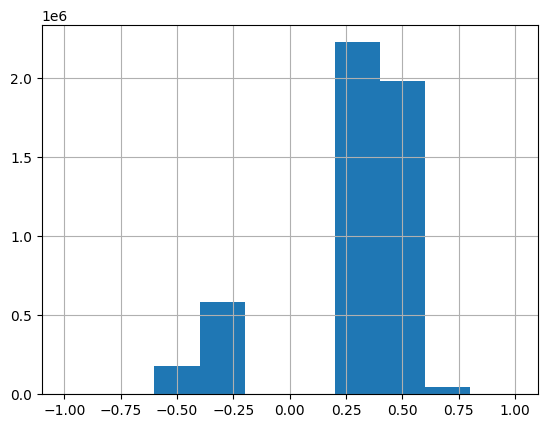

In [23]:
spearman_pairwise['coef'].hist(range=[-1, 1])

<Axes: >

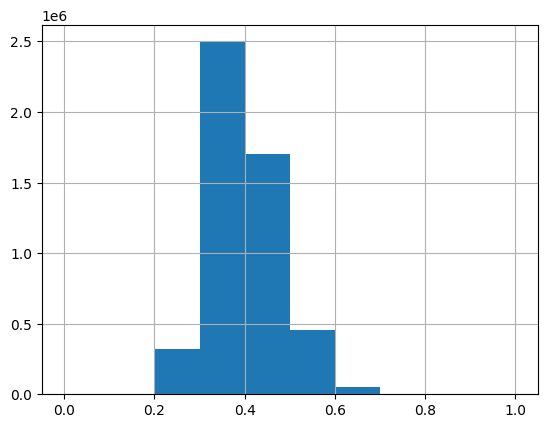

In [24]:
abs(spearman_pairwise['coef']).hist(range=[0, 1])

In [25]:
# filter for effect
df_no_effect = spearman_pairwise[abs(spearman_pairwise['coef'])<0.01]
df_very_small = spearman_pairwise[abs(spearman_pairwise['coef'])>=0.01]
df_very_small = df_very_small[abs(df_very_small['coef'])<0.1]
df_effect = spearman_pairwise[abs(spearman_pairwise['coef'])>=0.1]
print('\nNumber of analyte pairs whose effect size is at least weak: '.format(str(df_effect.shape[0])))


# evaluate effect size - cohen's d
df_small = spearman_pairwise[abs(spearman_pairwise['coef'])>=0.1]
df_small = df_small[abs(df_small['coef'])<0.2]
df_medium = spearman_pairwise[abs(spearman_pairwise['coef'])>=0.2]
df_medium  = df_medium[abs(df_medium['coef'])<0.3]
df_medium_large = spearman_pairwise[abs(spearman_pairwise['coef'])>=0.3]
df_medium_large = df_medium_large[abs(df_medium_large['coef'])<0.5]
df_large = spearman_pairwise[abs(spearman_pairwise['coef'])>=0.5]
df_large = df_large[abs(df_large['coef'])<0.7]
df_very_large = spearman_pairwise[abs(spearman_pairwise['coef'])>=0.7]
df_very_large = df_very_large[abs(df_very_large['coef'])<0.9]
df_huge = spearman_pairwise[abs(spearman_pairwise['coef'])>=0.9]

# print info on effect sizes
print('Number of Analyte Pairs with No Monotonic Relationship: {}'.format(str(df_no_effect.shape[0])))
print('Number of Analyte Pairs with Very Weak Monotonic Relationship: {}'.format(str(df_very_small.shape[0])))
print('Number of Analyte Pairs with Weak Monotonic Relationship: {}'.format(str(df_small.shape[0])))
print('Number of Analyte Pairs with Moderate Monotonic Relationship: {}'.format(str(df_medium.shape[0])))
print('Number of Analyte Pairs with Moderate Strong Monotonic Relationship: {}'.format(str(df_medium_large.shape[0])))
print('Number of Analyte Pairs with Strong Monotonic Relationship: {}'.format(str(df_large.shape[0])))
print('Number of Analyte Pairs with Very Strong Monotonic Relationship: {}'.format(str(df_very_large.shape[0])))
print('Number of Analyte Pairs with Near Perfect Monotonic Relationship: {}'.format(str(df_huge.shape[0])))


Number of analyte pairs whose effect size is at least weak: 
Number of Analyte Pairs with No Monotonic Relationship: 0
Number of Analyte Pairs with Very Weak Monotonic Relationship: 0
Number of Analyte Pairs with Weak Monotonic Relationship: 0
Number of Analyte Pairs with Moderate Monotonic Relationship: 320353
Number of Analyte Pairs with Moderate Strong Monotonic Relationship: 4194332
Number of Analyte Pairs with Strong Monotonic Relationship: 506943
Number of Analyte Pairs with Very Strong Monotonic Relationship: 1495
Number of Analyte Pairs with Near Perfect Monotonic Relationship: 0
